### 0. Config and utils.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn

In [ ]:
# Mounting the drive, initializing path to data.
from google.colab import drive
drive.mount('/content/drive')
PATH = '/content/drive/Shareddrives/TSWGAN/'
device = "cuda" if torch.cuda.is_available() else "cpu"
print("device: {}".format(device))

Mounted at /content/drive
device: cuda


In [ ]:
# CONFIG.

# time series params.
prediction_size = 10  # n_t in the article
condition_size  = 100 # n_h in the article
num_series      = 4  # the dimensionality of ts.
noise_size      = 10

# discriminator params.
d_kernel_size = 3
d_stride      = 1
d_alpha       = .5
d_padding     = d_kernel_size // 2

# generator params.
g_kernel_size = 3
g_stride      = 2
g_alpha       = .5
g_padding     = g_kernel_size // 2

# other params.
batch_size       = 32
num_steps        = 5            # the frequency of training disc per one gen training.
num_epochs       = 1000
latent_space_dim = 20

In [ ]:
# Dataset.
class TSWGANDataset(torch.utils.data.Dataset):
    def __init__(self, data, prediction_size=prediction_size, condition_size=condition_size):

        # TODO: deal better with multidimensional time series 
        self.data = torch.tensor(data) 

        # if we give a 1-d array we want the dataset to set num_series=1 (first axis)
        if len(self.data.shape) == 1:
            self.data = self.data[None, :]


        self.prediction_size = prediction_size
        self.condition_size = condition_size
        self.length = self.data.shape[1] - condition_size - prediction_size + 1 # improve also 

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        return (self.data[:, index:index + self.condition_size], 
               self.data[:, index+self.condition_size:index+self.condition_size+self.prediction_size])

In [ ]:
def compute_gradient_penalty(disc, real_samples, fake_samples, history): 
    """Calculates the gradient penalty loss for WGAN GP""" 
    # Random weight term for interpolation between real and fake samples 
    alpha = torch.rand((real_samples.size(0), 1, 1)) 
    # Get random interpolation between real and fake samples 
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True) 
    d_interpolates = disc(interpolates, history) 
    # print(interpolates.shape, d_interpolates.shape)
    # Get gradient w.r.t. interpolates 
    gradients = torch.autograd.grad( 
        outputs=d_interpolates, 
        inputs=interpolates, 
        grad_outputs=torch.ones(d_interpolates.shape, requires_grad=False), # gradients w.t. output. 1 is default 
        create_graph=True, 
        retain_graph=True, # keep all gradients for further optimization steps 
        only_inputs=True, 
    )[0] 
    gradients = gradients.contiguous().view(gradients.size(0), -1, 1) # maybe wrong
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean() 
    
    return gradient_penalty


In [ ]:
def generate_series(generator,
                    starting_points,
                    min, max,
                    num_steps=num_steps,
                    num_series=num_series):
    
    generated_series = starting_points
    # history_len = starting_points.shape[-1]

    for i in range(num_steps):
        new_samples = generator(generated_series[:, :, prediction_size*i:prediction_size*i+condition_size])
        generated_series = torch.cat((generated_series, new_samples), dim=2)
    
    for i in range(num_series):
        generated_series[0][i] = (generated_series[0][i]) * (max[i] - min[i]) + min[i]
    
    return generated_series

In [ ]:
class MetaLoss:

    def __init__(self, meta_names={"None":None}, weights=None):
        self.meta_names = meta_names
        self.weights    = weights

    def apply(self,
              real_data,
              generated_data): 

        loss = .0

        w = 0
        for feature in self.meta_names.values():
            loss += self.weights[w] * feature(real_data, generated_data) 
            w += 1  
        
        return loss

   


In [ ]:
# Define all the meta features here. 

def k_moment(data, k=1, abs=False, center=False):
        mean = torch.mean(data) if center else 0

        if abs:
            result = torch.mean(torch.abs(data - mean)**k)
        else:
            result = torch.mean((data - mean)**k)

        return result

def exp_diff(real_data, fake_data):
    return k_moment(real_data - fake_data)

def first_k_moments_diff(real_data, fake_data, k=2, abs=False, center=False):
    loss = .0

    for i in range(1, k + 1):
        batch_size_ = real_data.size()[0]
        for b in range(batch_size_):
            loss += torch.abs(
                   k_moment(real_data[b].view(-1), k=i, abs=abs, center=center)
                 - k_moment(fake_data[b].view(-1), k=i, abs=abs, center=center)) / batch_size_

    return loss

def quantile_abs_diffs(real_data, fake_data, quantiles=[.01, .99]):
    loss = .0

    for q in quantiles:
        batch_size_ = real_data.size()[0]
        for b in range(batch_size_):
            loss += torch.abs(
                    torch.quantile(real_data[b].view(-1), torch.tensor(q), interpolation='linear', dim=0, keepdim=True)
                - torch.quantile(fake_data[b].view(-1), torch.tensor(q), interpolation='linear', dim=0, keepdim=True))[0]

    return loss

    # data shape: torch.Size([32, 2, 10])

def mean_cov_matrix(data):
    '''
    # input: data of shape: torch.Size([batch_size, num_series, prediction_size])
    returns batch-mean cov matrix
    '''
    batch_size_ = data.size()[0]
    covmat = torch.cov(data[0])


    for b in range(1, batch_size_):
        covmat += torch.cov(data[b])
    
    return covmat / batch_size_

def cov_criterion(real_data, fake_data):
    """
    Calculates the nuclear norm between cov matrices of
    real and fake series.

    TS stationarity is needed but ok.

    To change the norm change the ord argument.
    """
    loss = .0

    real_covmat =  mean_cov_matrix(real_data)
    fake_covmat =  mean_cov_matrix(fake_data)

    # Calculate the nuclear matrix norm. ABS not needed, norm is abs-scalar-linear.
    loss = torch.linalg.norm(real_covmat - fake_covmat, ord="nuc")

    return loss

def multidim_quantile_criterion(real_data, fake_data, quantiles=[.01, .99]):
    
    loss = .0

    batch_size_ = real_data.size()[0]
    num_series_ = real_data.size()[1]

    for q in quantiles:
        real_q = torch.quantile(real_data, torch.tensor(q),
                                interpolation='linear',
                                dim=2, keepdim=True).view(batch_size_, num_series_)

        fake_q = torch.quantile(fake_data, torch.tensor(q),
                                interpolation='linear',
                                dim=2, keepdim=True).view(batch_size_, num_series_)

        loss += torch.linalg.norm(real_q - fake_q, ord="fro") / (batch_size_ * num_series_) 

    return loss

def pseudo_autocorrelation(data, k=prediction_size // 3):
    mean_     = torch.mean(data[:,:,k:], dim=2).view(data.size()[0], data.size()[1], -1)
    mean_lag_ = torch.mean(data[:,:,:-k], dim=2).view(data.size()[0], data.size()[1], -1)

    return torch.mean((data[:,:,k:] - mean_)*(data[:,:,:-k] - mean_lag_), dim=2)

def pseudo_autocorrelation_criterion(real_data, fake_data, k=prediction_size // 3, ord="fro"):
    batch_size_ = real_data.size()[0]
    num_series_ = real_data.size()[1]

    real_auto = pseudo_autocorrelation(real_data, k=k)
    fake_auto = pseudo_autocorrelation(fake_data, k=k)

    return torch.linalg.norm(real_auto - fake_auto, ord=ord) / (batch_size_ * num_series_)


def oscilation_regularizer(data, gamma=2):
    '''
    returns [batch_size_, num_series_] matrix with oscilation punishments
    '''
    extended_data = - torch.log(data + .001) * 10
    return torch.mean((2 * extended_data[:,:,1:-1] - extended_data[:,:,:-2] - extended_data[:,:,2:])**2, dim=2)

def oscilation_criterion(real_data, fake_data, gamma=2, ord="fro"):
    batch_size_ = real_data.size()[0]
    num_series_ = real_data.size()[1]

    real_p = oscilation_regularizer(real_data, gamma=gamma)
    fake_p = oscilation_regularizer(fake_data, gamma=gamma)

    return torch.linalg.norm(real_p - fake_p, ord=ord) / (batch_size_ * num_series_)

### 1. Conv1d TSGAN (Collapses a lot)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=1):
        super().__init__()

        # Original architecture by authors.
        self.orig_d_layers = nn.Sequential(
            nn.Conv1d(in_channels, 16, kernel_size=d_kernel_size, stride=d_stride, padding=d_padding),
            nn.LeakyReLU(d_alpha), 
            nn.Conv1d(16, 32, kernel_size=d_kernel_size, stride=d_stride, padding=d_padding),
            nn.LeakyReLU(d_alpha), 
            nn.Conv1d(32, 64, kernel_size=d_kernel_size, stride=d_stride, padding=d_padding),
            nn.LeakyReLU(d_alpha), 
            nn.Conv1d(64, 128, kernel_size=d_kernel_size, stride=d_stride, padding=d_padding),
            # nn.MaxPool1d(kernel_size=2) -- have to deal with the dimensionality in a correct way
        )

        self.dense = nn.Sequential(
            nn.Linear(128, 1),
            nn.Tanh()
        )

    def forward(self, x, history):

        # this the case when we do not take batch -- maniually setting batch_size=1
        if len(history.shape) == 2:
            history = history.view(1, history.size(0), history.size(1))
        
        x = torch.cat((history, x), dim=2).float() # is it ok?

        # print(x.size())
        x = self.orig_d_layers(x)
        # print(x.size())
        x = x.view(x.size(0), -1, 128)
        # print(x.size())
        x = self.dense(x)

        # Need a smarter way to get rid off L_out != 1
        x = torch.mean(x, axis=1)[:,None, :]
        #print(x.size())

        return x


In [ ]:
class Generator(nn.Module):
    def __init__(self, input_size=noise_size + condition_size, 
                 prediction_size=prediction_size, noise_size=noise_size):
        super().__init__()

        self.noise_size = noise_size
        self.prediction_size = prediction_size

        # Original architecture by authors.
        self.dense = nn.Linear(input_size, prediction_size * 256)
        self.orig_g_layers = nn.Sequential(
            nn.LeakyReLU(g_alpha),
            nn.Conv1d(256, 64, kernel_size=g_kernel_size, stride=g_stride, padding=g_padding),
            nn.LeakyReLU(g_alpha),
            nn.Conv1d(64, prediction_size, kernel_size=g_kernel_size, stride=g_stride, padding=g_padding),
            #nn.LeakyReLU(g_alpha),
            #nn.Conv1d(prediction_size, prediction_size, kernel_size=g_kernel_size, stride=g_stride, padding=g_padding),  
            nn.Sigmoid()
        )
    
    def forward(self, x):
        # this the case when we do not take batch of elements -- maniually setting batch_size=1
        if len(x.shape) == 2:
            x = x.view(1, x.size(0), x.size(1))

        # creating batch_size x num_series x noise_size random tensor and concat it with x
        noise = torch.randn(size=(x.size(0), x.size(1), self.noise_size))
        x = torch.cat((x, noise), dim=2).float()


        x = self.dense(x)
        x = x.view(x.size(0), 256, -1)
        x = self.orig_g_layers(x)

        # Here we have the output of shape (N, C_out, L_out), L_out need to be reduced to 1.
        # In order to have the proper shape.
        x = torch.mean(x, axis=2)[:,:, None]  
        x = x.view(x.size(0), 1, self.prediction_size)
        return x
        

In [ ]:
from tqdm.notebook import tqdm

def train(dataloader, device, num_epochs=num_epochs):
    """
    performs a single epoch pass
    """

    gen = Generator()
    disc = Discriminator()

    g_optim = torch.optim.RMSprop(gen.parameters(),
                                  lr=1e-3, alpha=0.99, eps=1e-08,
                                  weight_decay=0, momentum=0, centered=False)
    d_optim = torch.optim.RMSprop(disc.parameters(),
                                  lr=1e-3, alpha=0.99, eps=1e-08,
                                  weight_decay=0, momentum=0, centered=False)
    g_losses, d_losses = [], []

    for x in tqdm(range(200)):
        for index, (history, true_samples) in enumerate(dataloader):
            pred_samples = gen(history)

            disc_pred_fake = disc(pred_samples, history)
            disc_pred_real = disc(true_samples, history)

            loss_grad = compute_gradient_penalty(disc, true_samples, pred_samples, history)

            loss = - torch.mean(disc_pred_real) + torch.mean(disc_pred_fake) + 10 * loss_grad

            d_optim.zero_grad()
            loss.backward(retain_graph=True)
            d_optim.step()
            d_losses.append((- torch.mean(disc_pred_real) + torch.mean(disc_pred_fake) + 10 * loss_grad))


            if index % 2 == 0:
                pred_samples = gen(history)
                disc_pred_fake = disc(pred_samples, history)

                loss_gen = - torch.mean(disc_pred_fake)
                g_optim.zero_grad()
                loss_gen.backward()
                g_optim.step()
                g_losses.append(- torch.mean(disc_pred_fake))

        print(f"D_loss: {torch.tensor(d_losses).mean()}, G_loss: {torch.tensor(g_losses).mean()}")
        # history, sample = next(iter_dataloader)

        plt.plot(np.arange(100), history[0][0])
        plt.plot(np.arange(100, 110), gen(history)[0][0].detach().numpy())
        plt.plot(np.arange(100, 110), true_samples[0][0])
        plt.show()

                

    return gen, disc


### 2. MLP TSGAN

In [ ]:
class GeneratorMLP(nn.Module):
    def __init__(self,
                 latent_space_dim=latent_space_dim,
                 condition_size=condition_size,
                 prediction_size=prediction_size,
                 num_series=num_series):
        
        super().__init__()
        self.num_series       = num_series
        self.latent_space_dim = latent_space_dim
        self.condition_size   = condition_size

        self.layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.latent_space_dim + self.condition_size * self.num_series, 1000),
            nn.LeakyReLU(),
            nn.Linear(1000, 500),
            nn.LeakyReLU(),
            nn.Linear(500, 100),
            nn.LeakyReLU(),
            nn.Linear(100, prediction_size * self.num_series),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        # x is a tensor of shape (batch_size, num_series, num_samples)
        noise = torch.randn(size=(x.size(0), 1, self.latent_space_dim))
        x = x.reshape(x.size(0), 1, -1)
        x = torch.cat((x, noise), dim=2).float()
        x = self.layers(x)[:, None, :]
        x = x.view(x.size(0), self.num_series, -1)

        return x


In [ ]:
class DiscriminatorMLP(nn.Module):
    def __init__(self,
                 wgan=False,
                 condition_size=condition_size,
                 prediction_size=prediction_size,
                 num_series=num_series):
        
        super().__init__()

        self.prediction_size = prediction_size
        self.condition_size  = condition_size
        self.num_series      = num_series

        self.layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear((self.condition_size + self.prediction_size) * self.num_series, 1000),
            nn.LeakyReLU(),
            nn.Linear(1000, 500),
            nn.LeakyReLU(),
            nn.Linear(500, 10),
            nn.LeakyReLU(),
            nn.Linear(10, 1)
        )

        self.activation = nn.Tanh() if wgan else nn.Sigmoid()
    
    def forward(self, x, history):
        # x is a tensor of shape (batch_size, num_series, num_samples)
        x = torch.cat((x, history), dim=2).float()
        x = self.layers(x)
        x = self.activation(x)

        return x


In [ ]:
from tqdm.notebook import tqdm

def train_mlp(dataloader,
              device=device,
              num_epochs=num_epochs,
              wgan=False, 
              draw_graphs=True,
              num_series=num_series,
              meta_flag=True):
    """
    
    """

    gen = GeneratorMLP(num_series=num_series)
    disc = DiscriminatorMLP(wgan=wgan, num_series=num_series) 

    g_optim = torch.optim.RMSprop(gen.parameters(),
                                  lr=1e-3, alpha=0.99, eps=1e-08,
                                  weight_decay=0, momentum=0, centered=False)
    
    d_optim = torch.optim.RMSprop(disc.parameters(),
                                  lr=1e-3, alpha=0.99, eps=1e-08,
                                  weight_decay=0, momentum=0, centered=False)
    g_losses, d_losses = [], []

    criterion = nn.BCELoss()

    # Meta-Features.
    weights = [2, 1, 1, 1]
    meta_names = {"oscilation_criterion":oscilation_criterion,
                  "stationaty covariation criterion":cov_criterion,
                  ".01, .99 quantiles": multidim_quantile_criterion,
                  "autocorrelation (not normalized) criterion": pseudo_autocorrelation_criterion}
    meta = MetaLoss(meta_names=meta_names, weights=weights)

    for x in tqdm(range(num_epochs)):
        for index, (history, true_samples) in enumerate(dataloader):
            history, true_samples = history.float(), true_samples.float()
            pred_samples = gen(history)
            # print(history.shape, pred_samples.shape, true_samples.shape)

            disc_pred_fake = disc(pred_samples, history)
            disc_pred_real = disc(true_samples, history)

            if wgan:
                loss_grad = compute_gradient_penalty(disc, true_samples, pred_samples, history)
                loss      = - torch.mean(disc_pred_real) + torch.mean(disc_pred_fake) + loss_grad
            else:
                loss      = criterion(disc_pred_real, torch.ones_like(disc_pred_real))
                loss     += criterion(disc_pred_fake, torch.zeros_like(disc_pred_fake))

            # Make a step.
            d_optim.zero_grad()
            loss.backward(retain_graph=True)
            d_optim.step()
            d_losses.append(loss.item())


            if index % num_steps == 0:
                pred_samples   = gen(history)
                disc_pred_fake = disc(pred_samples, history)
                
                if wgan:
                    loss_gen = - torch.mean(disc_pred_fake)
                else:
                    loss_gen = criterion(disc_pred_fake, torch.ones_like(disc_pred_fake))

                if meta_flag:
                    loss_gen += meta.apply(true_samples, pred_samples)
                   
                g_optim.zero_grad()
                loss_gen.backward()
                g_optim.step()
                g_losses.append(loss_gen.item())

        # history, sample = next(iter_dataloader)
        if draw_graphs and x % 25 == 0:
            fig = plt.figure(figsize=(12, 9))
            plt.title("Etherium-USD dynamics")
            plt.plot(np.arange(condition_size), history[0][0], color='r', label='real', ls='--')
            plt.plot(np.arange(condition_size - 1, condition_size + prediction_size - 1), gen(history)[0][0].detach().numpy(), color='b', label='gen')
            plt.plot(np.arange(condition_size - 1, condition_size + prediction_size - 1), true_samples[0][0], color='r', ls='--')
            plt.legend()
            plt.show()
            print(f"D_loss: {torch.tensor(d_losses).mean()}, G_loss: {torch.tensor(g_losses).mean()}")

    return gen, disc


#### 2.1 Single series test of normal GAN

In [ ]:
ETH_USD_df = pd.read_csv(PATH + "ETH-USD.csv")
eth_min = ETH_USD_df['High'].min()
eth_max = ETH_USD_df['High'].max() 

# minmax scaling to [0, 1].
scaled_eth_usd = (ETH_USD_df['High'] - ETH_USD_df['High'].min())/ (ETH_USD_df['High'].max() - ETH_USD_df['High'].min())

In [ ]:
dataset = TSWGANDataset(scaled_eth_usd)
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=32,
    shuffle=True
)

  0%|          | 0/1000 [00:00<?, ?it/s]

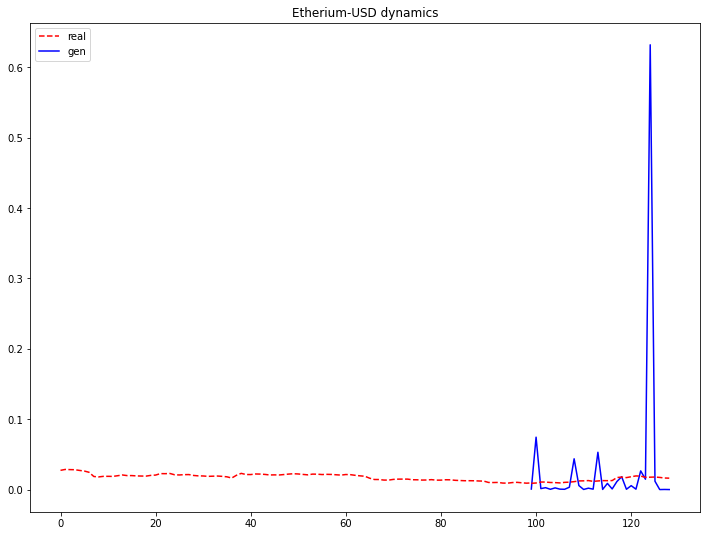

D_loss: 1.236341118812561, G_loss: 3.663142681121826


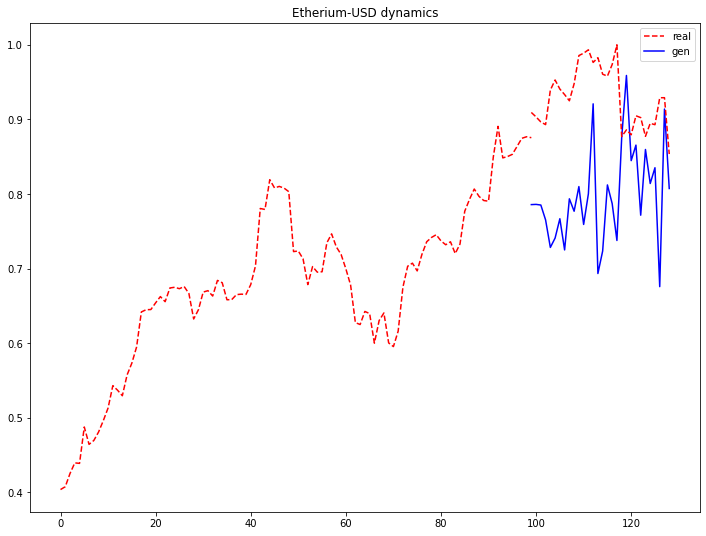

D_loss: 1.103162407875061, G_loss: 1.937471628189087


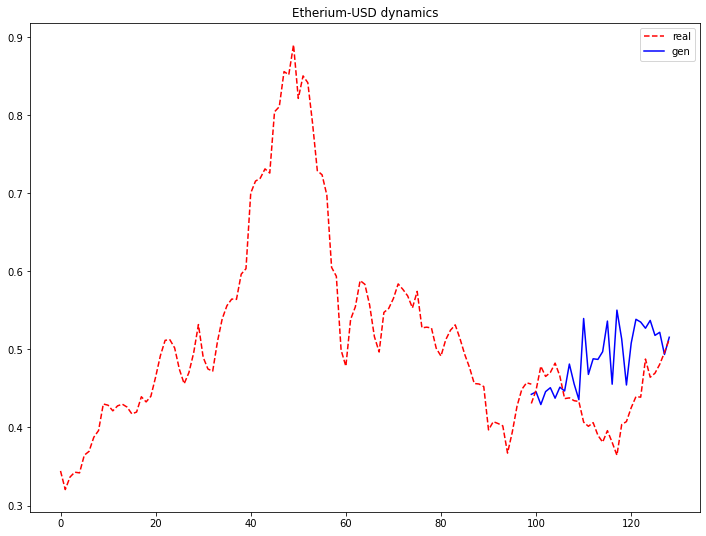

D_loss: 1.0042307376861572, G_loss: 2.3297319412231445


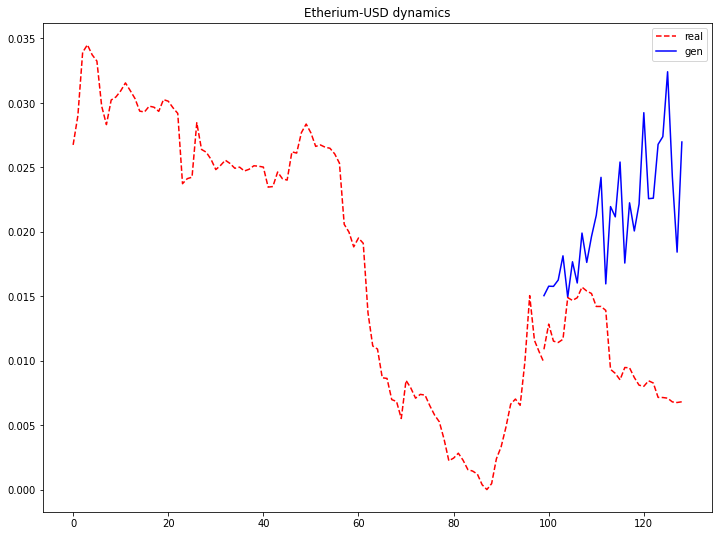

D_loss: 0.949041485786438, G_loss: 2.568495035171509


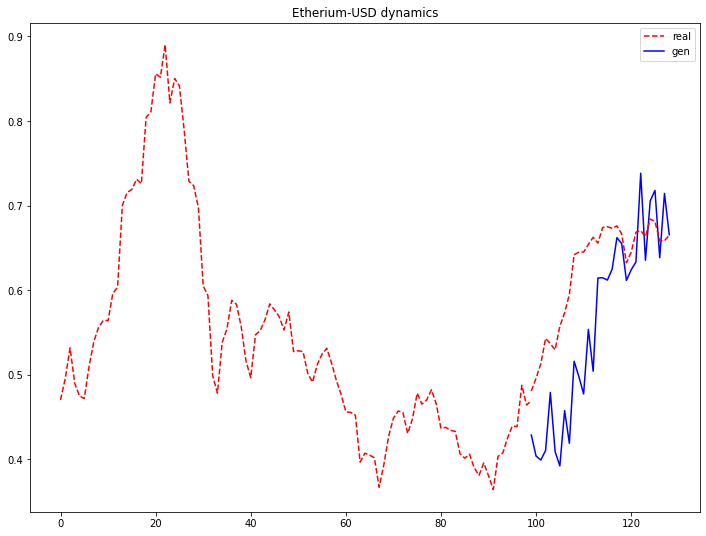

D_loss: 0.9019704461097717, G_loss: 2.846235990524292


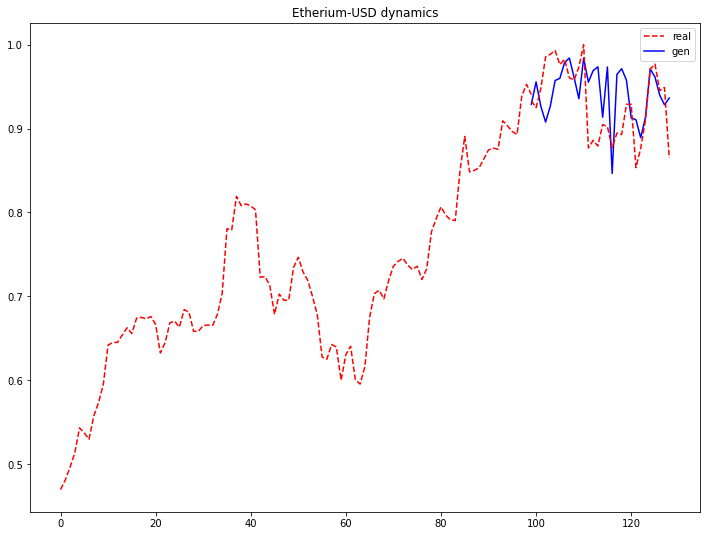

D_loss: 0.8515206575393677, G_loss: 3.1566507816314697


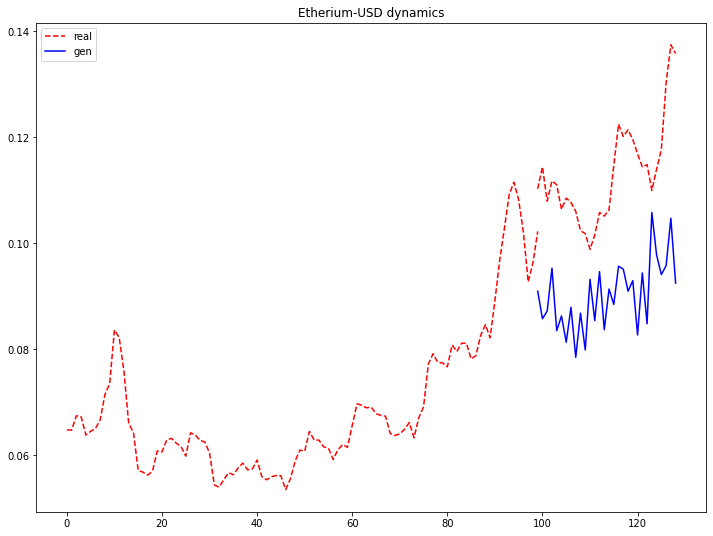

D_loss: 0.8075768351554871, G_loss: 3.4710142612457275


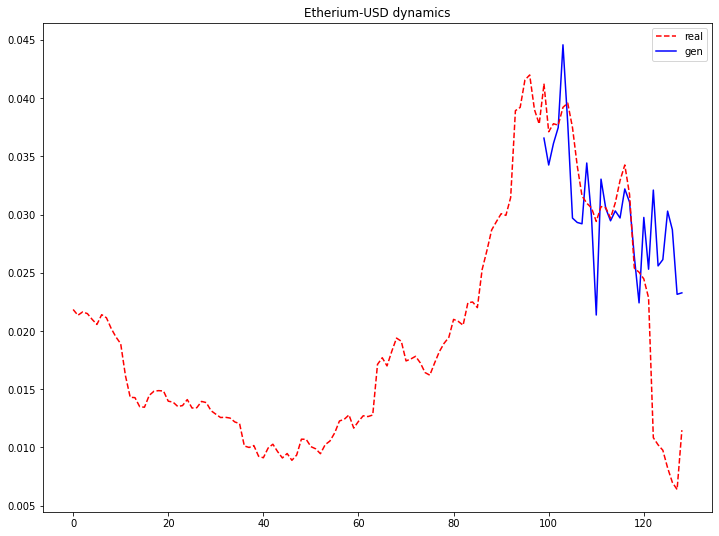

D_loss: 0.7688490152359009, G_loss: 3.7932236194610596


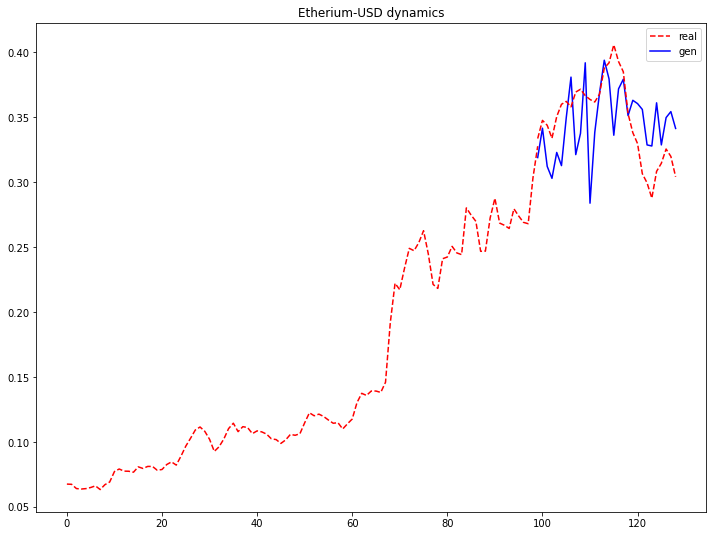

D_loss: 0.7347519397735596, G_loss: 4.074567794799805


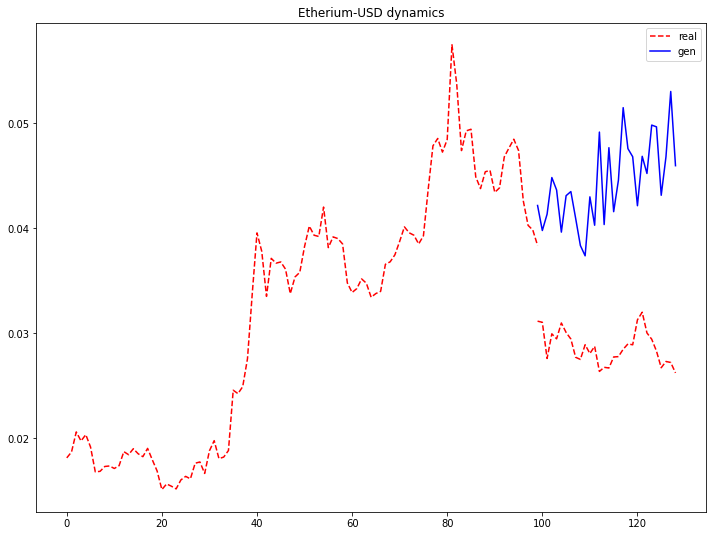

D_loss: 0.7059609889984131, G_loss: 4.340904712677002


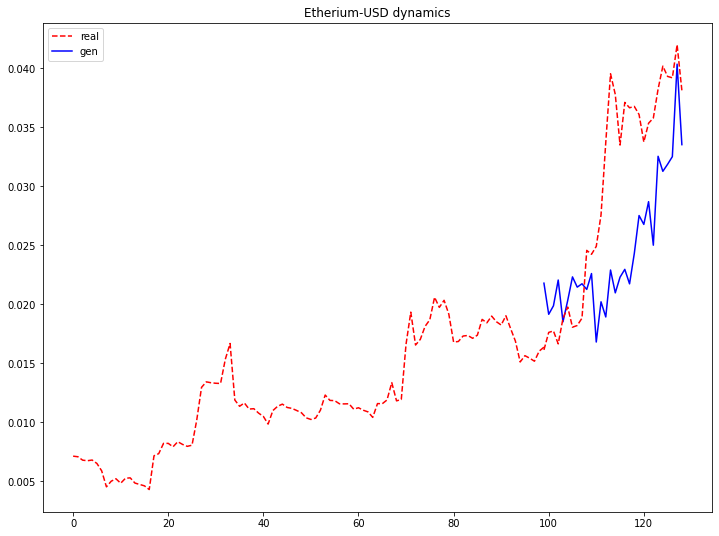

D_loss: 0.6792042255401611, G_loss: 4.581401824951172


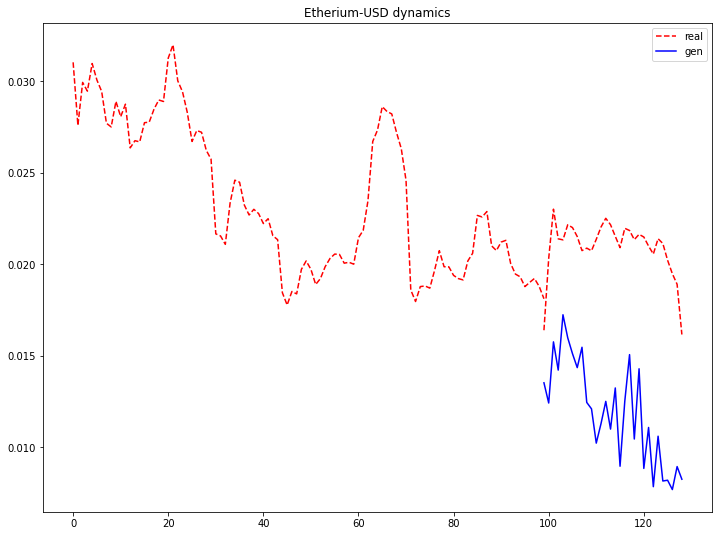

D_loss: 0.6575782895088196, G_loss: 4.808564186096191


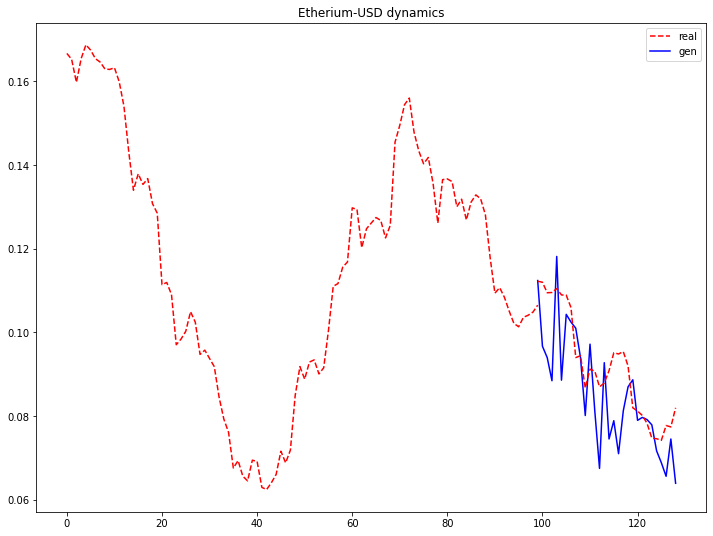

D_loss: 0.640182375907898, G_loss: 5.010623931884766


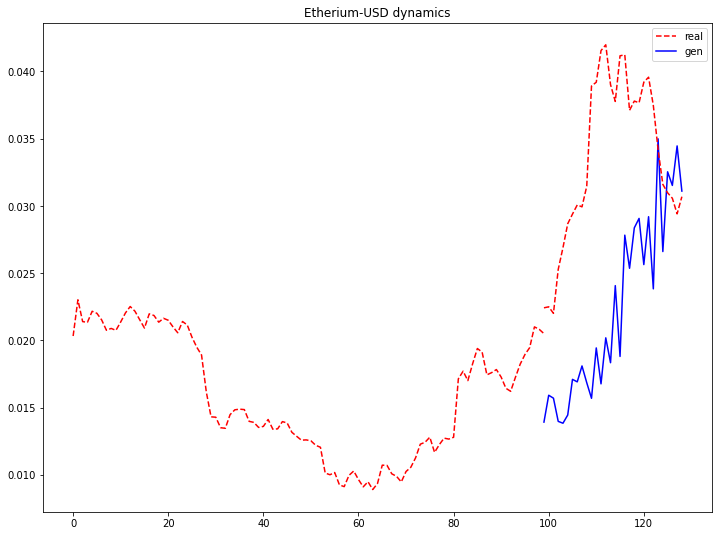

D_loss: 0.6270748972892761, G_loss: 5.1808953285217285


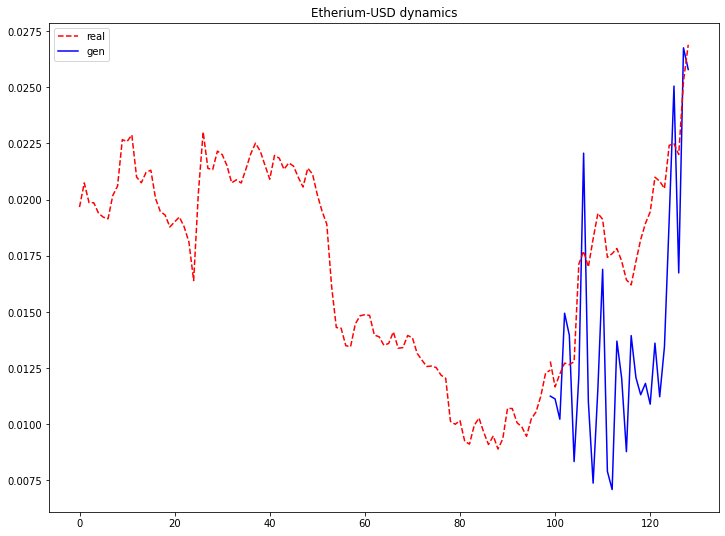

D_loss: 0.6151285171508789, G_loss: 5.3285017013549805


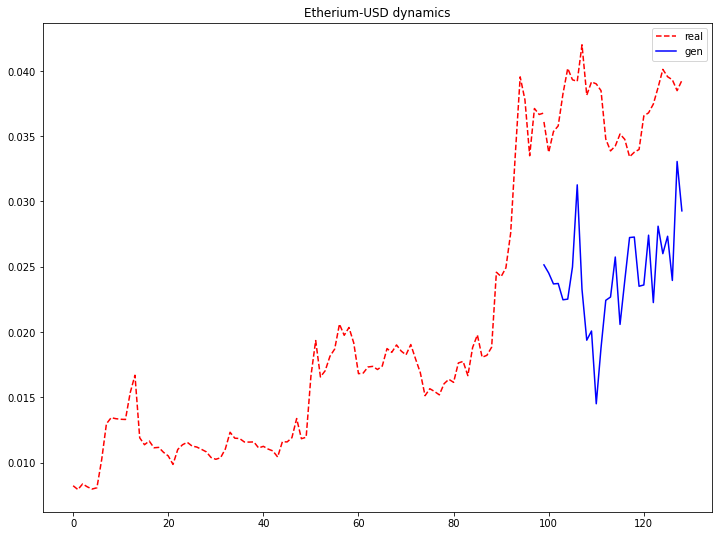

D_loss: 0.6041887402534485, G_loss: 5.4721150398254395


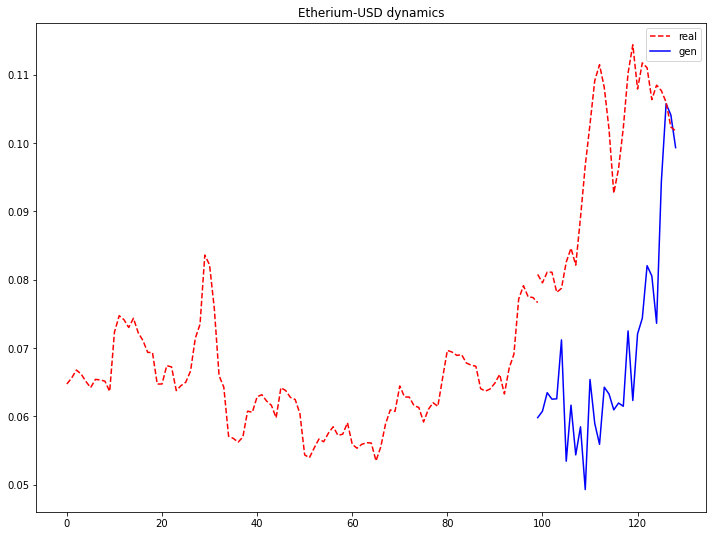

D_loss: 0.5946613550186157, G_loss: 5.611395835876465


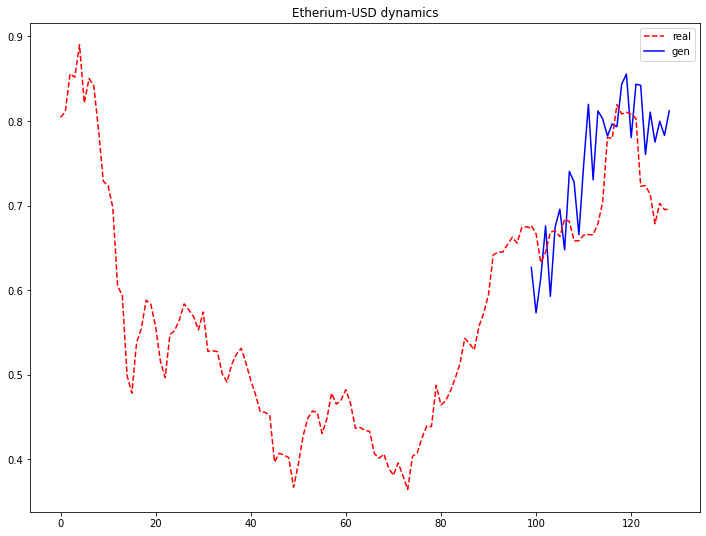

D_loss: 0.5858149528503418, G_loss: 5.742056846618652


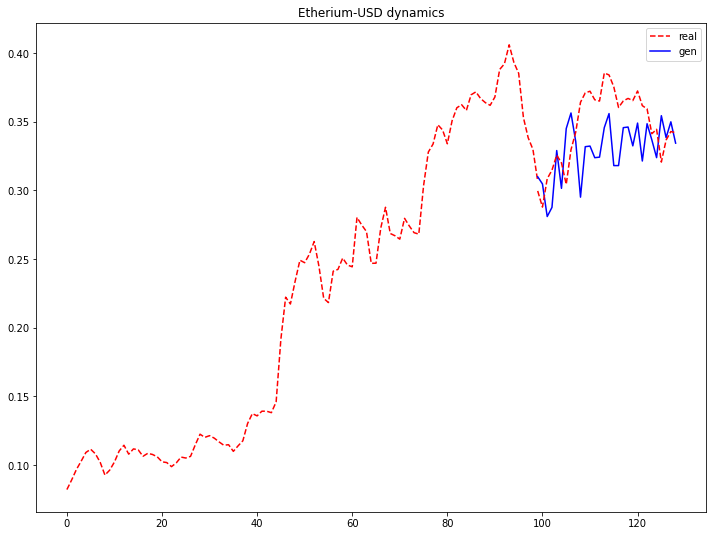

D_loss: 0.5782549977302551, G_loss: 5.847683906555176


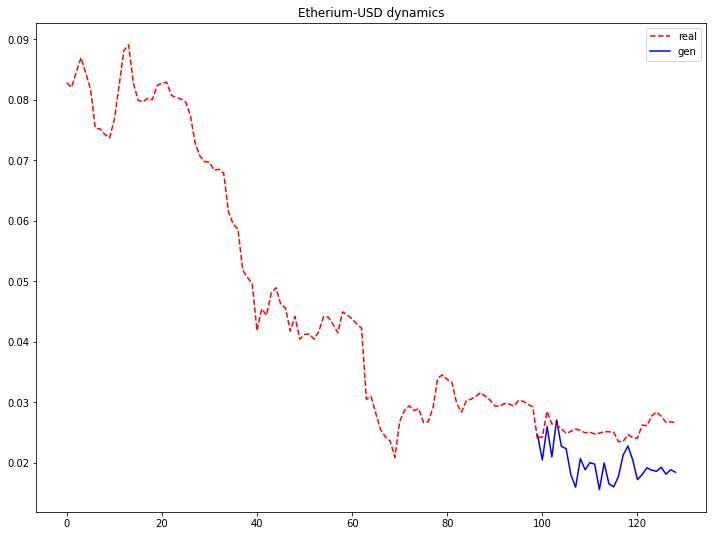

D_loss: 0.5706846117973328, G_loss: 5.967692852020264


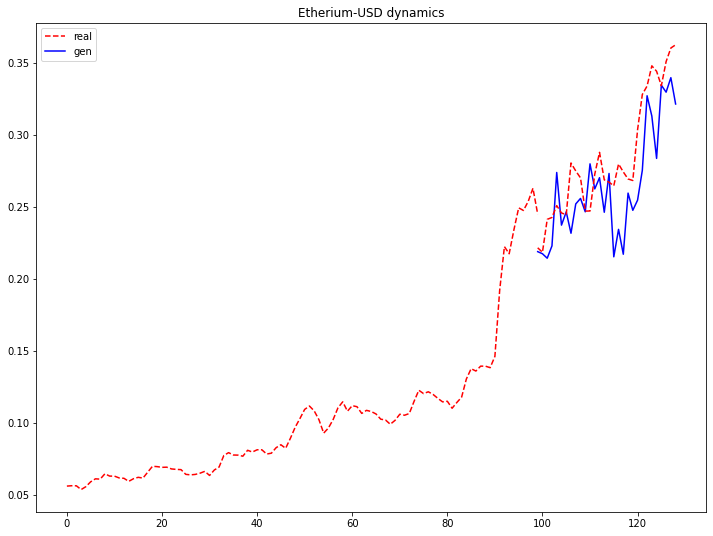

D_loss: 0.5643000602722168, G_loss: 6.08323860168457


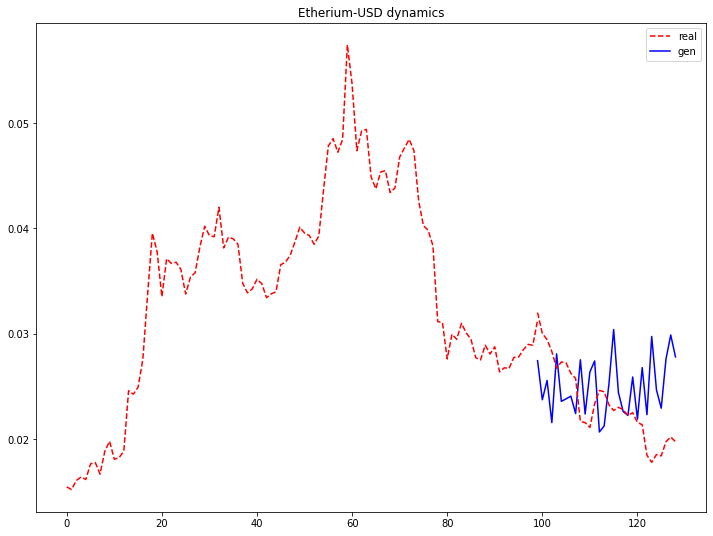

D_loss: 0.558698296546936, G_loss: 6.176972389221191


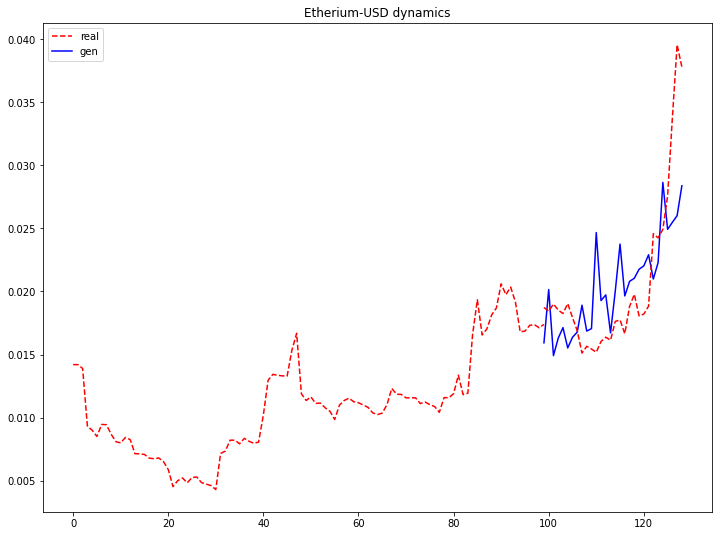

D_loss: 0.5525655150413513, G_loss: 6.273696422576904


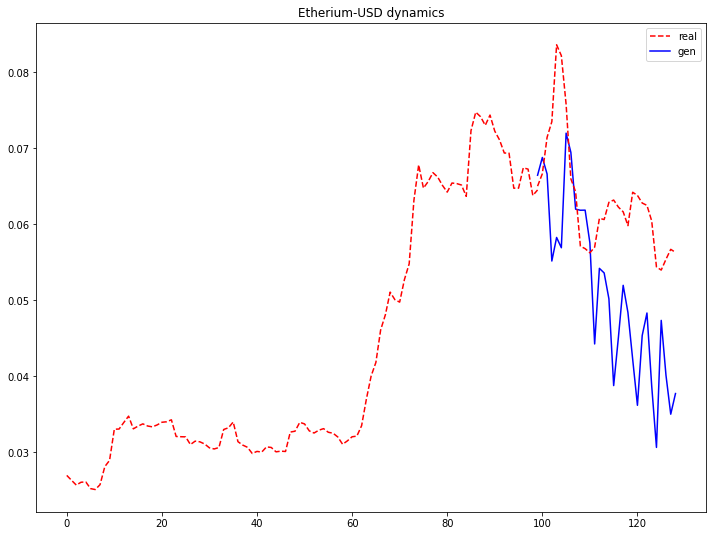

D_loss: 0.5475799441337585, G_loss: 6.36285924911499


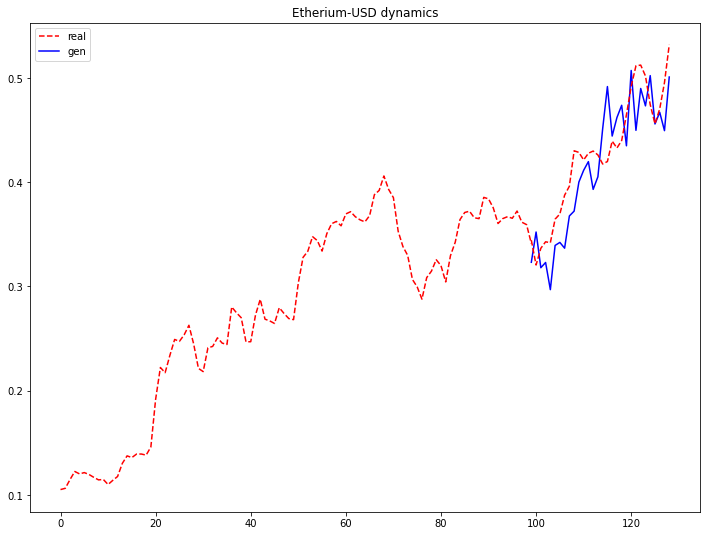

D_loss: 0.5425068736076355, G_loss: 6.44001579284668


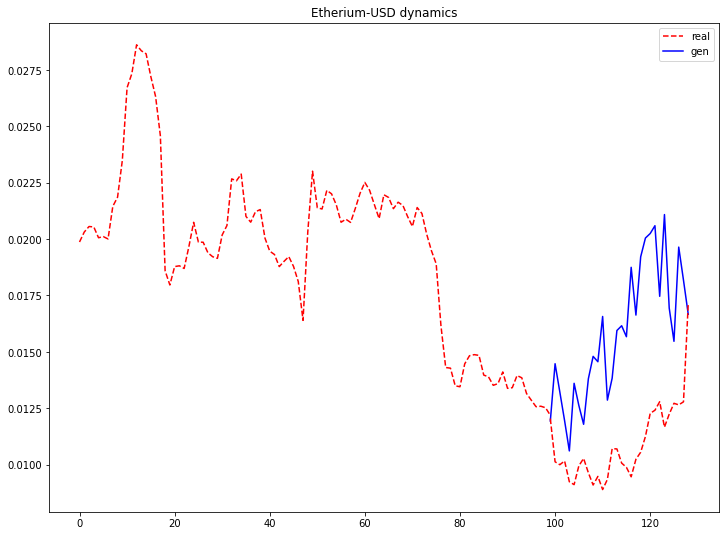

D_loss: 0.5376522541046143, G_loss: 6.523026943206787


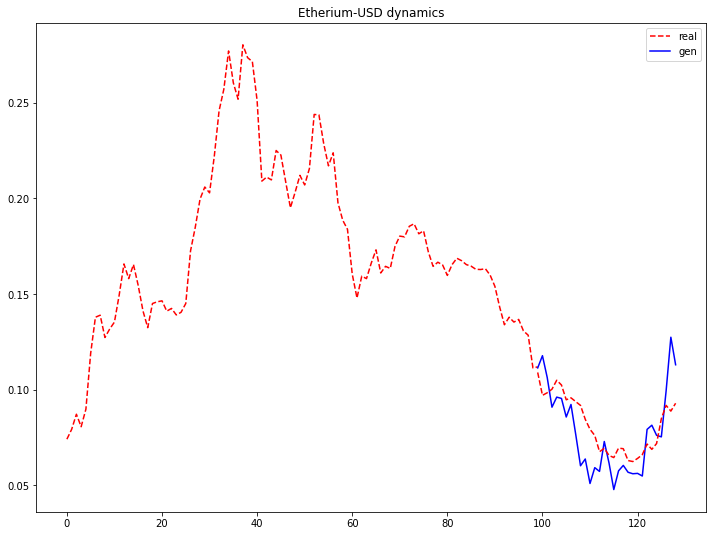

D_loss: 0.5334418416023254, G_loss: 6.6075263023376465


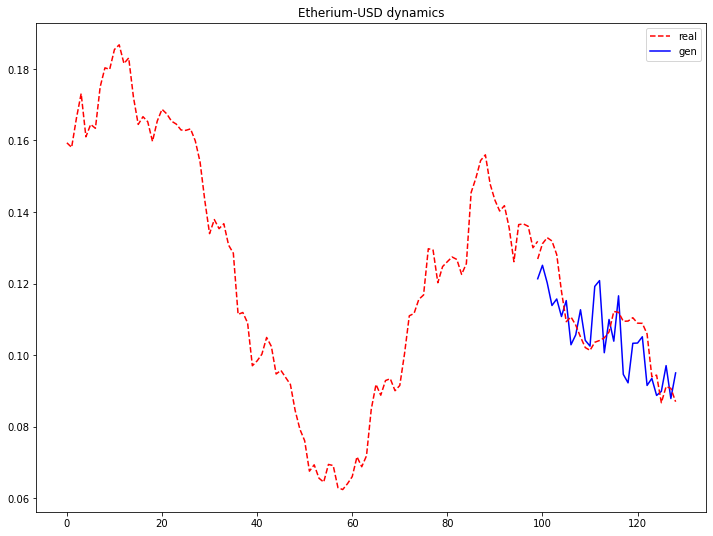

D_loss: 0.5296663045883179, G_loss: 6.684013366699219


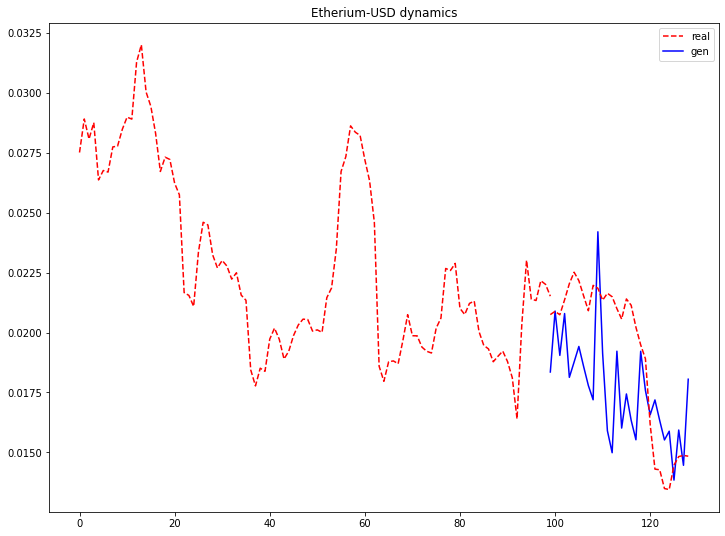

D_loss: 0.525784969329834, G_loss: 6.7628302574157715


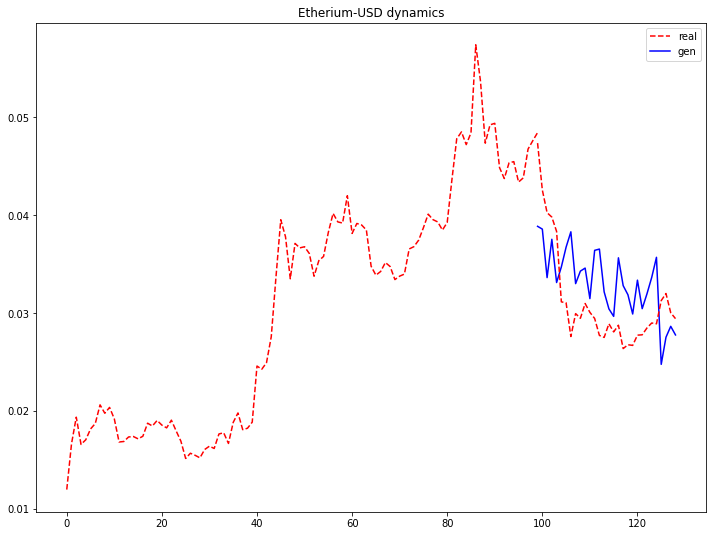

D_loss: 0.5224899649620056, G_loss: 6.829948425292969


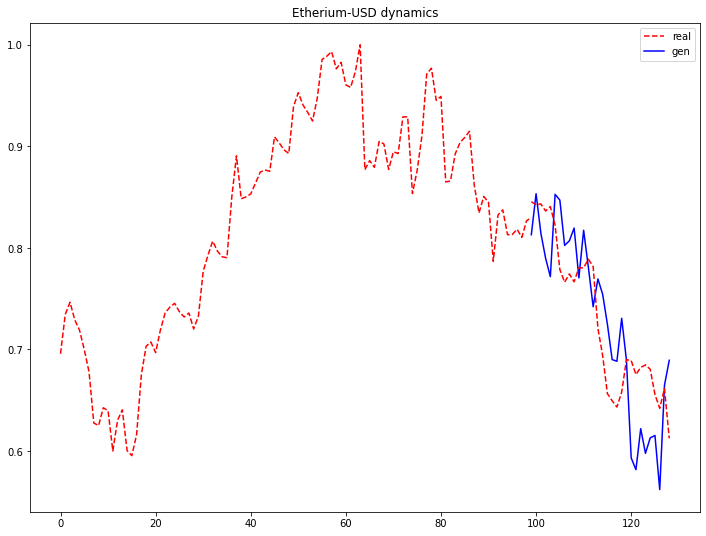

D_loss: 0.519399881362915, G_loss: 6.891456604003906


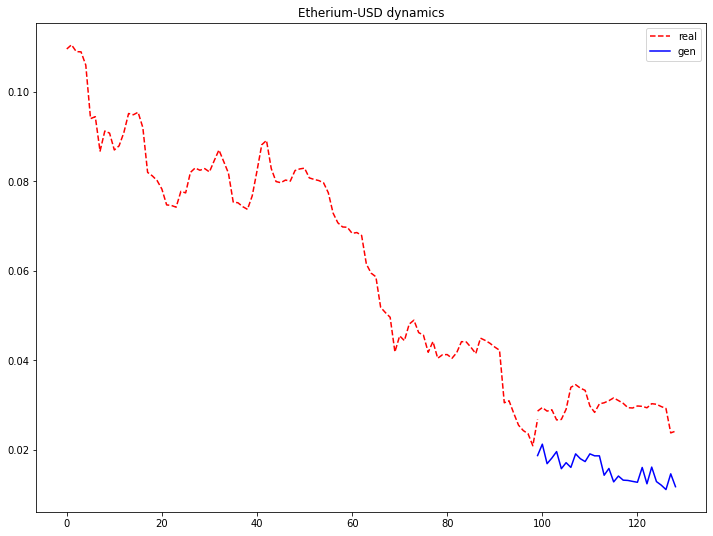

D_loss: 0.5162357687950134, G_loss: 6.949261665344238


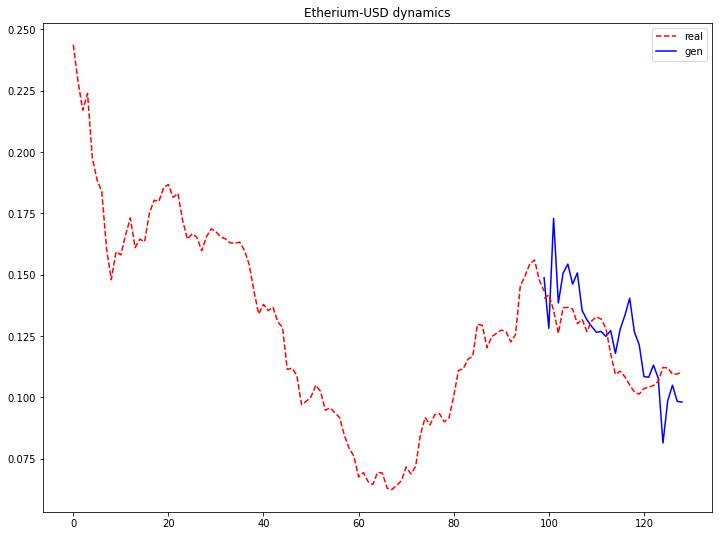

D_loss: 0.513559877872467, G_loss: 6.998762130737305


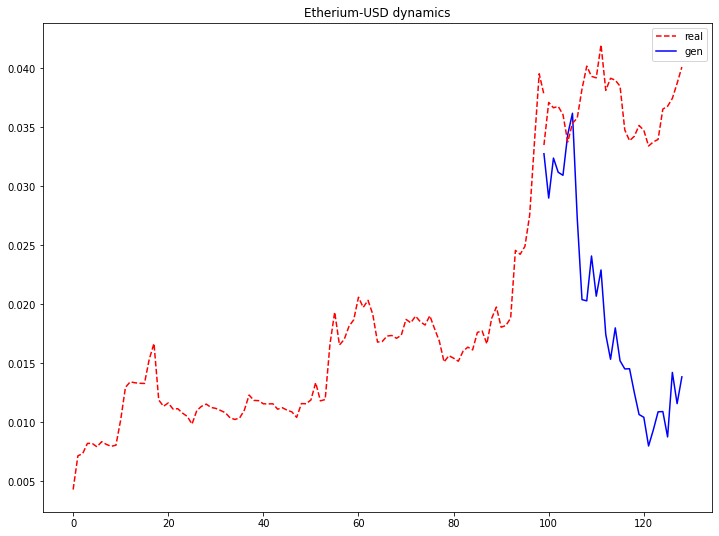

D_loss: 0.5109327435493469, G_loss: 7.043272018432617


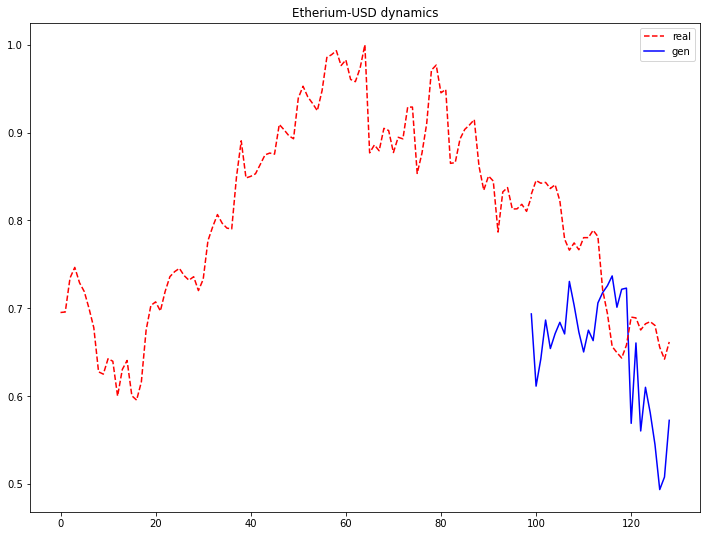

D_loss: 0.5083258748054504, G_loss: 7.086250305175781


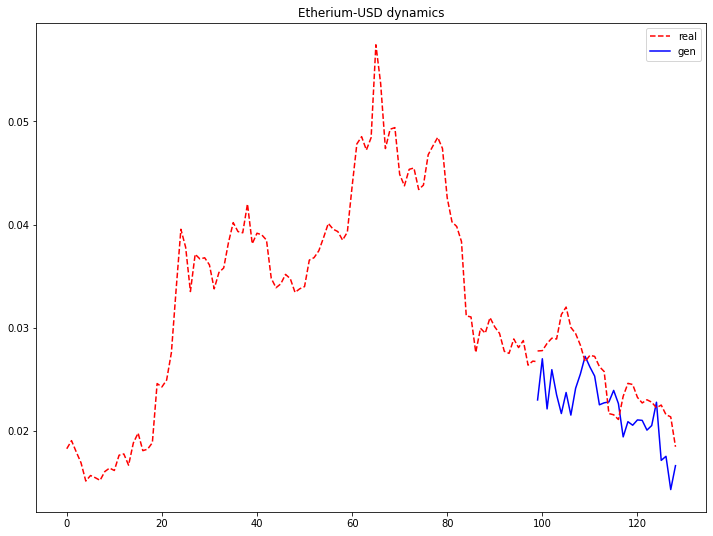

D_loss: 0.505167543888092, G_loss: 7.132583141326904


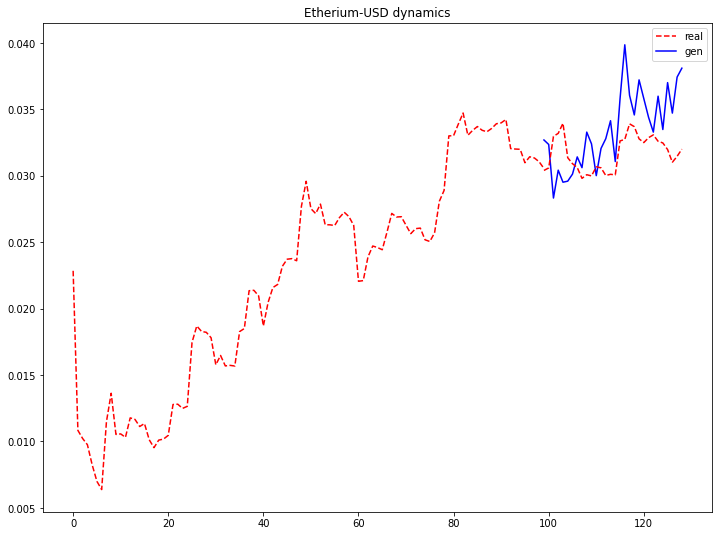

D_loss: 0.5025894045829773, G_loss: 7.176154613494873


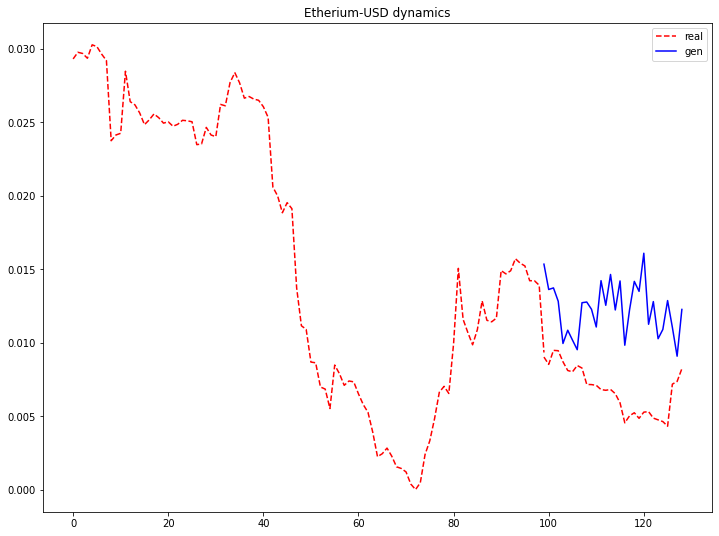

D_loss: 0.5002109408378601, G_loss: 7.211209297180176


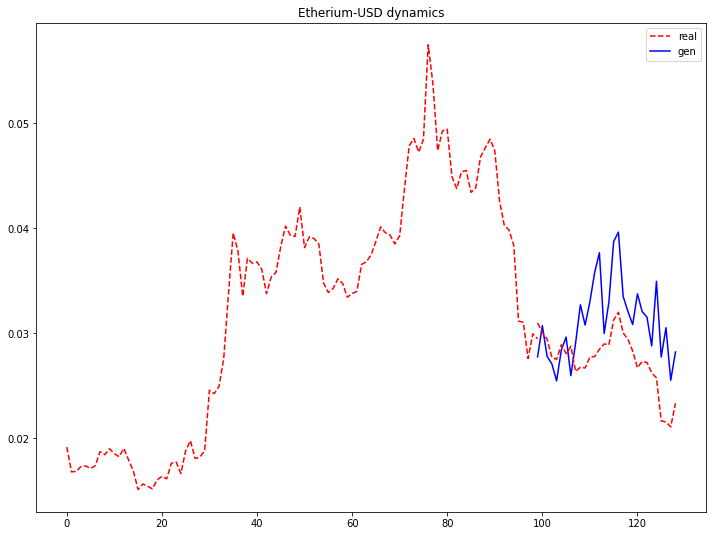

D_loss: 0.4982534945011139, G_loss: 7.249687194824219


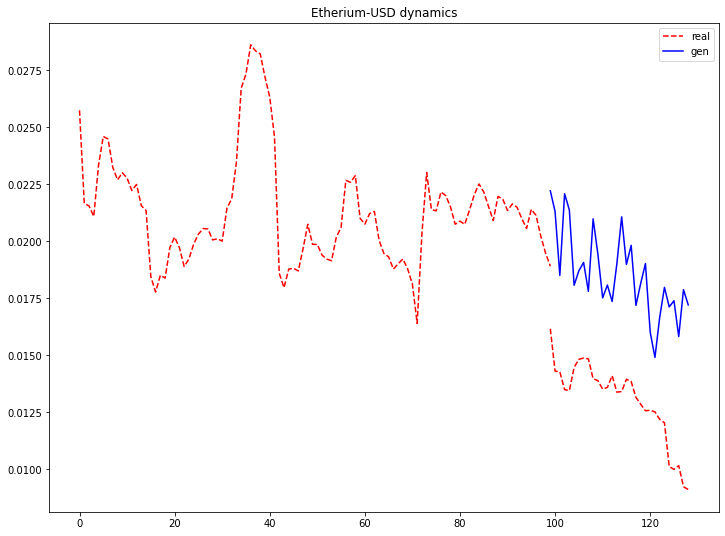

D_loss: 0.4964485168457031, G_loss: 7.278301239013672


In [ ]:
gen_clean, disc_clean = train_mlp(dataloader, device, draw_graphs=True, meta_flag=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

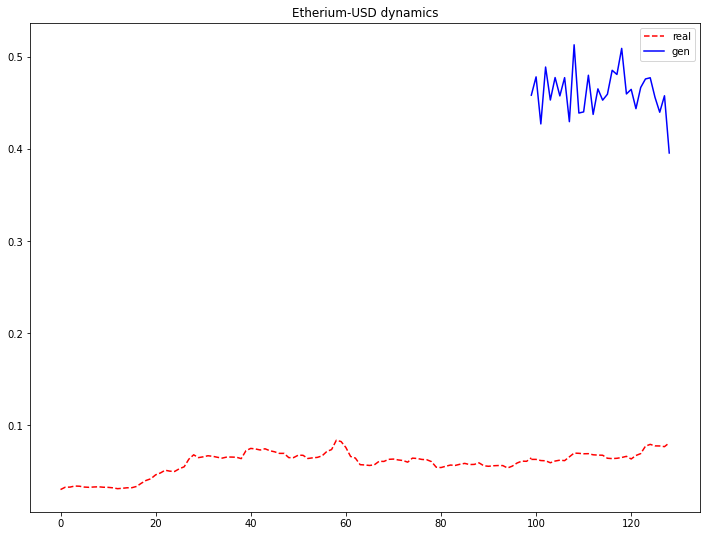

D_loss: 0.6673763394355774, G_loss: 27.22573471069336


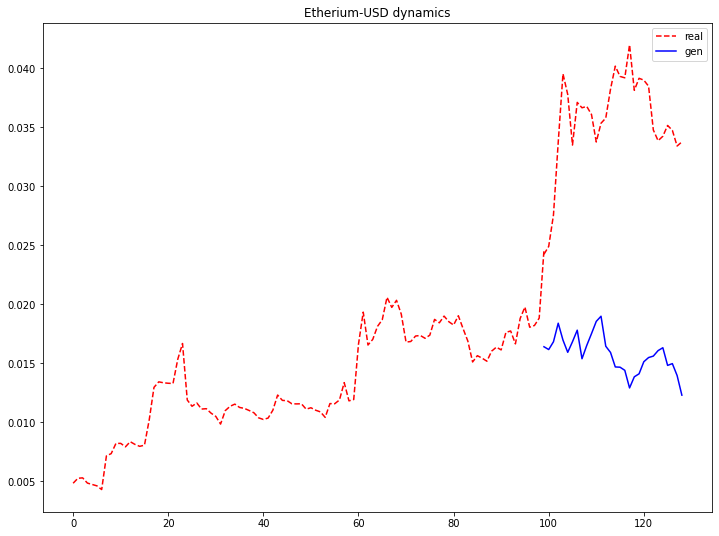

D_loss: 0.8619131445884705, G_loss: 4.5257134437561035


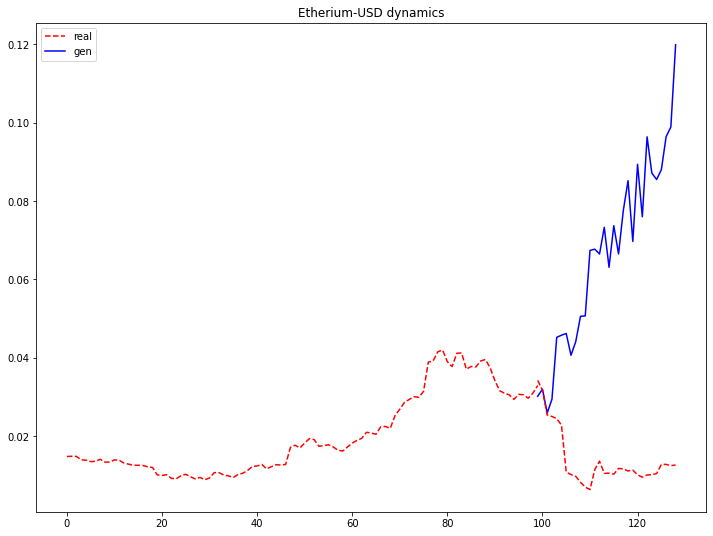

D_loss: 0.8525010347366333, G_loss: 3.9846105575561523


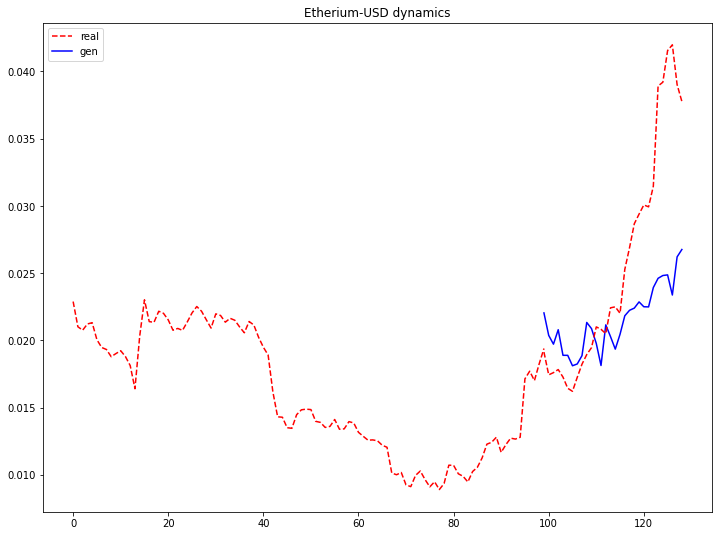

D_loss: 0.8293588161468506, G_loss: 3.8040366172790527


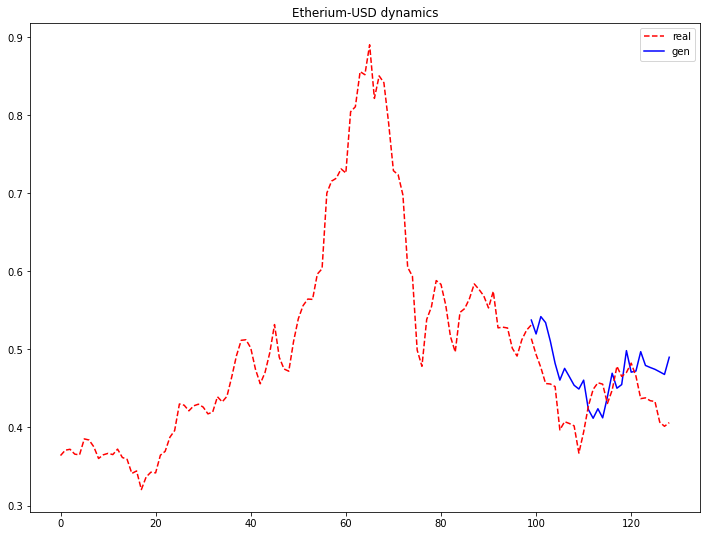

D_loss: 0.7897757887840271, G_loss: 3.8400535583496094


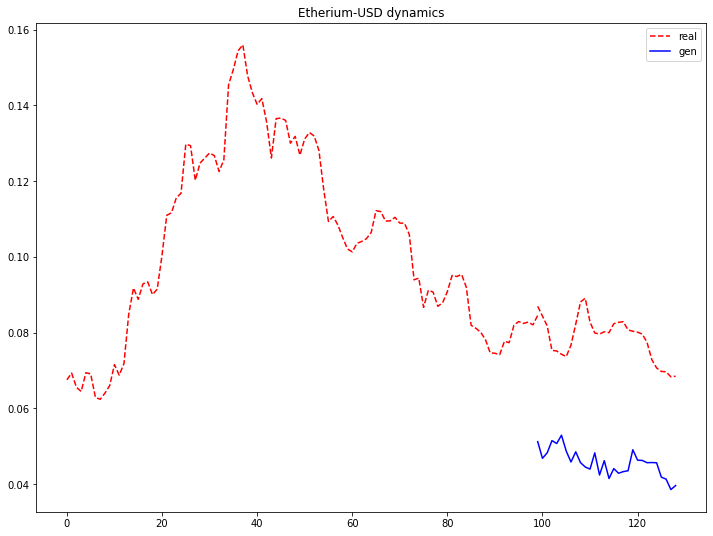

D_loss: 0.7441622614860535, G_loss: 3.9843103885650635


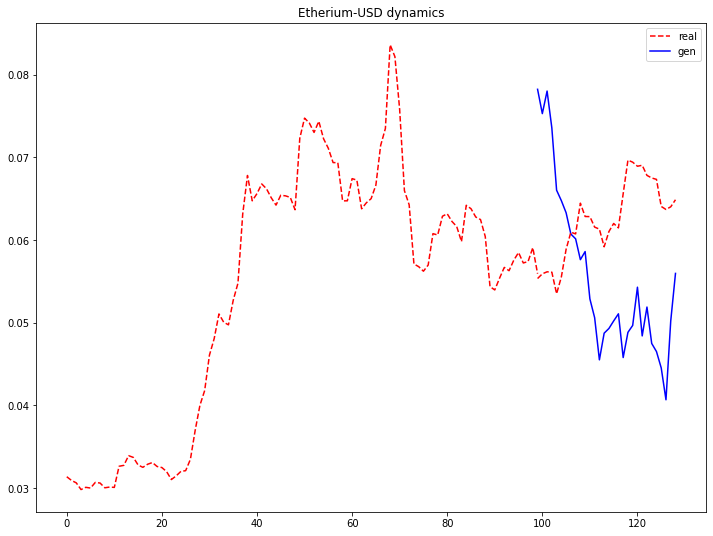

D_loss: 0.7072456479072571, G_loss: 4.147812843322754


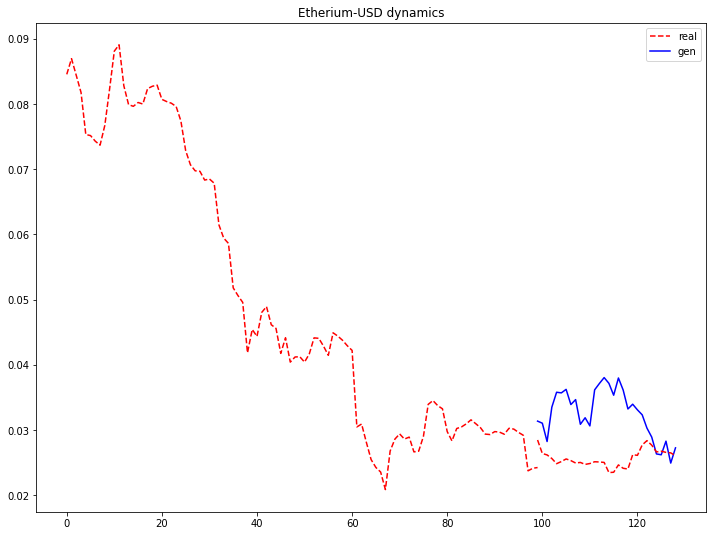

D_loss: 0.677952229976654, G_loss: 4.282850742340088


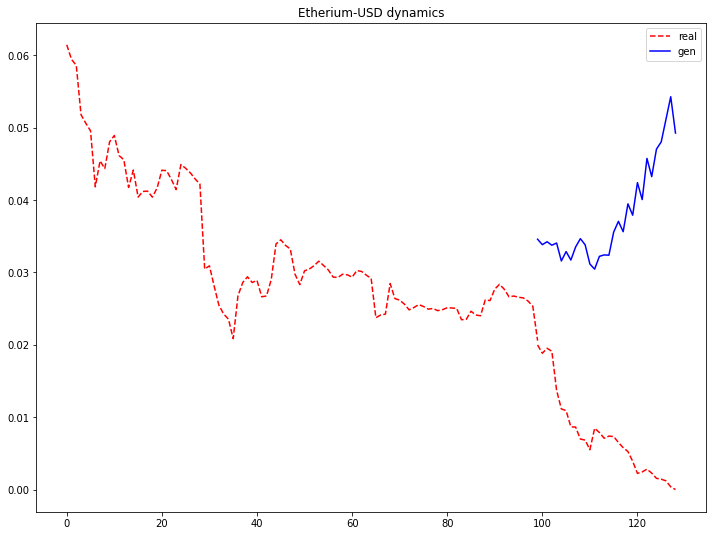

D_loss: 0.6532149910926819, G_loss: 4.422060012817383


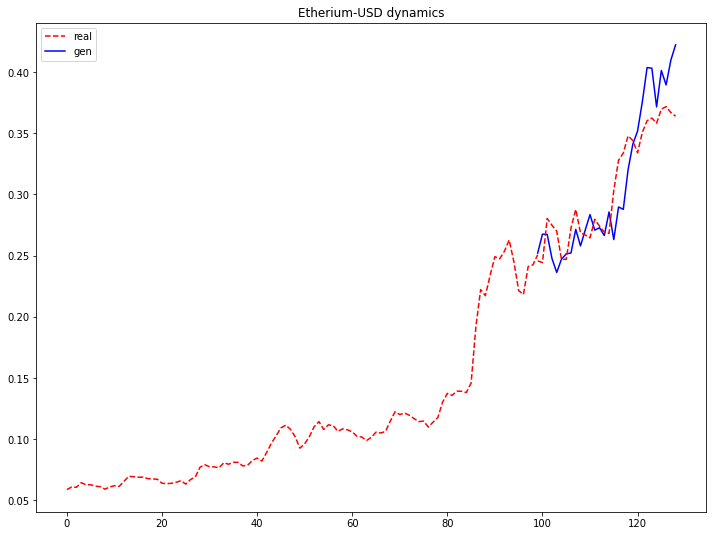

D_loss: 0.6320527195930481, G_loss: 4.534266948699951


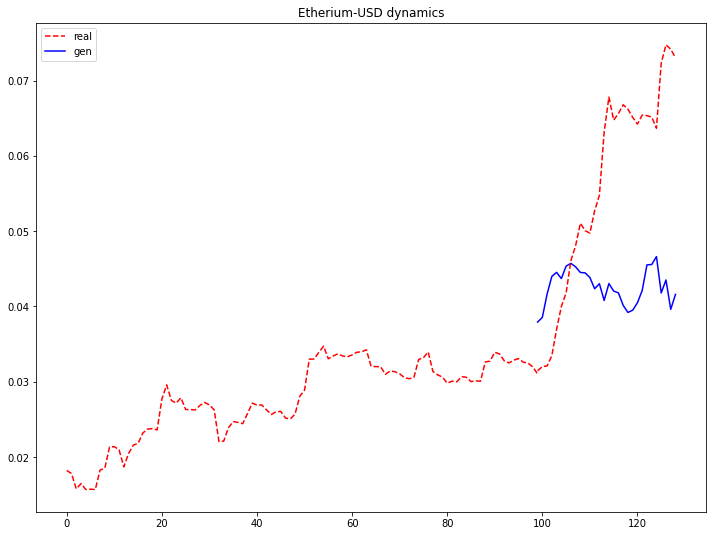

D_loss: 0.6148863434791565, G_loss: 4.639729976654053


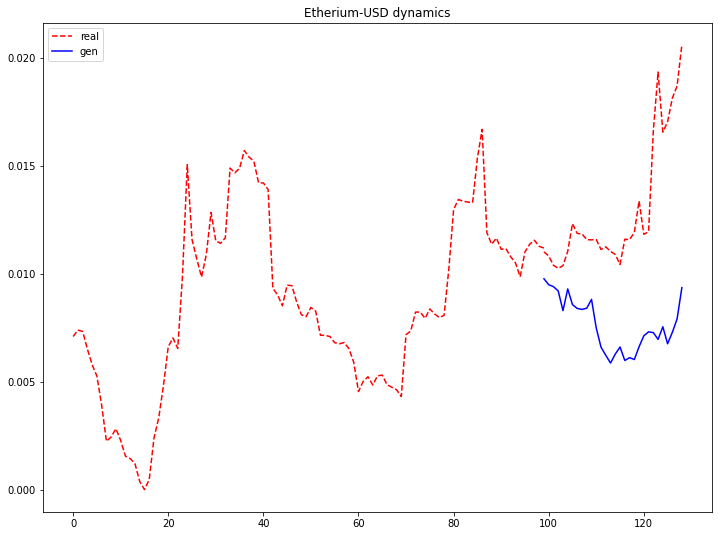

D_loss: 0.6010311245918274, G_loss: 4.736715793609619


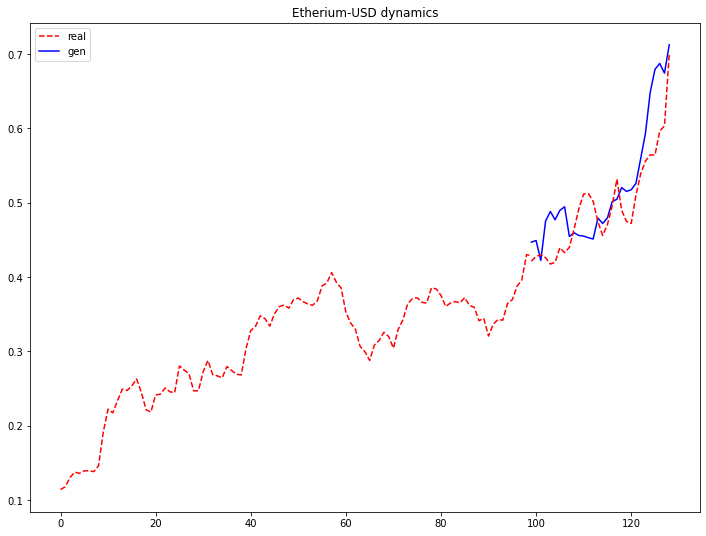

D_loss: 0.5884566903114319, G_loss: 4.823461055755615


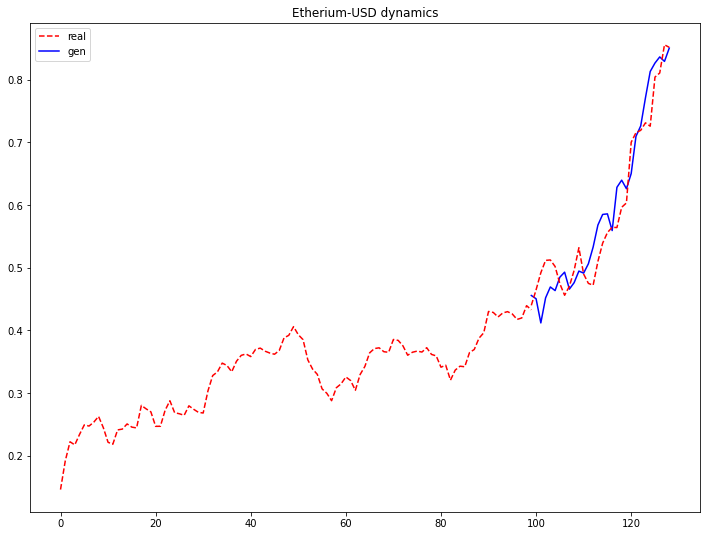

D_loss: 0.5789644122123718, G_loss: 4.906954765319824


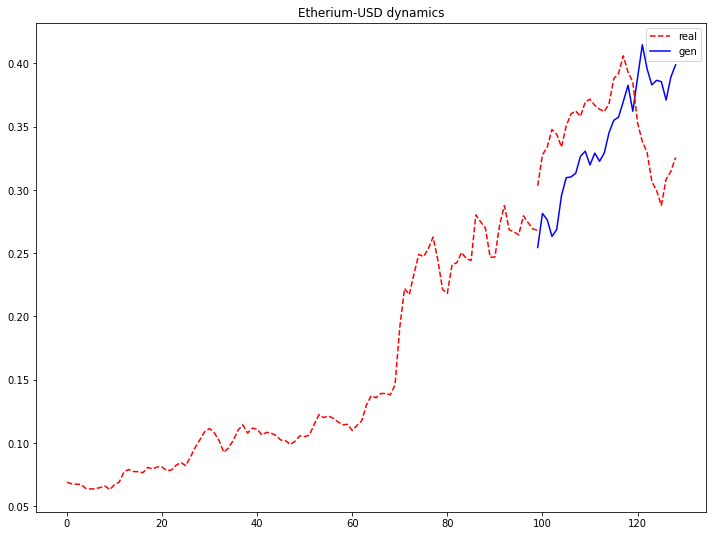

D_loss: 0.5710995197296143, G_loss: 4.977745532989502


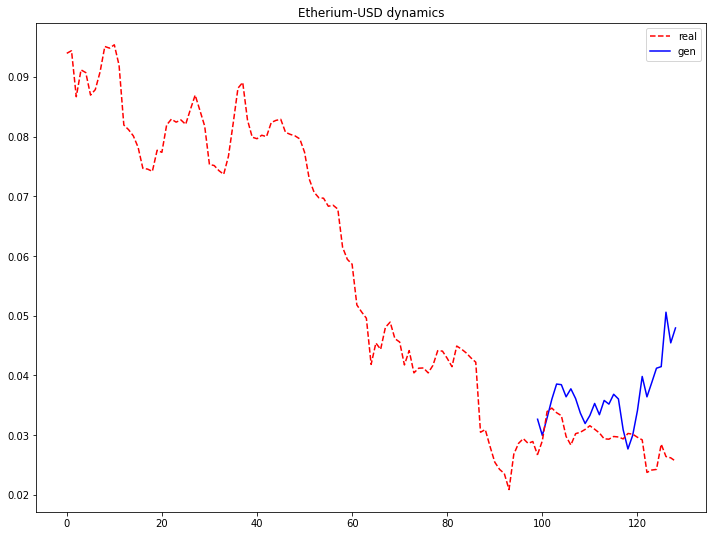

D_loss: 0.563336968421936, G_loss: 5.046795845031738


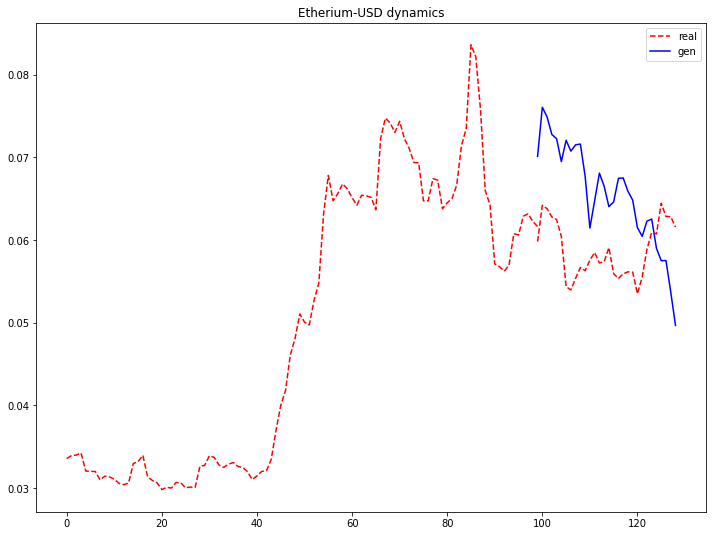

D_loss: 0.5566445589065552, G_loss: 5.106536865234375


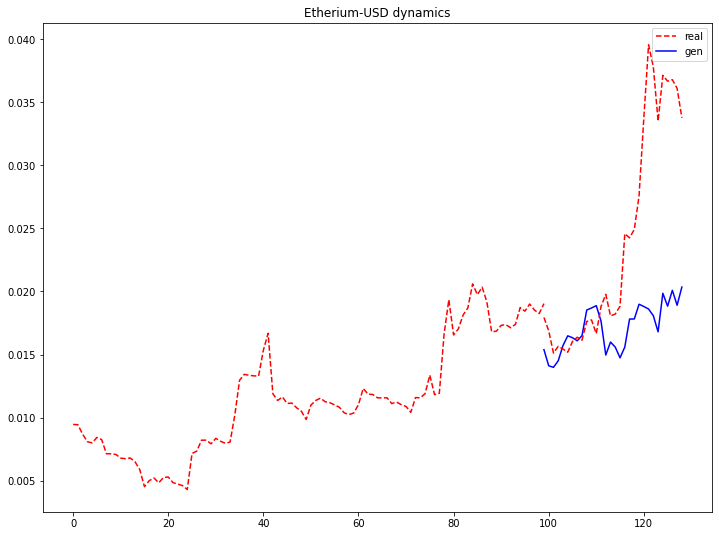

D_loss: 0.5501111149787903, G_loss: 5.168102264404297


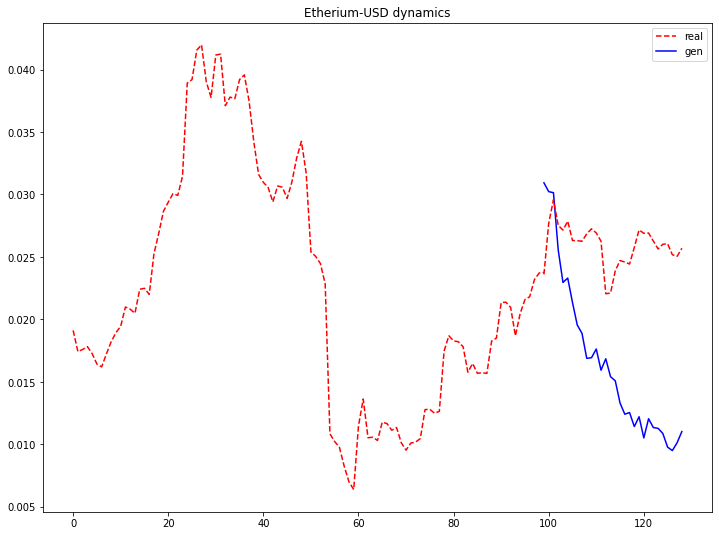

D_loss: 0.5438832640647888, G_loss: 5.2232890129089355


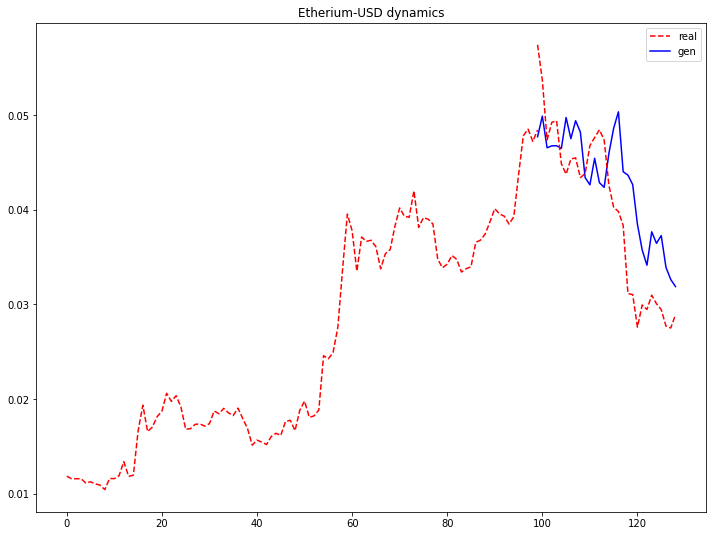

D_loss: 0.5389273762702942, G_loss: 5.275475978851318


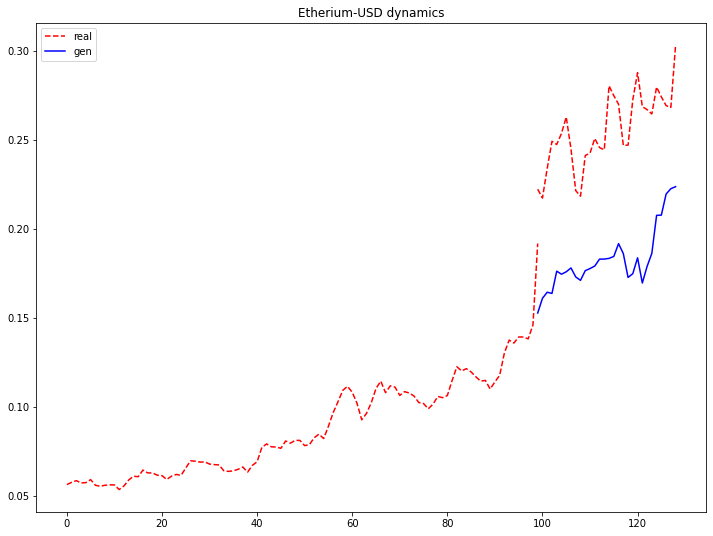

D_loss: 0.5338854193687439, G_loss: 5.328042984008789


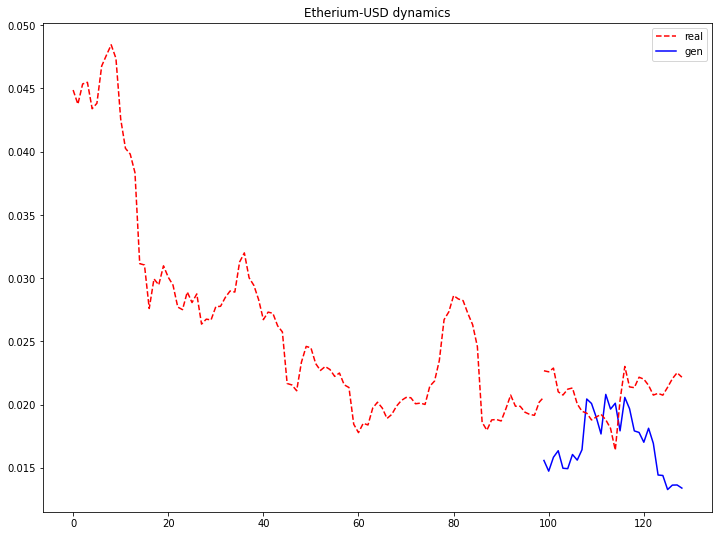

D_loss: 0.5297746658325195, G_loss: 5.370688438415527


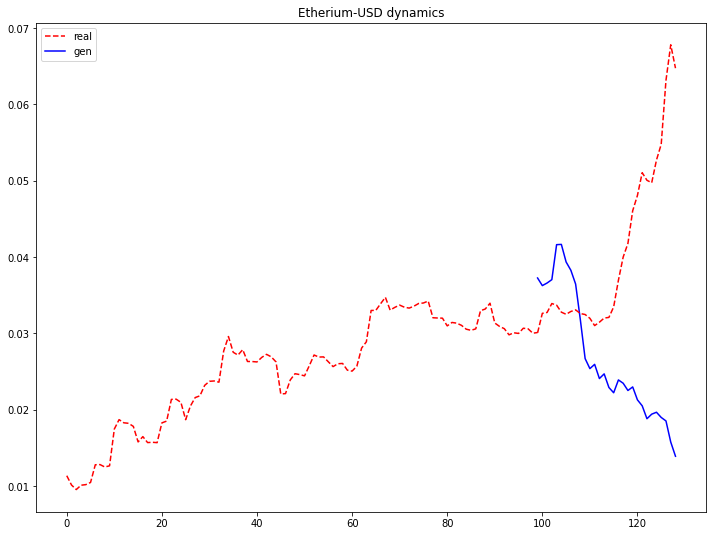

D_loss: 0.5261346101760864, G_loss: 5.409102916717529


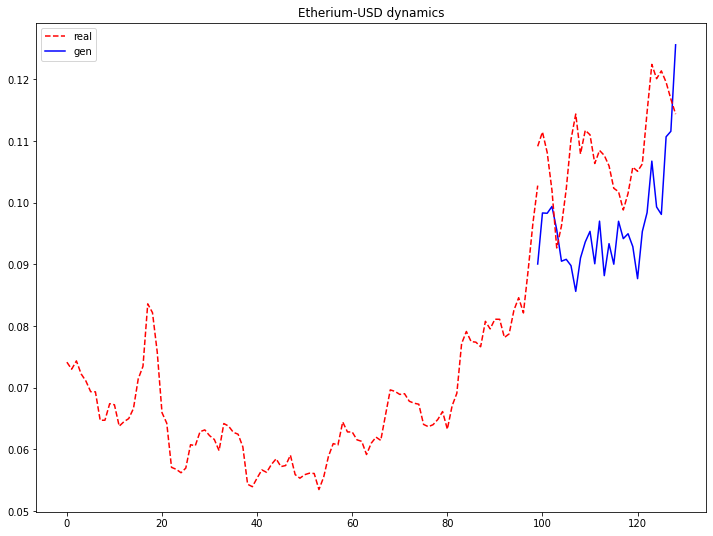

D_loss: 0.5231295824050903, G_loss: 5.440195560455322


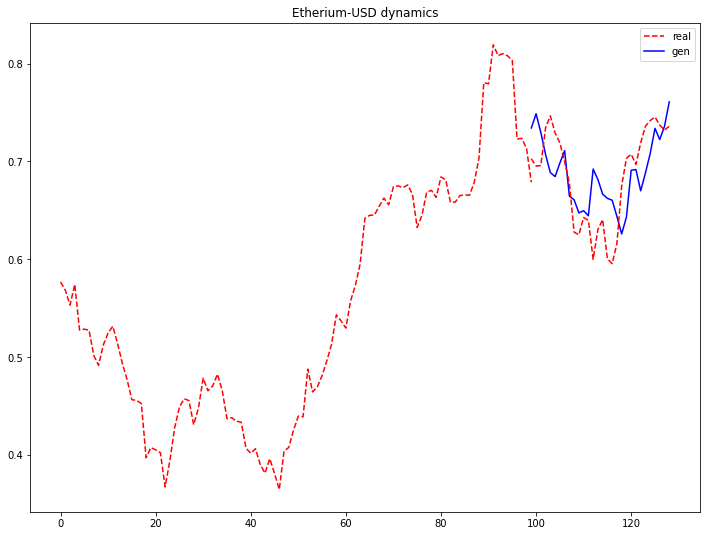

D_loss: 0.5199065208435059, G_loss: 5.474307060241699


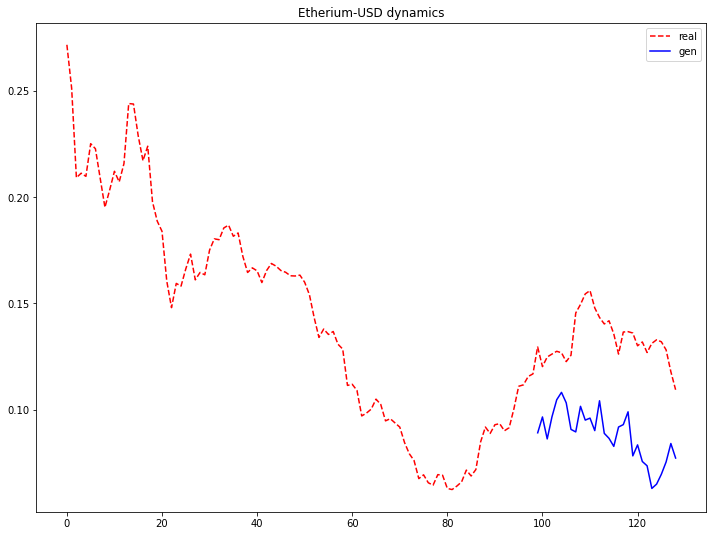

D_loss: 0.5165870785713196, G_loss: 5.510360240936279


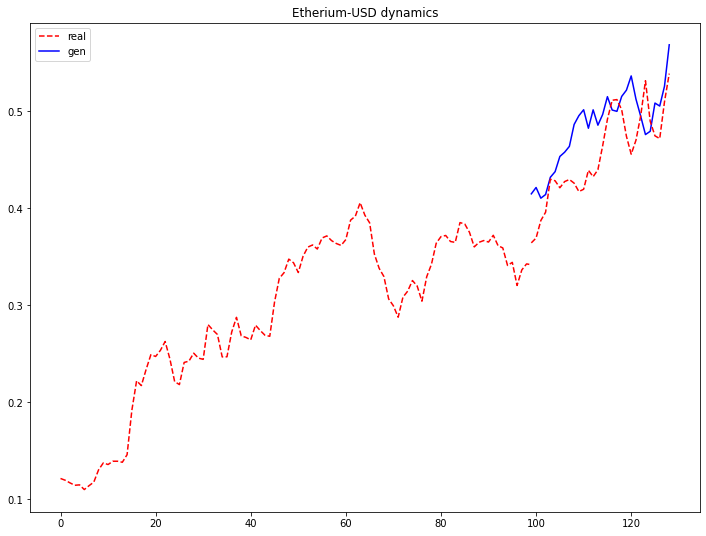

D_loss: 0.5138506889343262, G_loss: 5.542335510253906


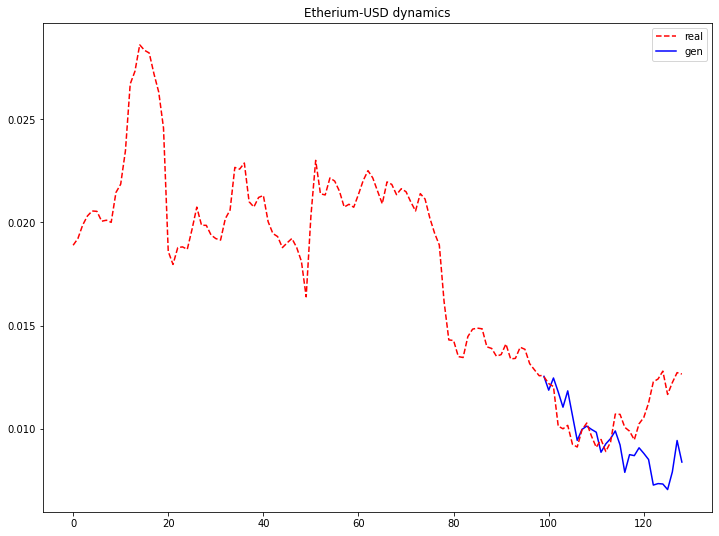

D_loss: 0.5109941363334656, G_loss: 5.5735249519348145


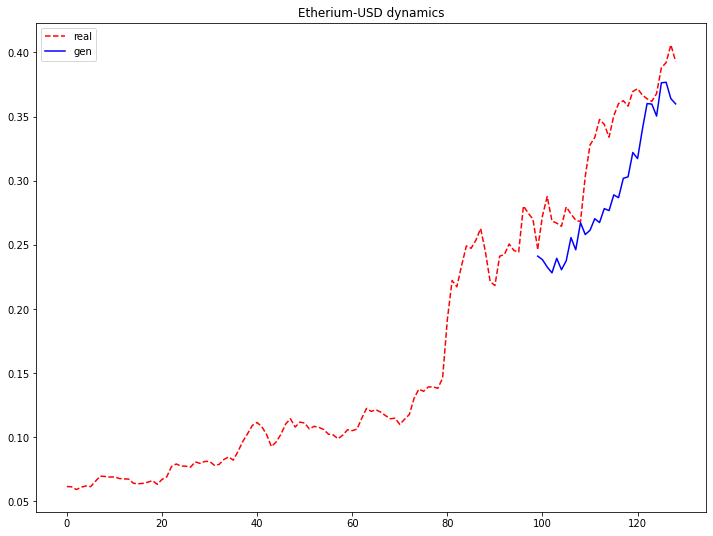

D_loss: 0.5084027051925659, G_loss: 5.606058120727539


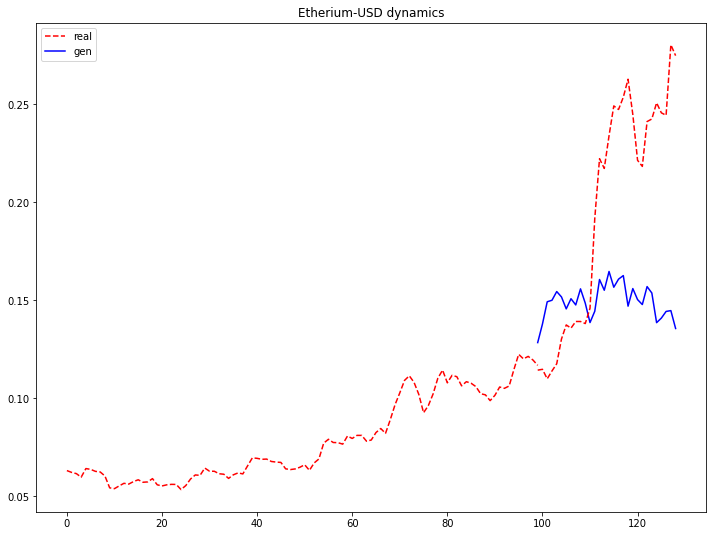

D_loss: 0.5060927271842957, G_loss: 5.6271209716796875


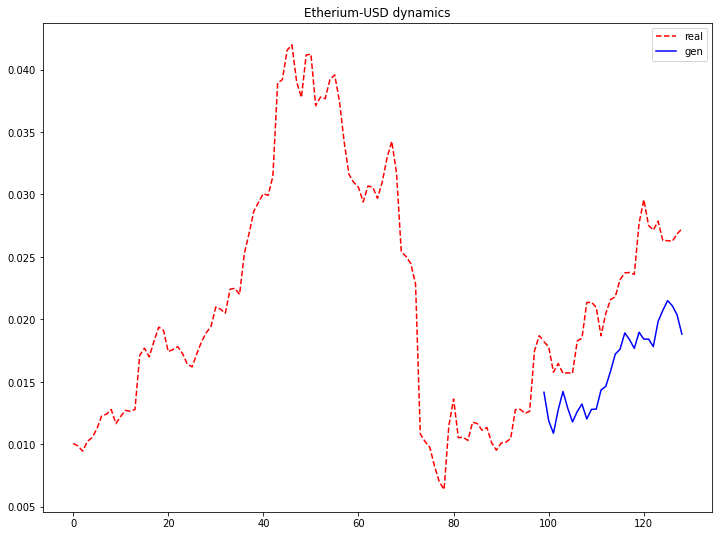

D_loss: 0.5039353370666504, G_loss: 5.651508808135986


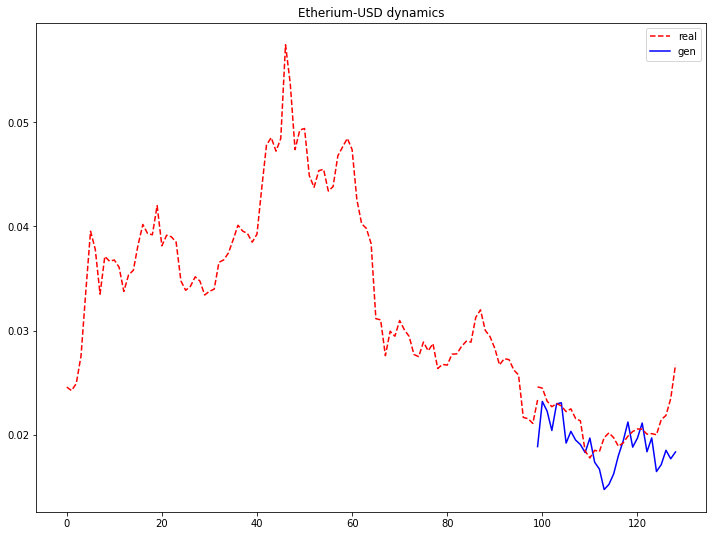

D_loss: 0.5016939640045166, G_loss: 5.675609588623047


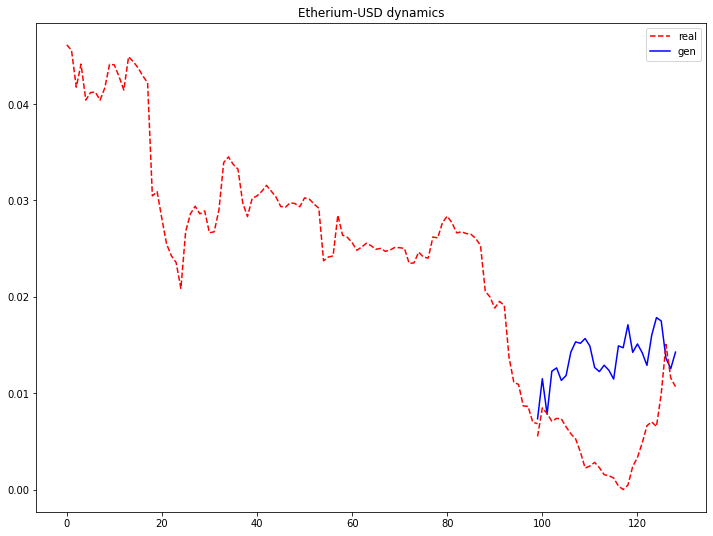

D_loss: 0.4999459981918335, G_loss: 5.696224212646484


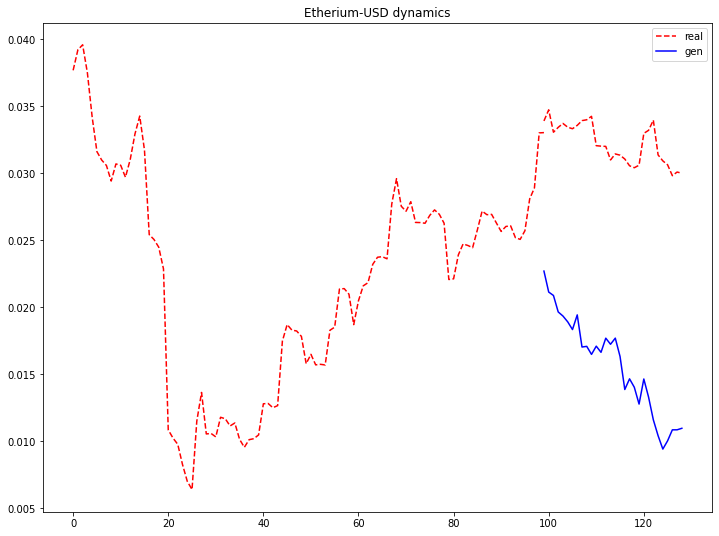

D_loss: 0.4982914626598358, G_loss: 5.713128089904785


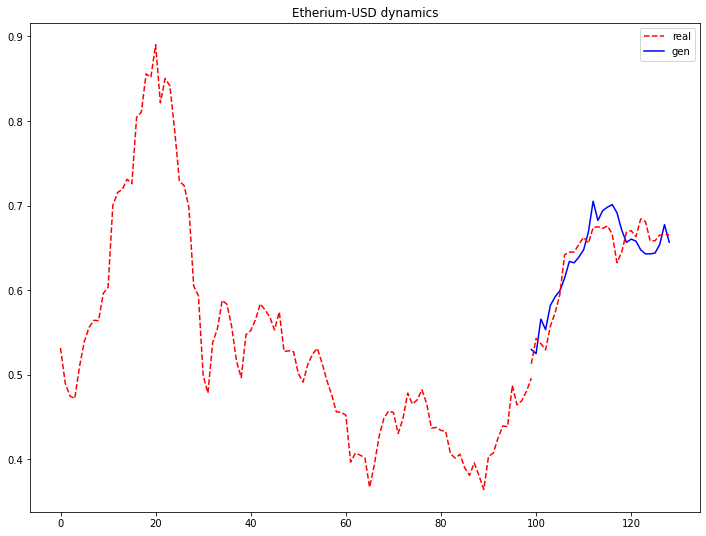

D_loss: 0.49684178829193115, G_loss: 5.726644515991211


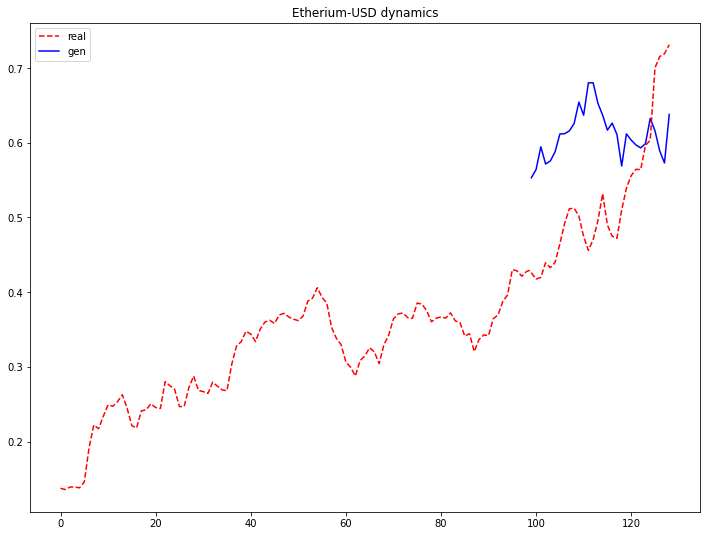

D_loss: 0.49539607763290405, G_loss: 5.738986015319824


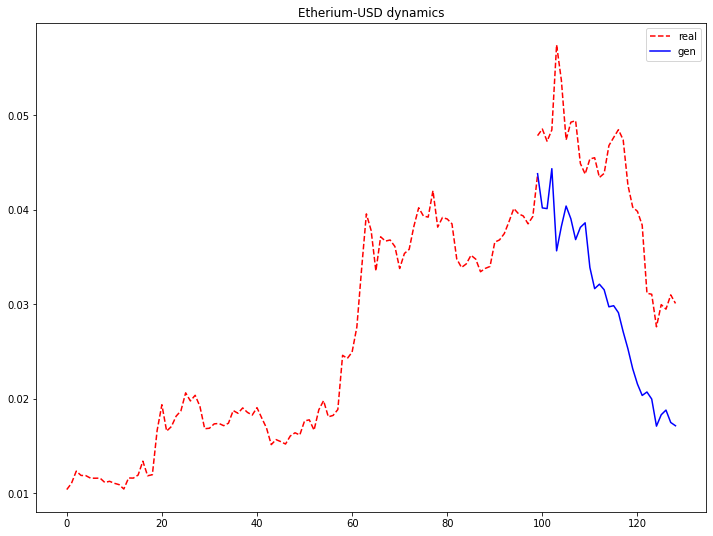

D_loss: 0.4941239058971405, G_loss: 5.756588459014893


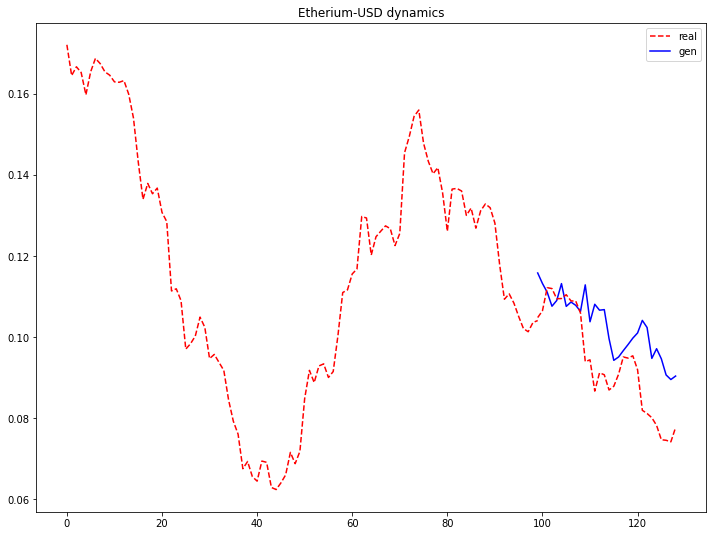

D_loss: 0.4930635094642639, G_loss: 5.7713541984558105


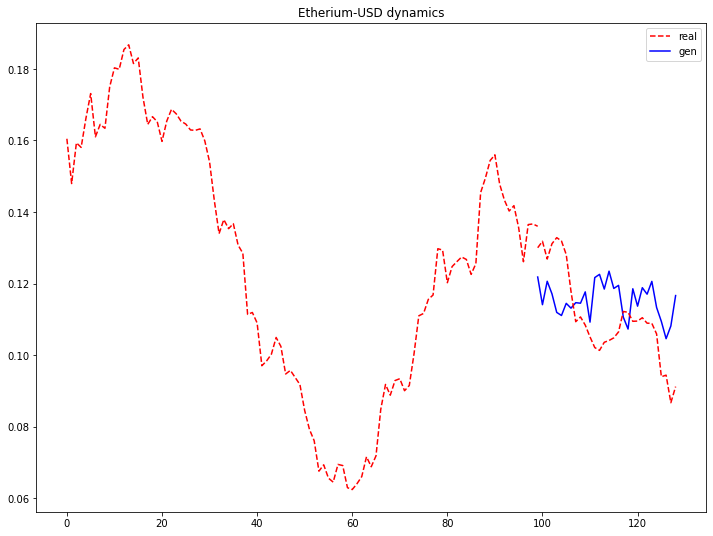

D_loss: 0.49184080958366394, G_loss: 5.7875213623046875


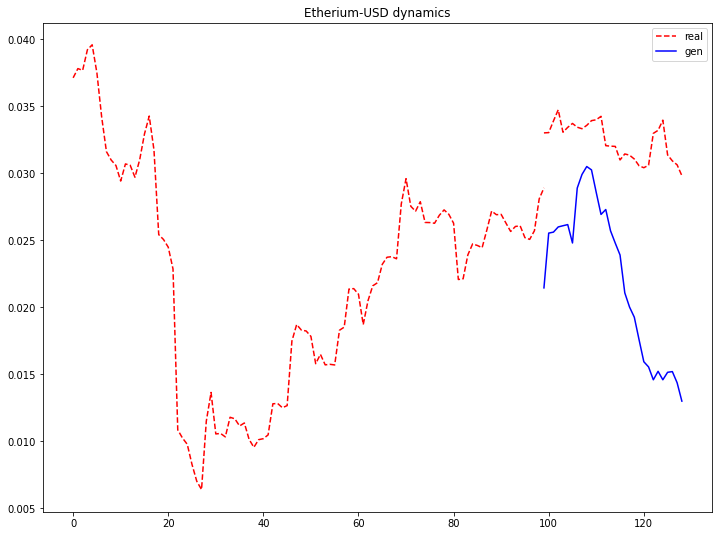

D_loss: 0.4908127188682556, G_loss: 5.8014655113220215


In [ ]:
gen_meta, disc_meta = train_mlp(dataloader, device, draw_graphs=True, meta_flag=True)

In [ ]:
torch.save(gen_clean.state_dict(), PATH + "gen_mlp_1d_clean")
torch.save(disc_clean.state_dict(), PATH + "disc_mlp_1d_clean")
torch.save(gen_meta.state_dict(), PATH  + "gen_mlp_1d_meta")
torch.save(disc_meta.state_dict(), PATH + "disc_mlp_1d_meta")

  0%|          | 0/1000 [00:00<?, ?it/s]

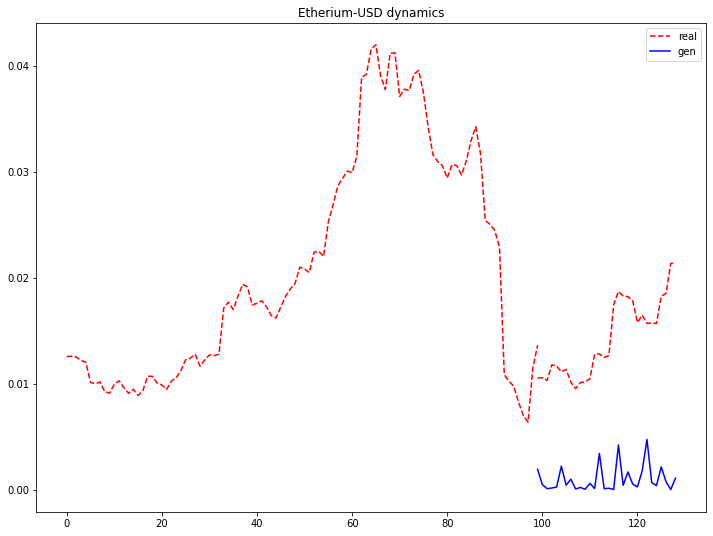

D_loss: 0.09807205945253372, G_loss: 0.16139507293701172


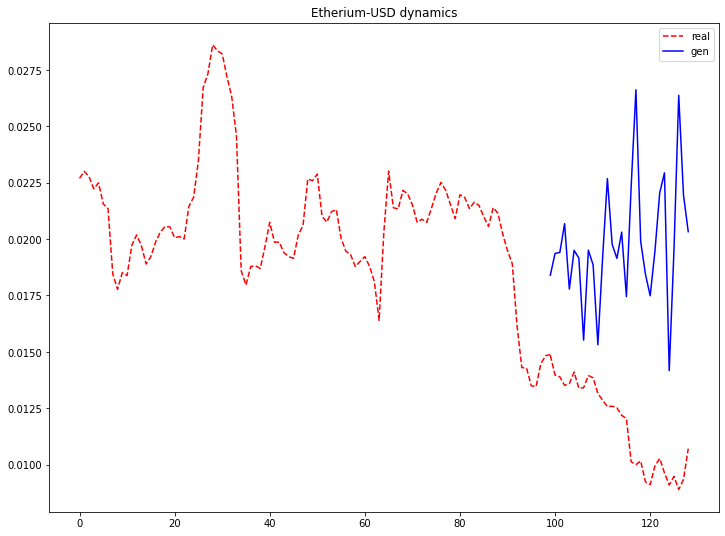

D_loss: -0.0873546376824379, G_loss: 0.09655509144067764


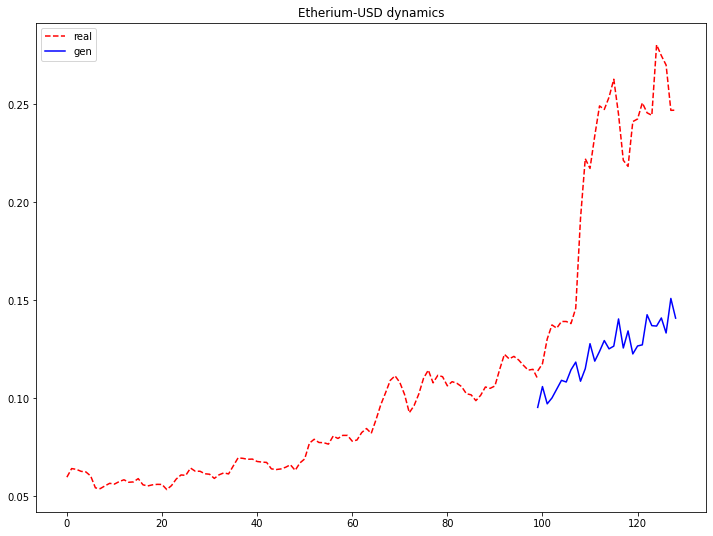

D_loss: -0.10070177912712097, G_loss: 0.09290636330842972


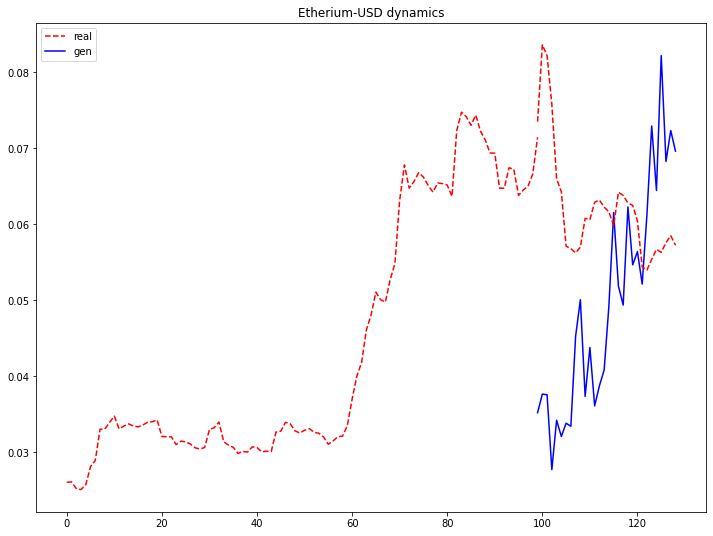

D_loss: -0.10668300837278366, G_loss: 0.09056439995765686


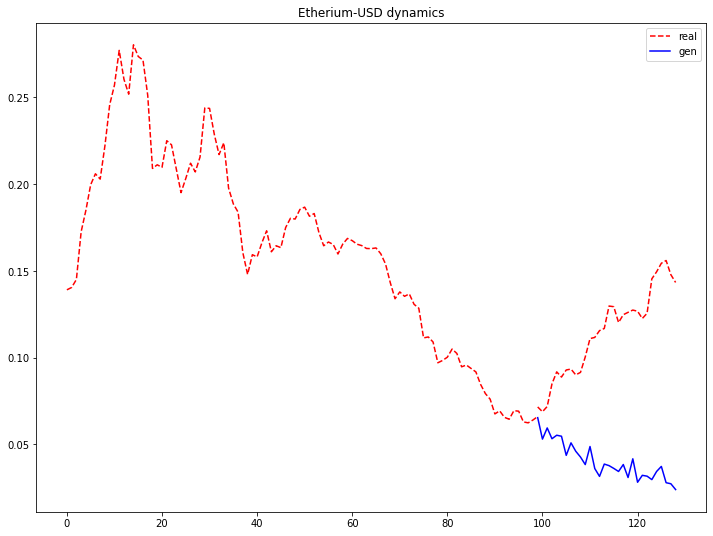

D_loss: -0.10727378726005554, G_loss: 0.08945871144533157


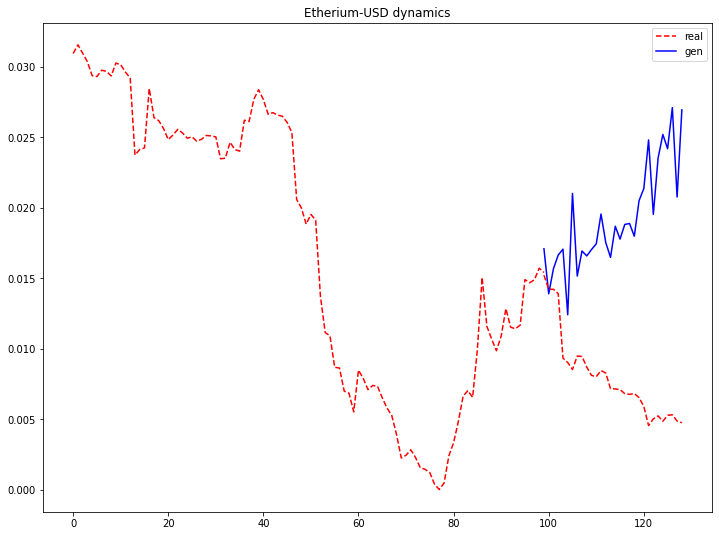

D_loss: -0.10687451809644699, G_loss: 0.09614729136228561


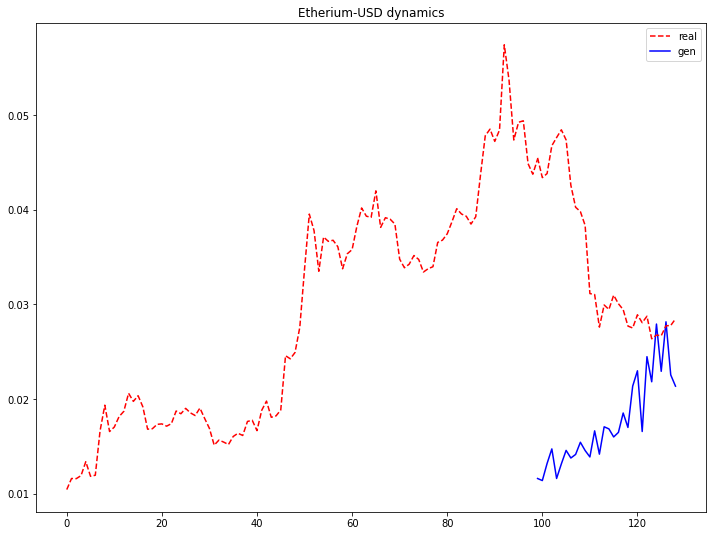

D_loss: -0.10554713010787964, G_loss: 0.0973273366689682


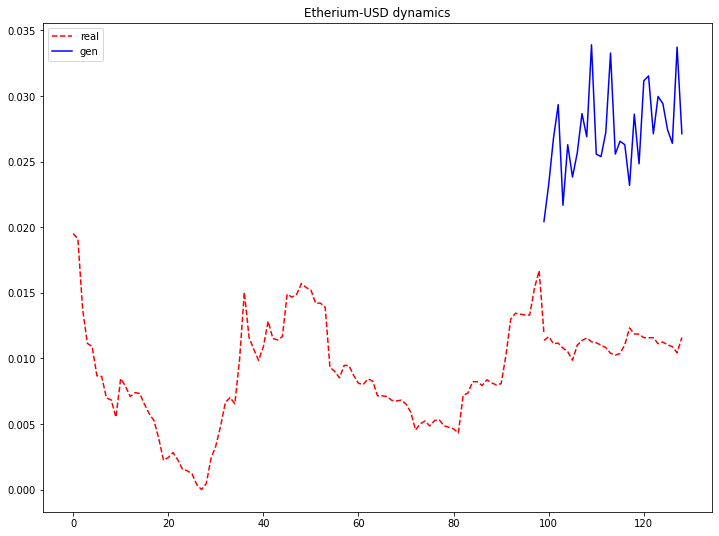

D_loss: -0.10289935022592545, G_loss: 0.10119268298149109


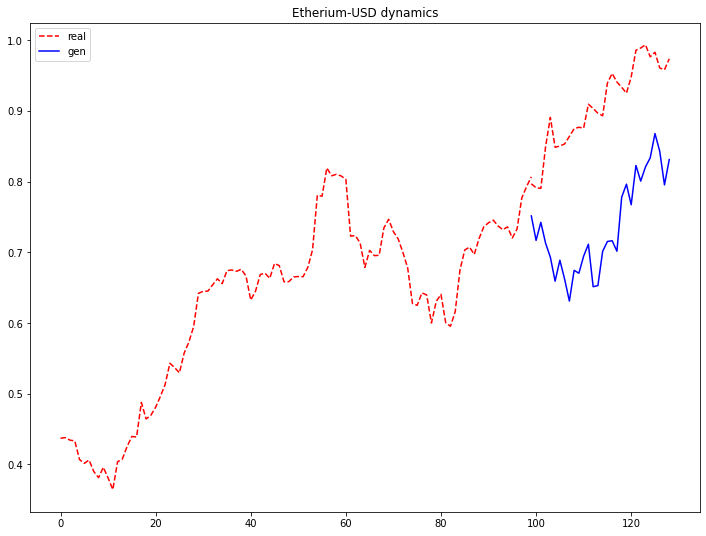

D_loss: -0.10029464215040207, G_loss: 0.10373648256063461


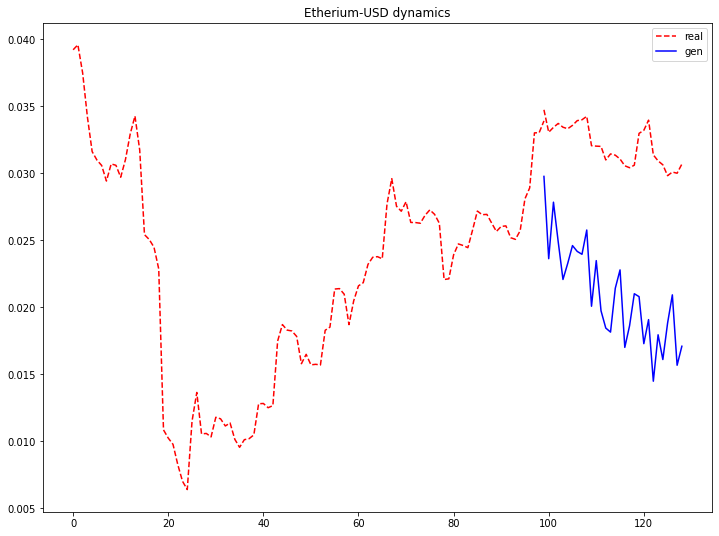

D_loss: -0.09700071811676025, G_loss: 0.10642924159765244


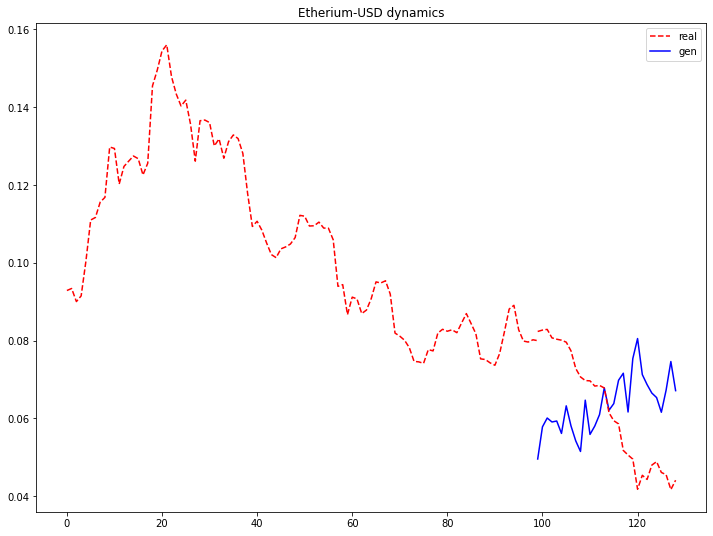

D_loss: -0.09389464557170868, G_loss: 0.10694531351327896


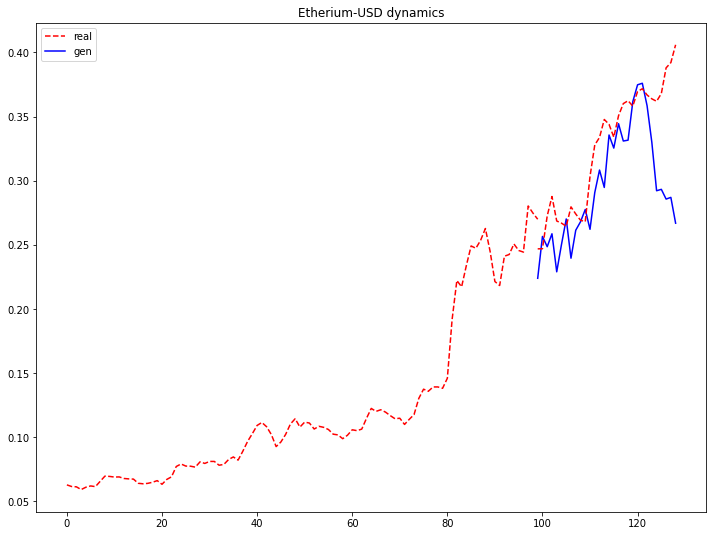

D_loss: -0.09089972078800201, G_loss: 0.10792123526334763


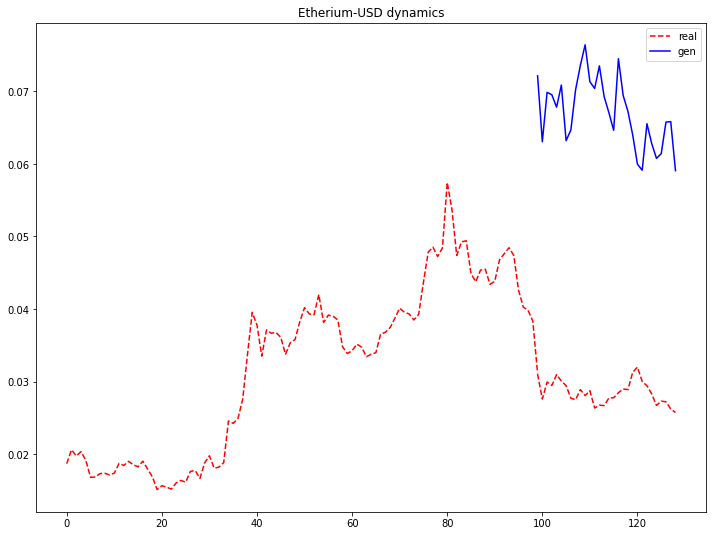

D_loss: -0.08825891464948654, G_loss: 0.1069650948047638


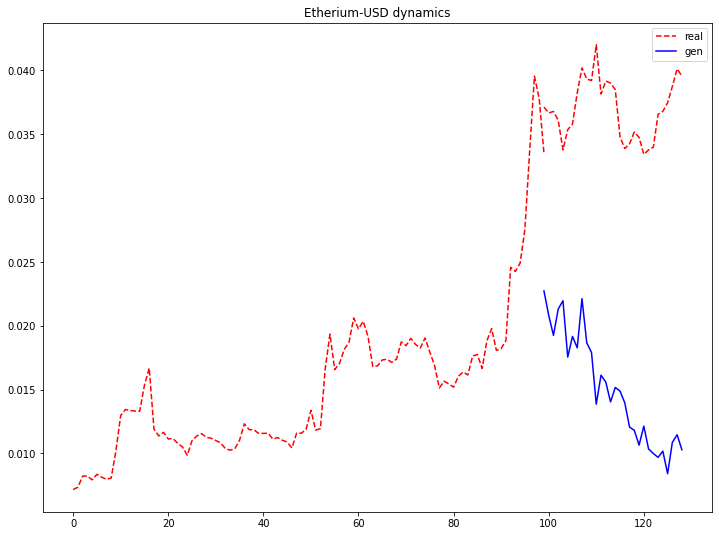

D_loss: -0.08574524521827698, G_loss: 0.10654263943433762


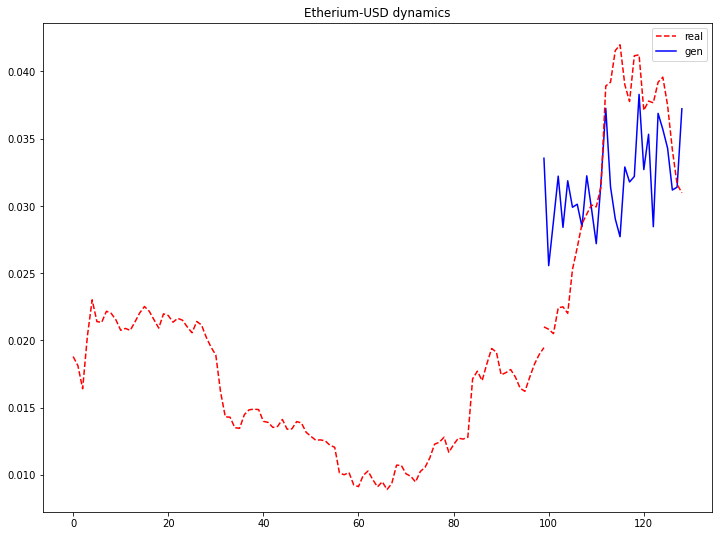

D_loss: -0.0833866074681282, G_loss: 0.10698327422142029


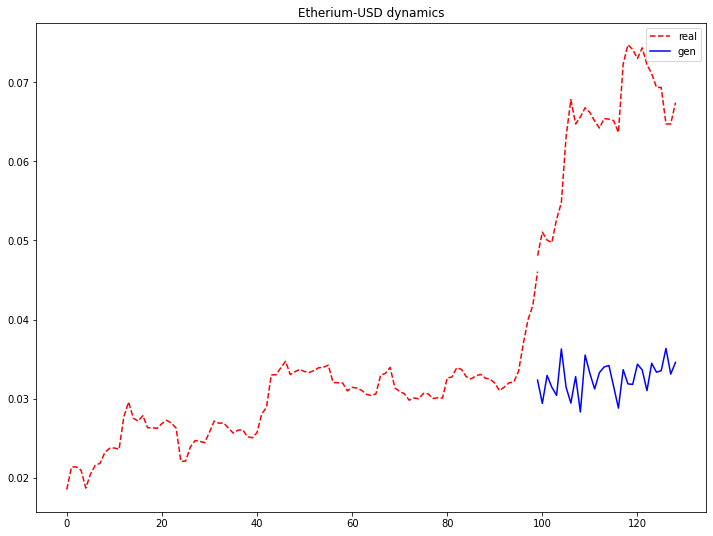

D_loss: -0.08135564625263214, G_loss: 0.10808592289686203


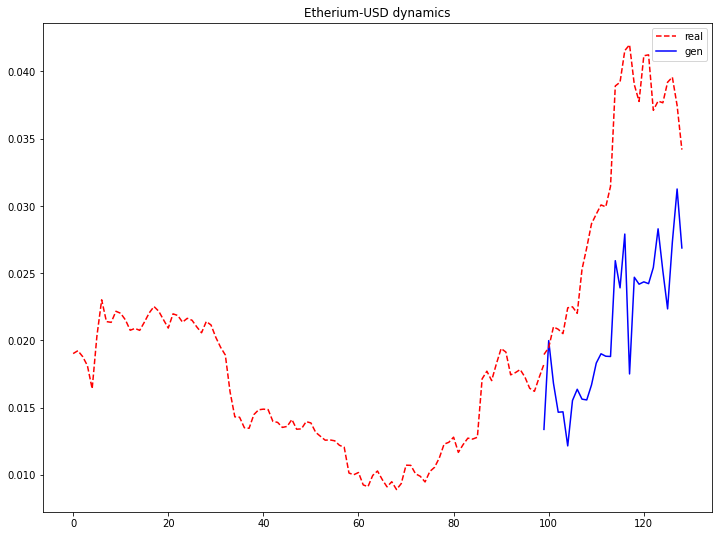

D_loss: -0.07937182486057281, G_loss: 0.10973695665597916


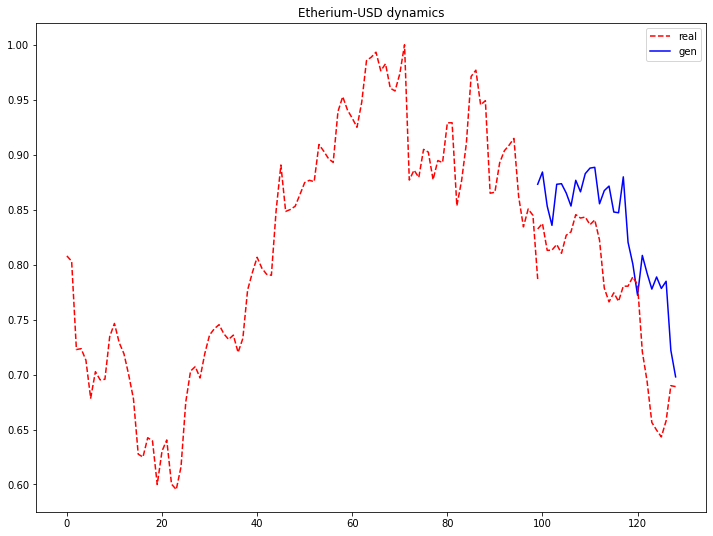

D_loss: -0.07752185314893723, G_loss: 0.11169487982988358


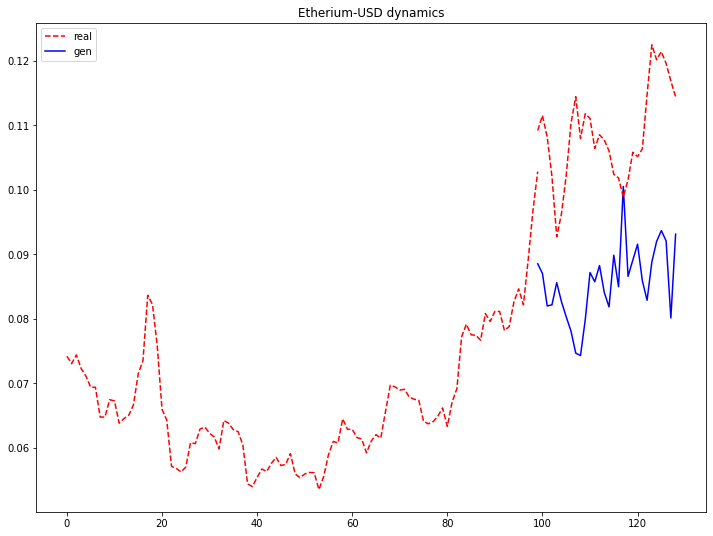

D_loss: -0.07571915537118912, G_loss: 0.11297319829463959


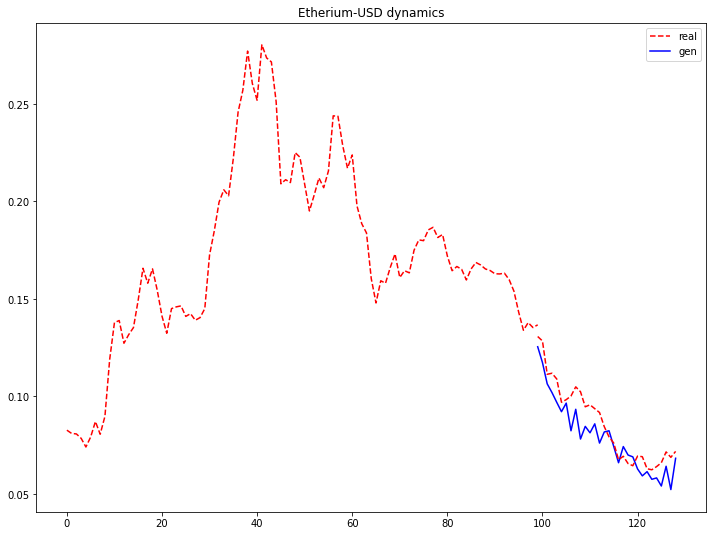

D_loss: -0.07408656179904938, G_loss: 0.11439185589551926


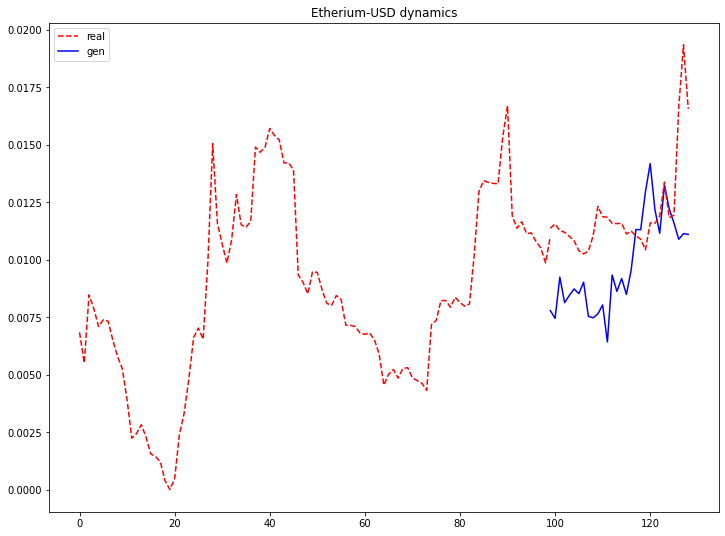

D_loss: -0.07245281338691711, G_loss: 0.11617372184991837


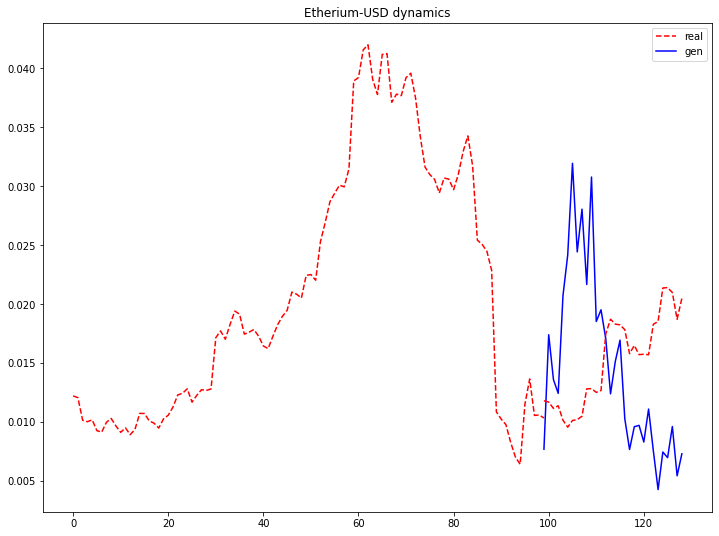

D_loss: -0.07100658863782883, G_loss: 0.11795477569103241


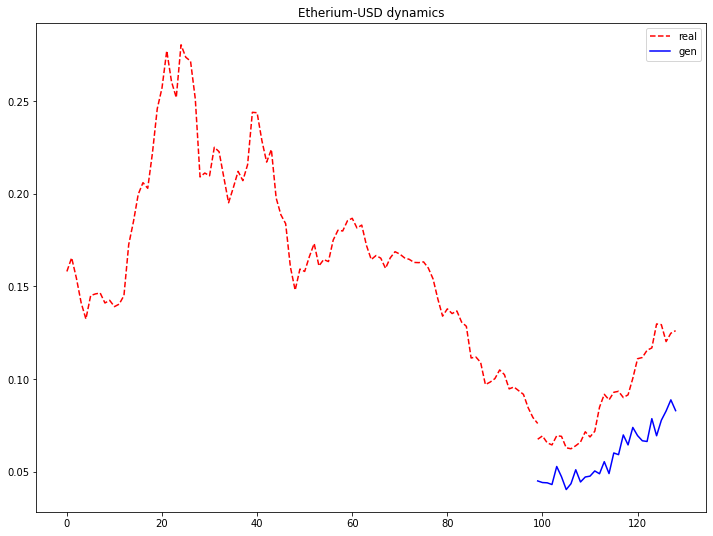

D_loss: -0.06969306617975235, G_loss: 0.11930472403764725


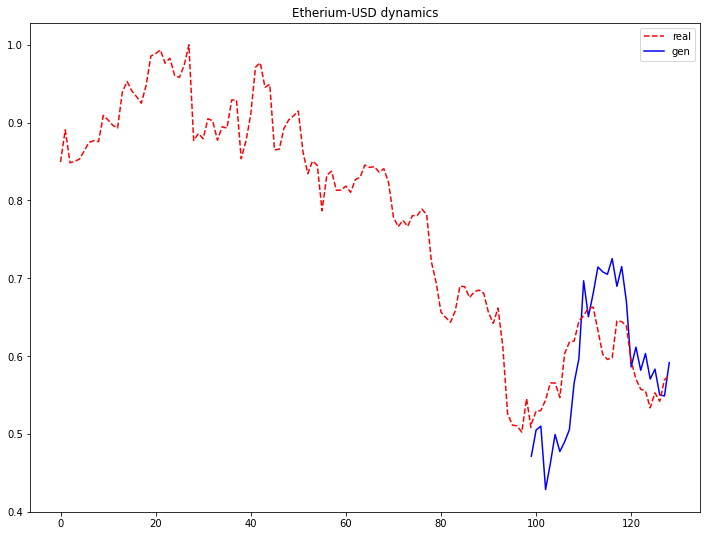

D_loss: -0.06842415779829025, G_loss: 0.12035676836967468


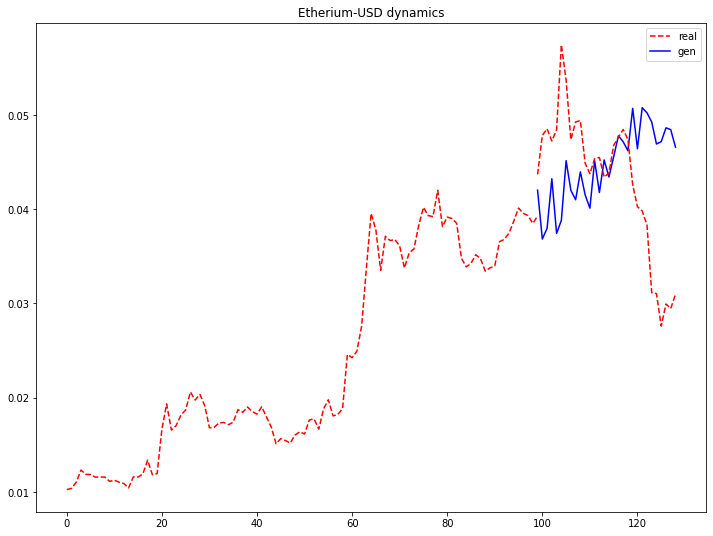

D_loss: -0.06722909212112427, G_loss: 0.12130547314882278


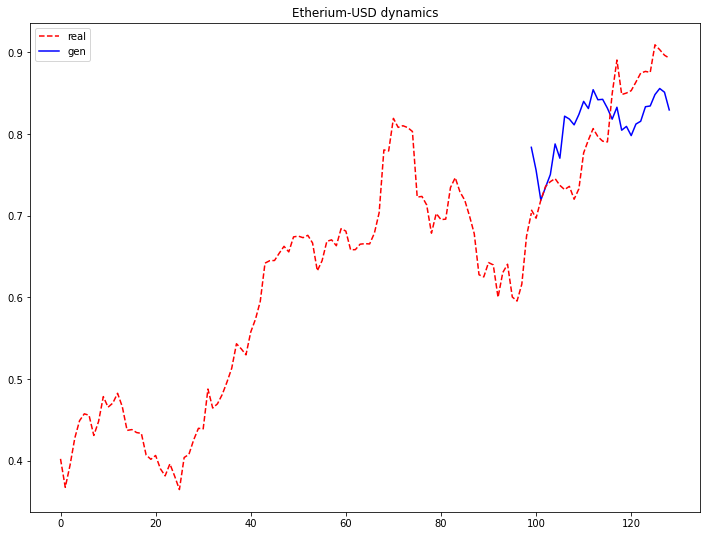

D_loss: -0.06603041291236877, G_loss: 0.12257913500070572


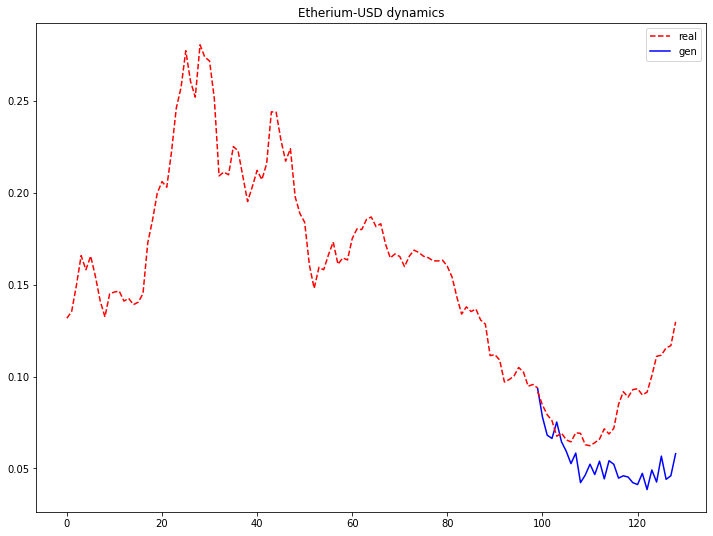

D_loss: -0.06497275084257126, G_loss: 0.12368197739124298


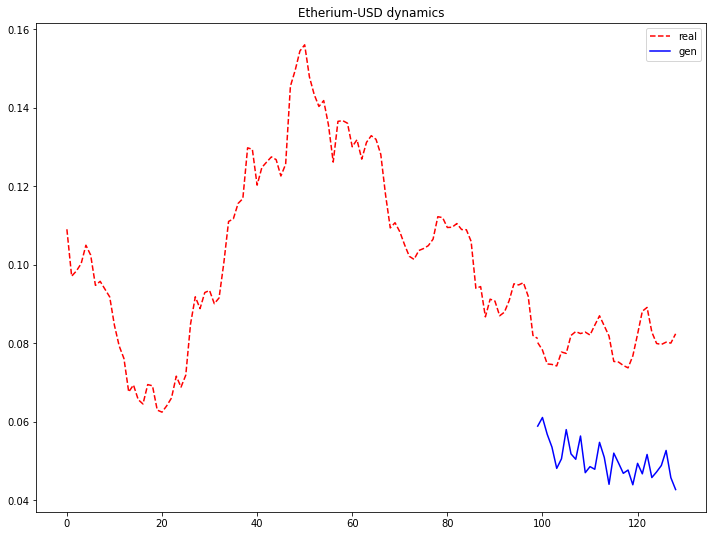

D_loss: -0.06398441642522812, G_loss: 0.12506556510925293


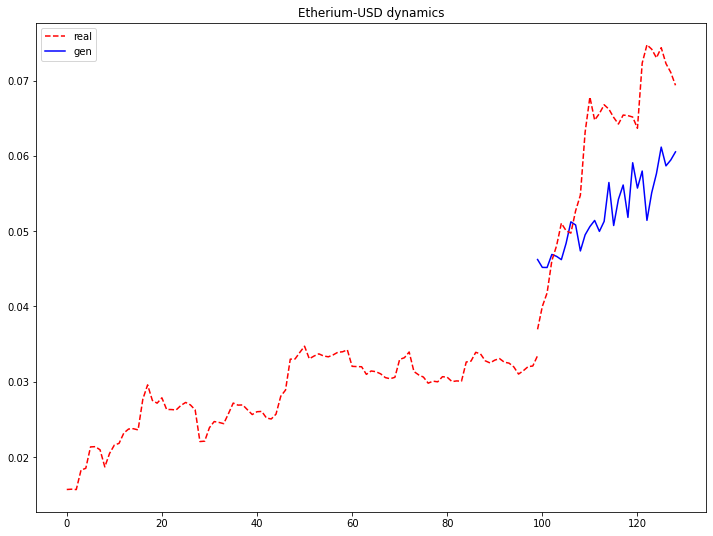

D_loss: -0.06300356984138489, G_loss: 0.1261930614709854


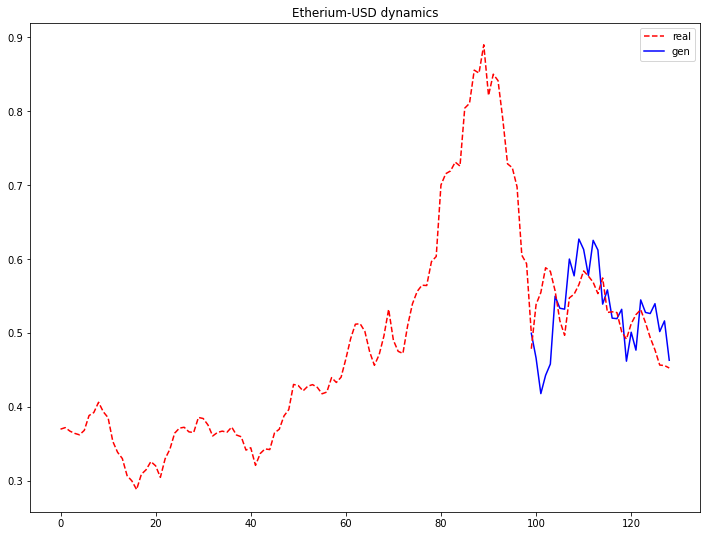

D_loss: -0.062107667326927185, G_loss: 0.12707385420799255


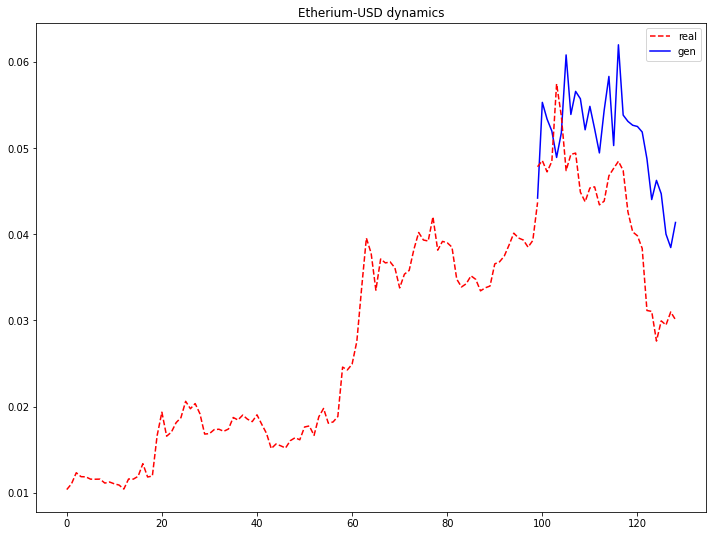

D_loss: -0.06122834235429764, G_loss: 0.128179669380188


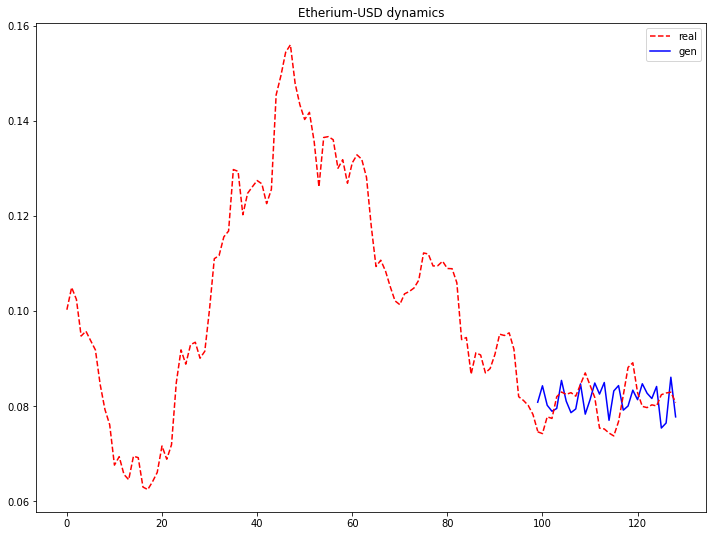

D_loss: -0.060355767607688904, G_loss: 0.12910404801368713


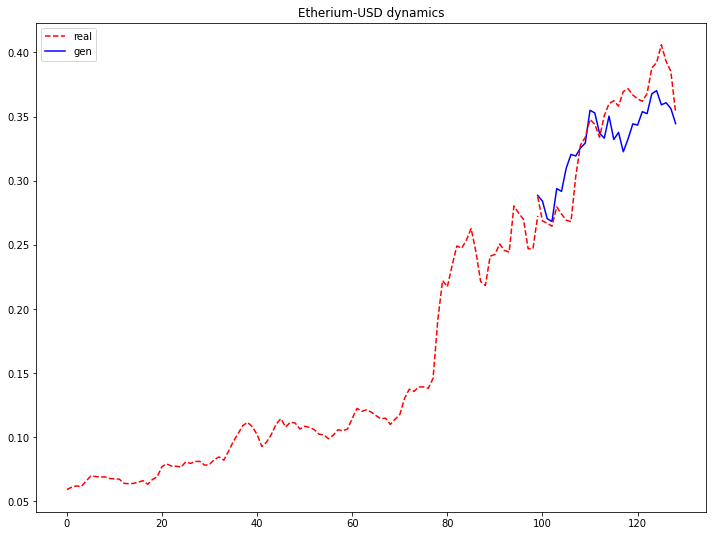

D_loss: -0.05956742912530899, G_loss: 0.1300206333398819


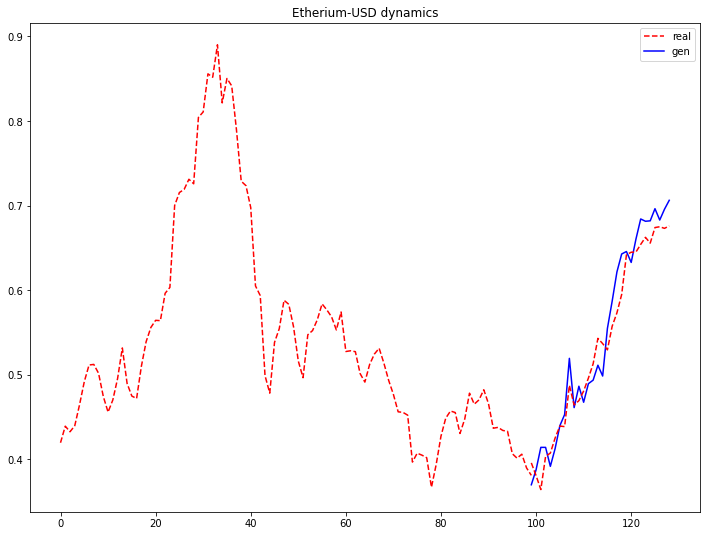

D_loss: -0.05874791368842125, G_loss: 0.13088811933994293


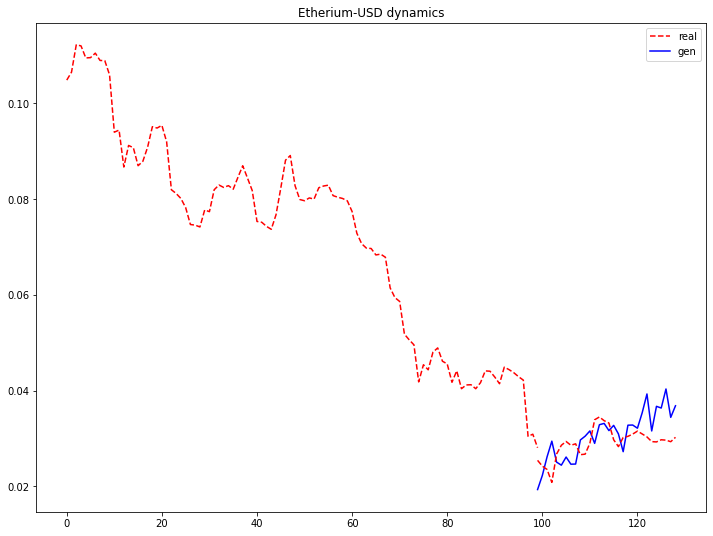

D_loss: -0.05801044777035713, G_loss: 0.13170552253723145


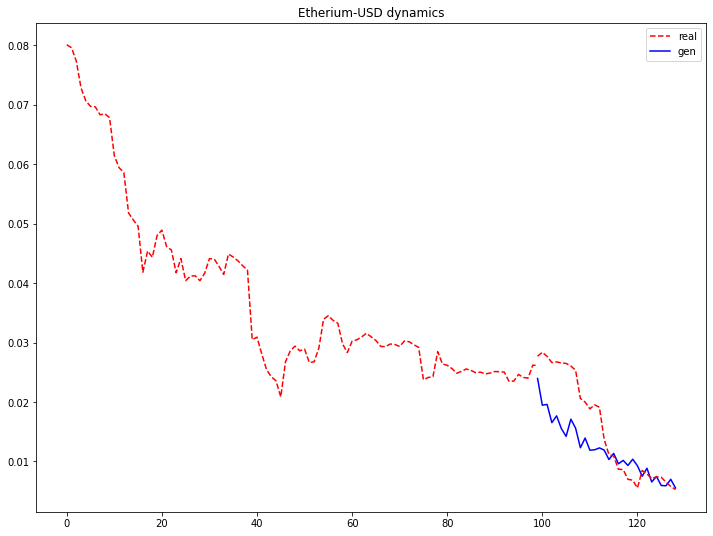

D_loss: -0.05726001784205437, G_loss: 0.13231602311134338


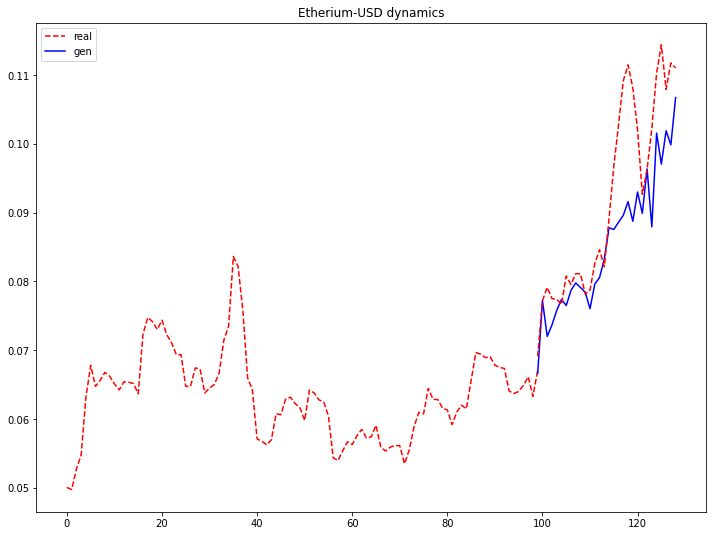

D_loss: -0.056536056101322174, G_loss: 0.13298211991786957


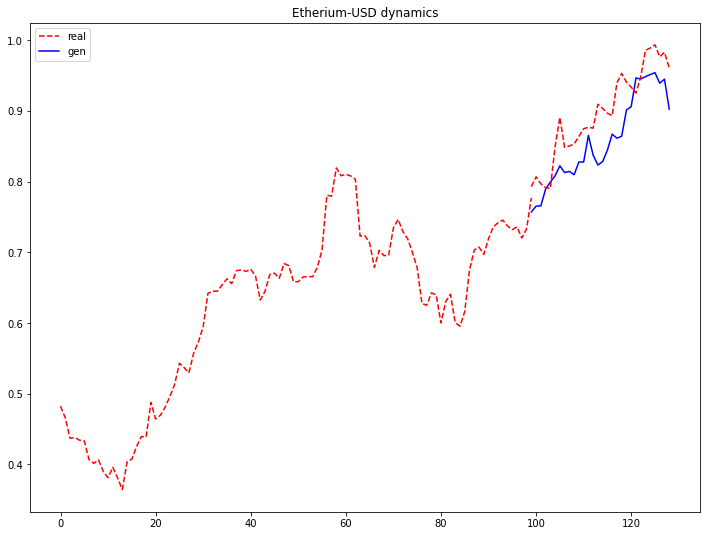

D_loss: -0.05587163195014, G_loss: 0.13385853171348572


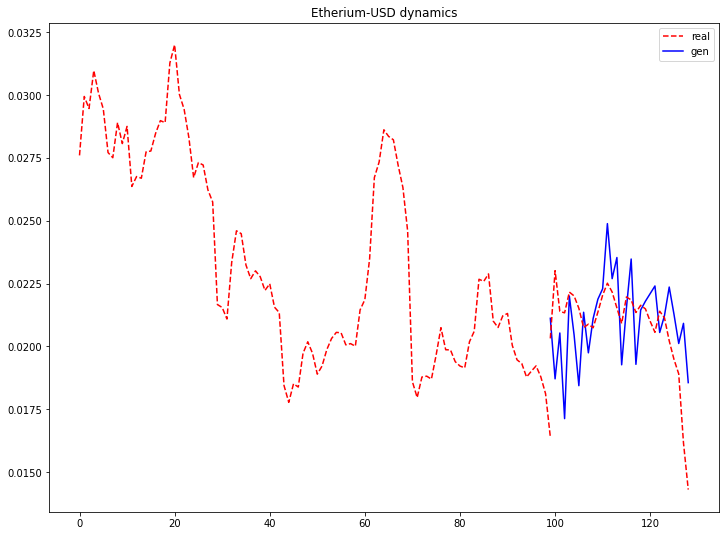

D_loss: -0.0551927350461483, G_loss: 0.1342349648475647


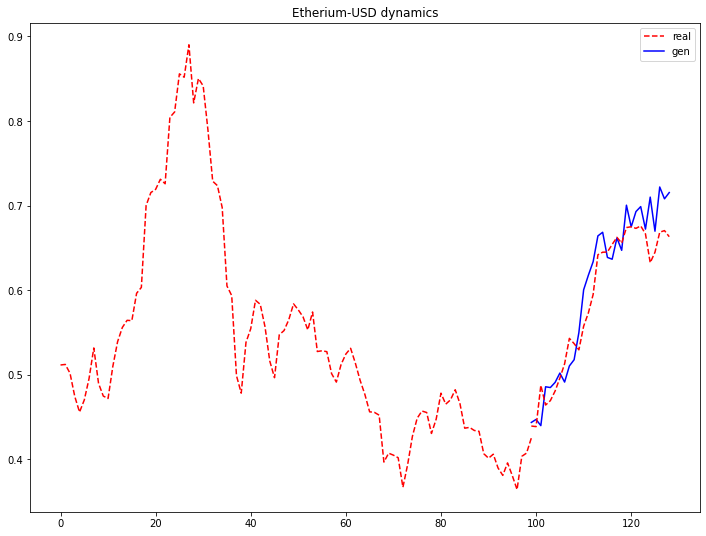

D_loss: -0.05447769537568092, G_loss: 0.13462592661380768


In [ ]:
wgen_clean, wdisc_clean = train_mlp(dataloader, device, wgan=True, draw_graphs=True, meta_flag=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

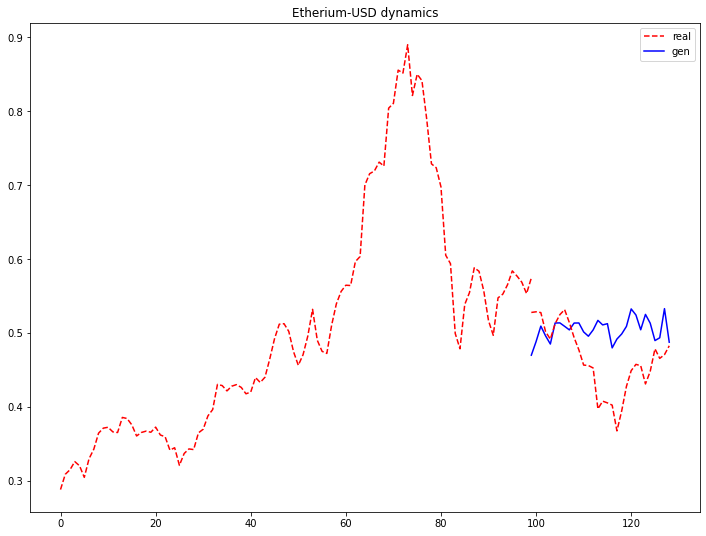

D_loss: 0.44884154200553894, G_loss: 70.02803039550781


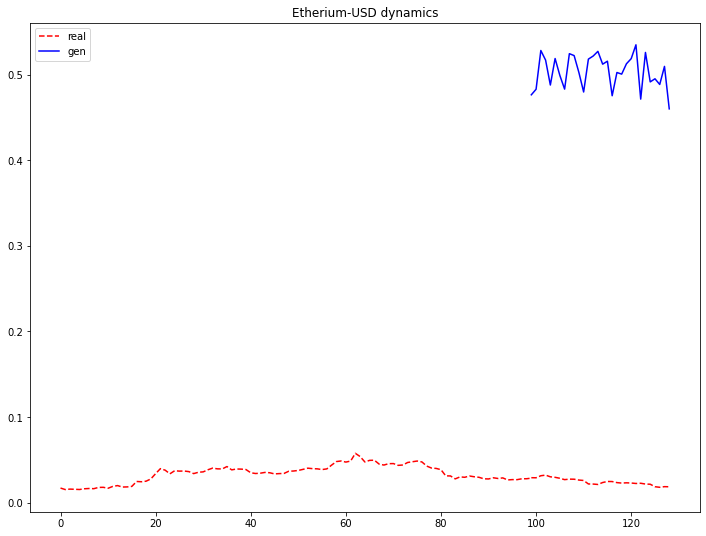

D_loss: -1.2060141563415527, G_loss: 6.897583484649658


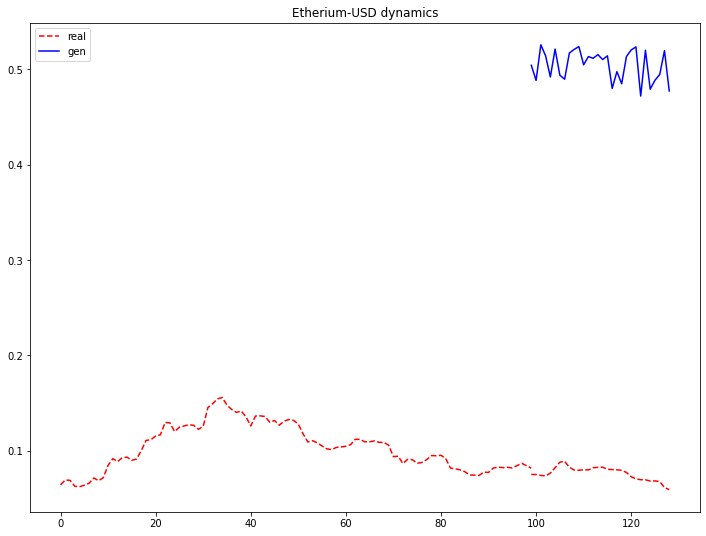

D_loss: -1.3208523988723755, G_loss: 5.6761298179626465


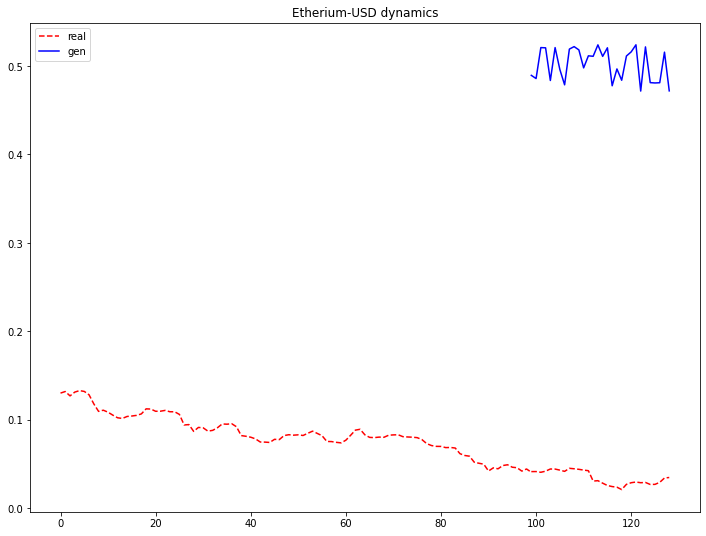

D_loss: -1.3666123151779175, G_loss: 5.229397773742676


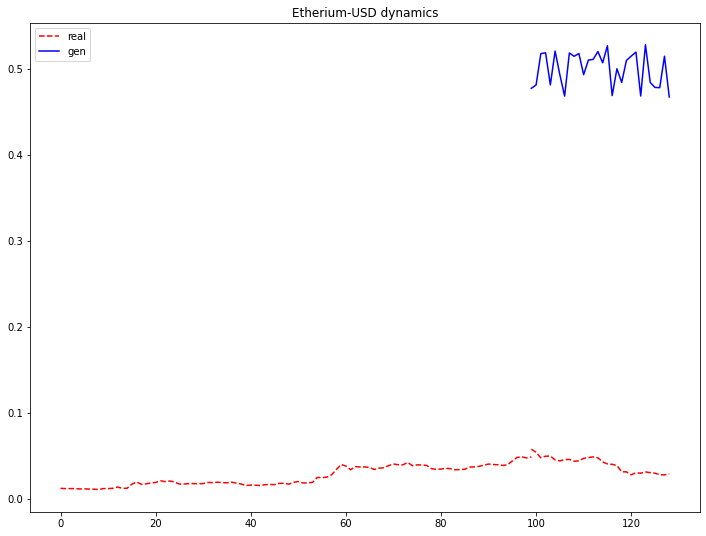

D_loss: -1.3910149335861206, G_loss: 5.048155784606934


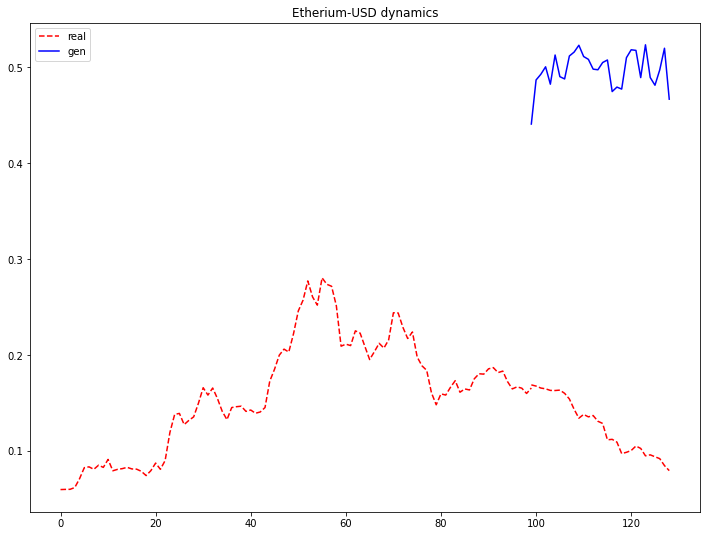

D_loss: -1.403449535369873, G_loss: 4.997594833374023


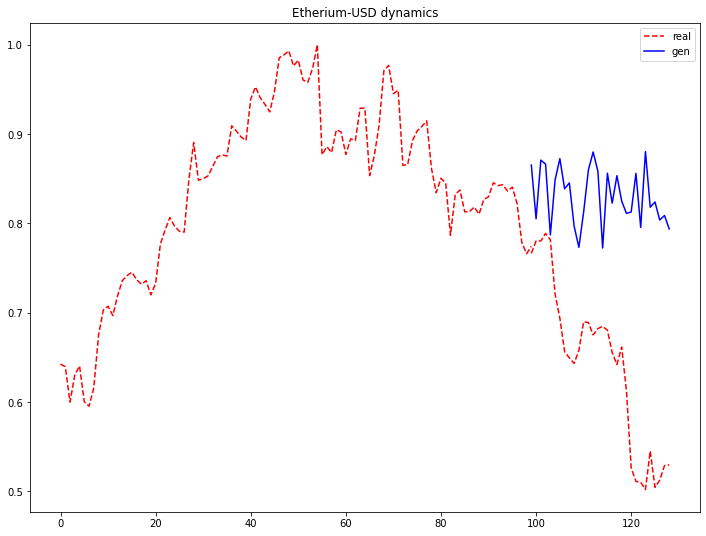

D_loss: -1.4042608737945557, G_loss: 4.890064716339111


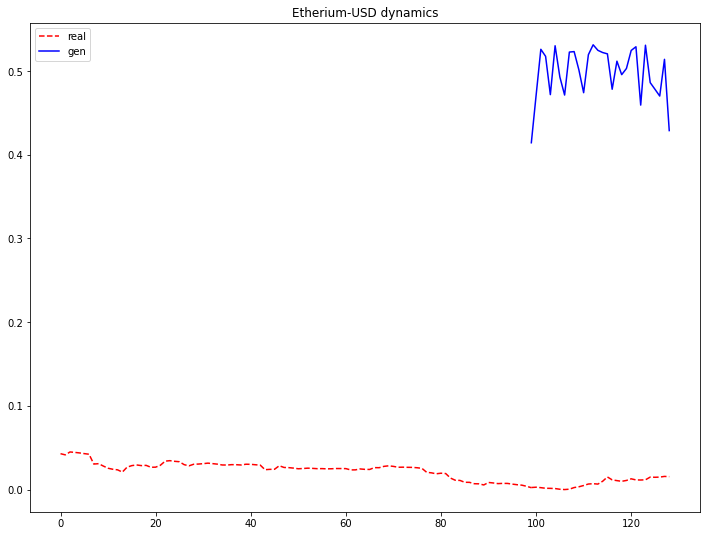

D_loss: -1.400550365447998, G_loss: 4.8040452003479


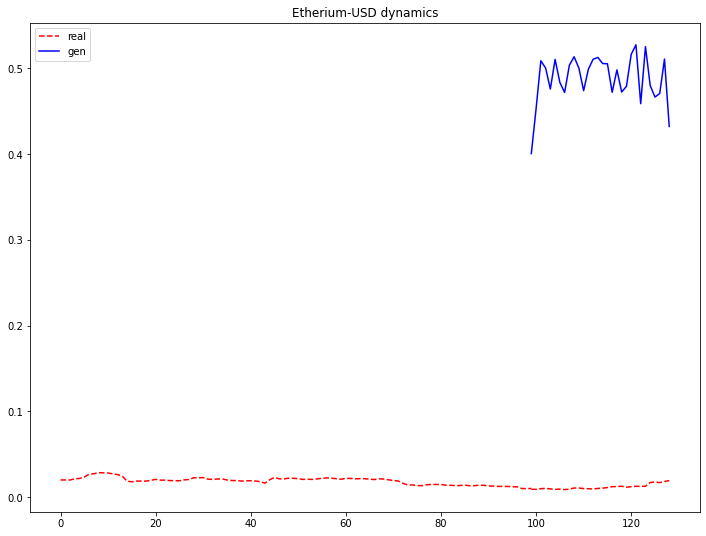

D_loss: -1.3902252912521362, G_loss: 4.726655006408691


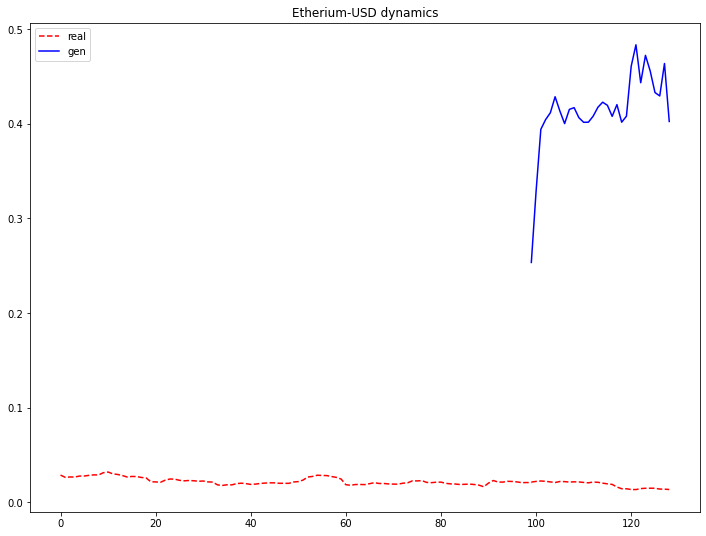

D_loss: -1.378363847732544, G_loss: 4.658031940460205


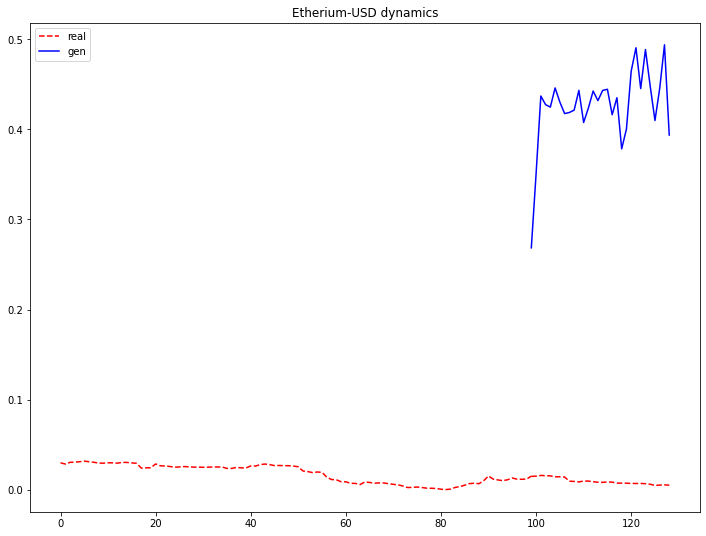

D_loss: -1.365378975868225, G_loss: 4.612618923187256


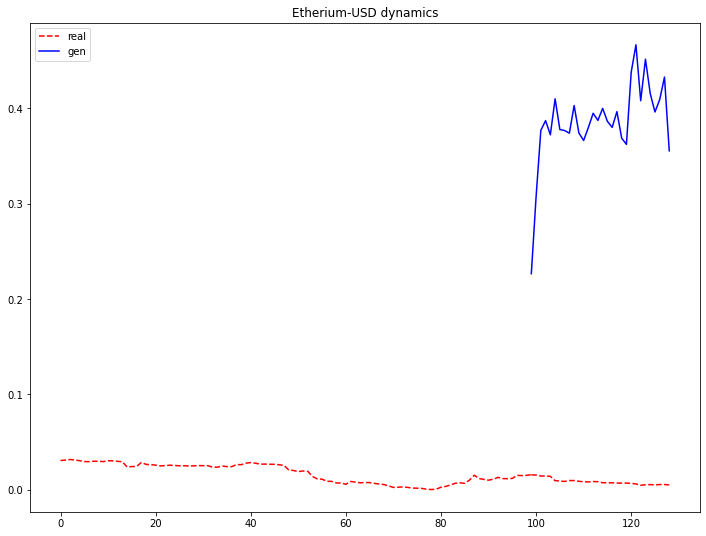

D_loss: -1.3504420518875122, G_loss: 4.57413387298584


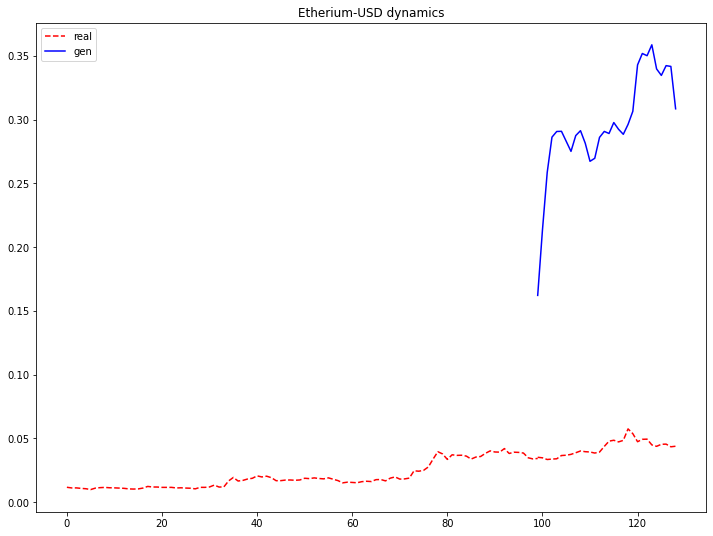

D_loss: -1.3353493213653564, G_loss: 4.54235315322876


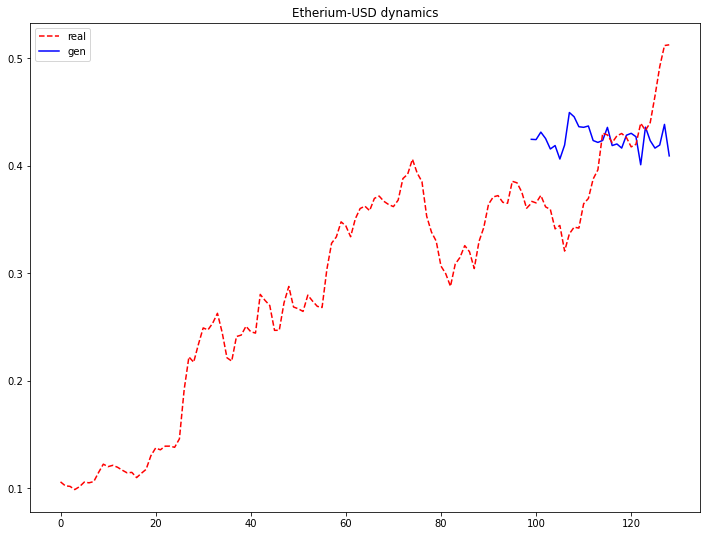

D_loss: -1.3185278177261353, G_loss: 4.497580051422119


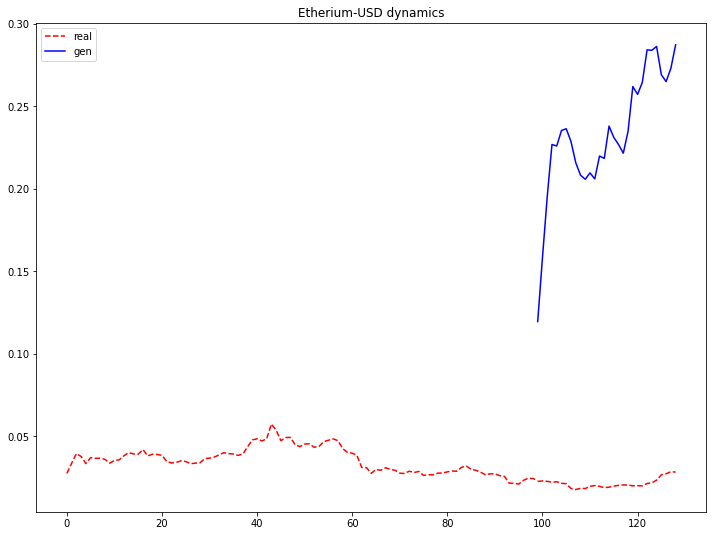

D_loss: -1.2981821298599243, G_loss: 4.451939105987549


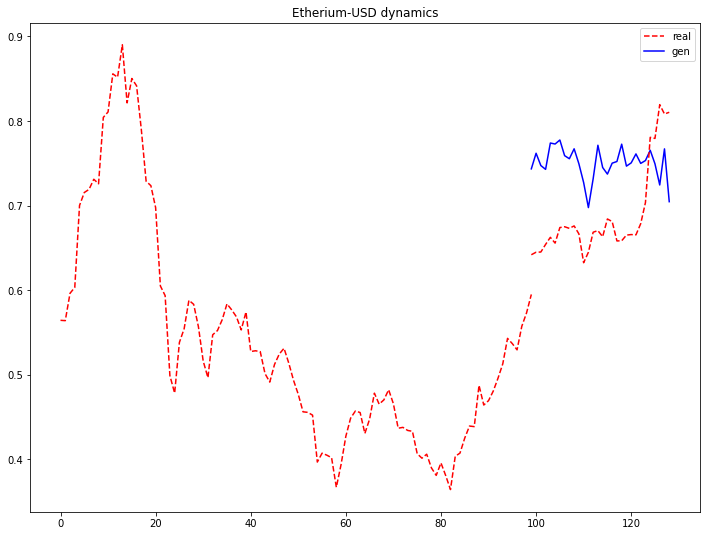

D_loss: -1.275452733039856, G_loss: 4.399937629699707


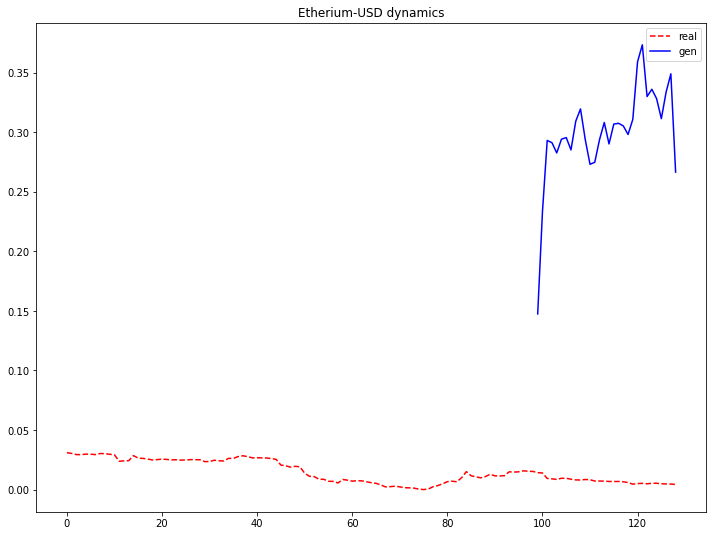

D_loss: -1.254677176475525, G_loss: 4.359198093414307


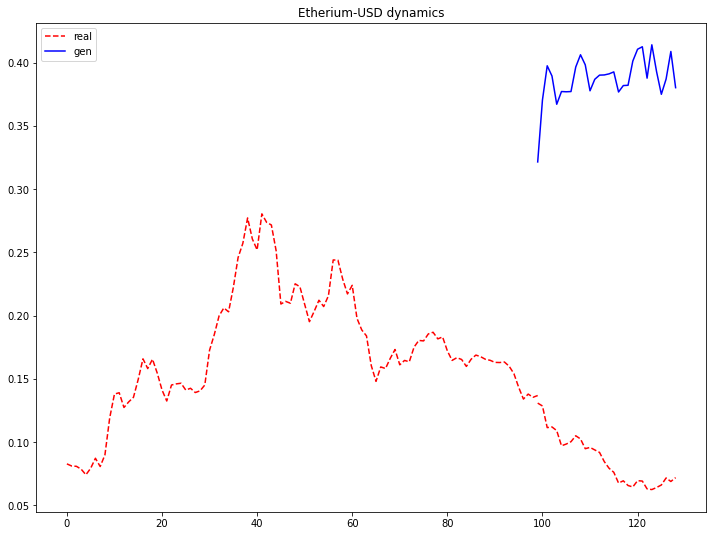

D_loss: -1.231872320175171, G_loss: 4.32266092300415


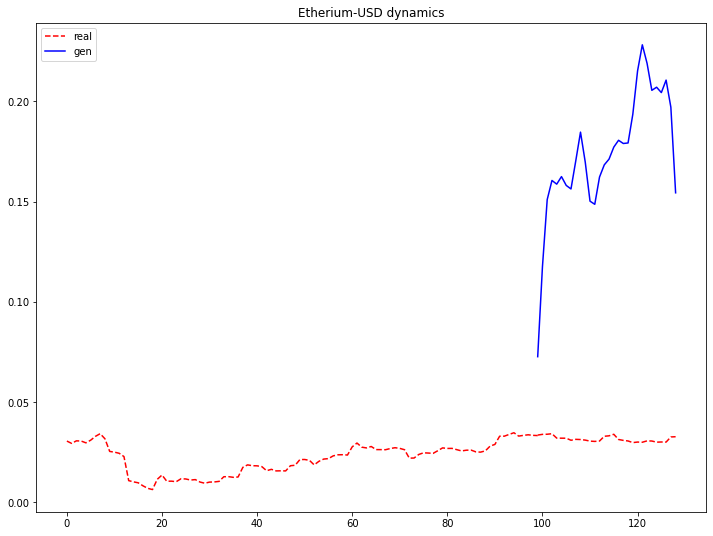

D_loss: -1.2084088325500488, G_loss: 4.276444435119629


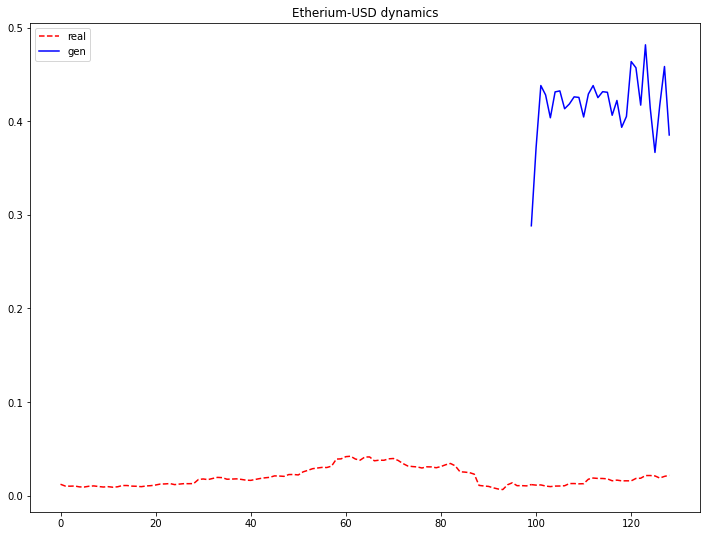

D_loss: -1.1833466291427612, G_loss: 4.2313714027404785


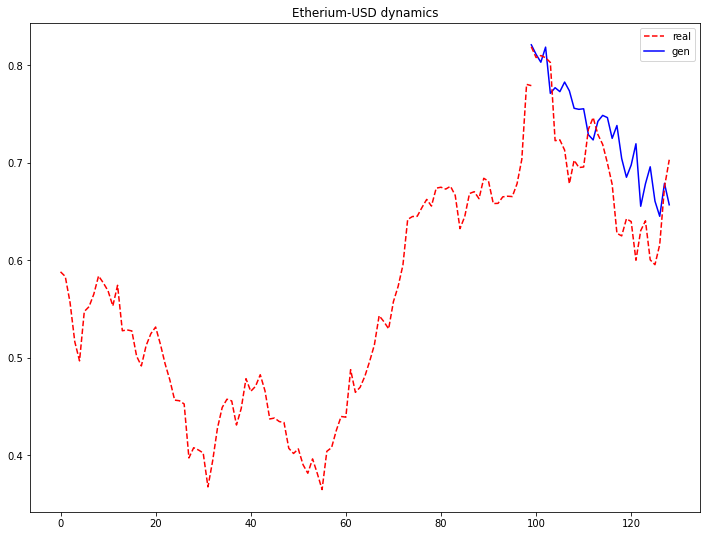

D_loss: -1.15498685836792, G_loss: 4.187969207763672


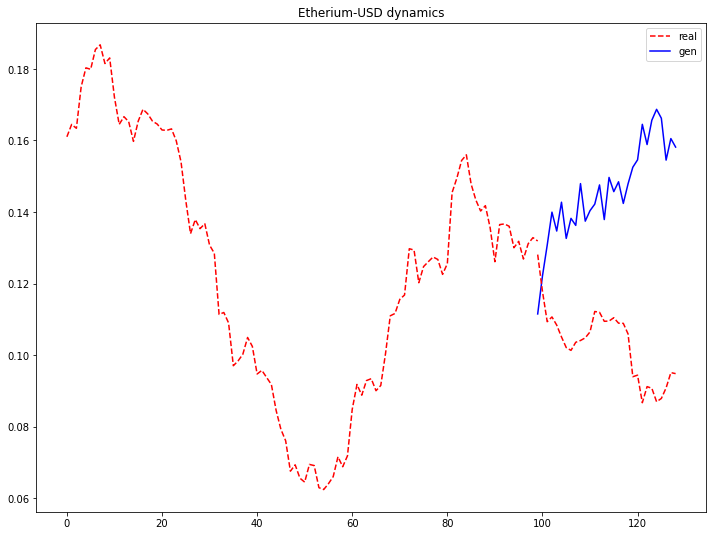

D_loss: -1.1274235248565674, G_loss: 4.144968509674072


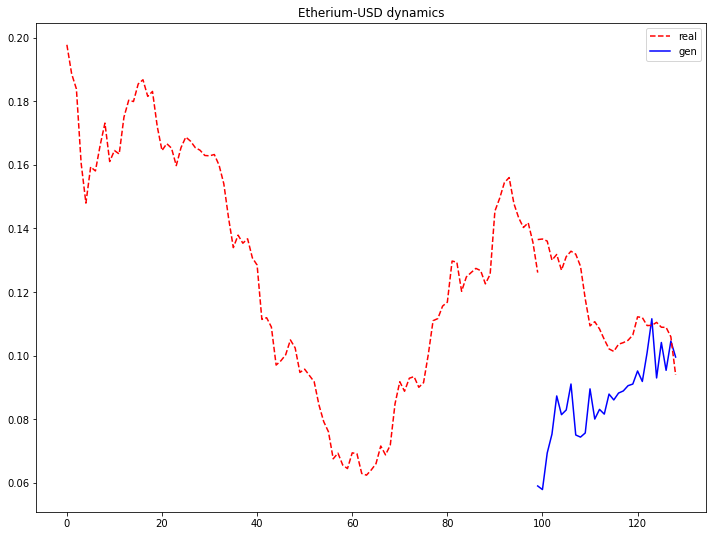

D_loss: -1.1006205081939697, G_loss: 4.104065895080566


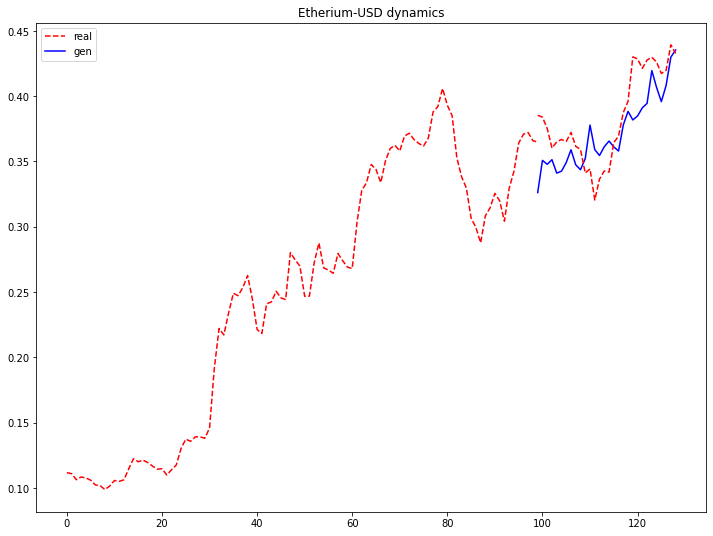

D_loss: -1.075387716293335, G_loss: 4.067663669586182


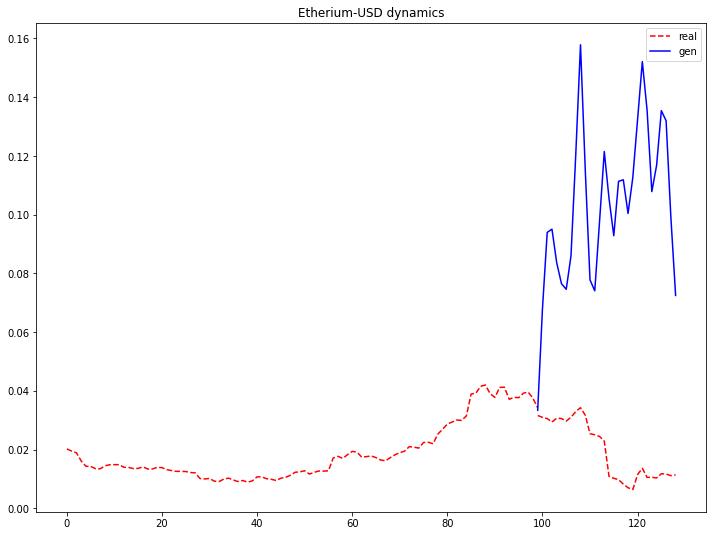

D_loss: -1.0518884658813477, G_loss: 4.026200294494629


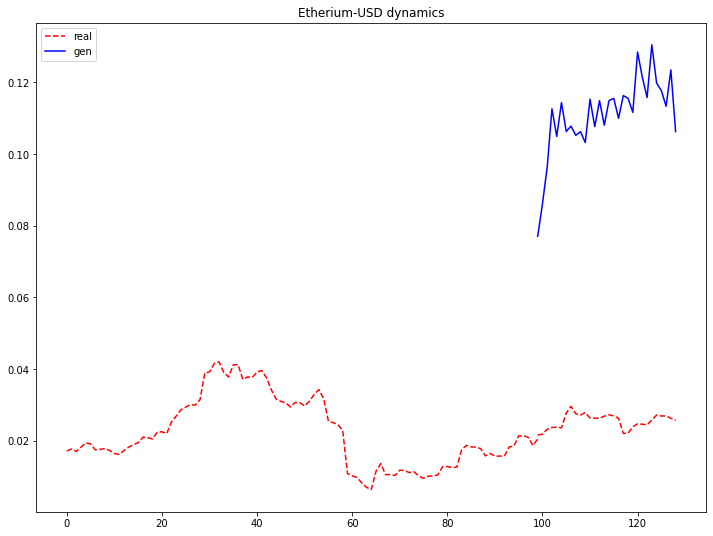

D_loss: -1.0281257629394531, G_loss: 3.9878435134887695


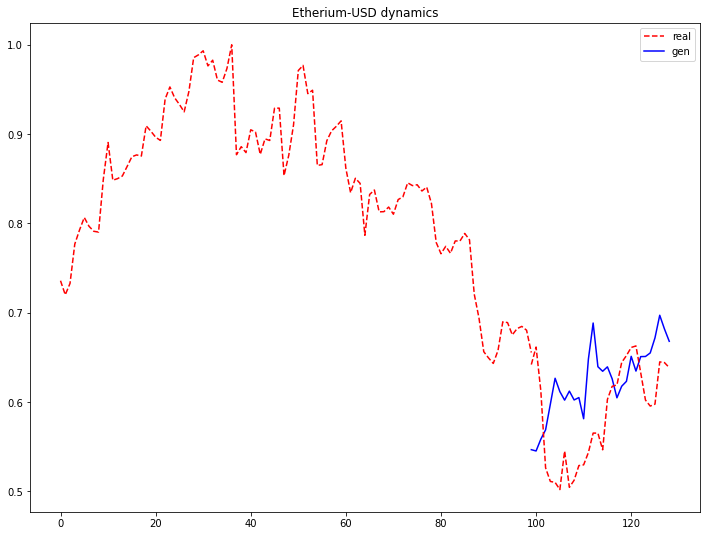

D_loss: -1.0055011510849, G_loss: 3.9398300647735596


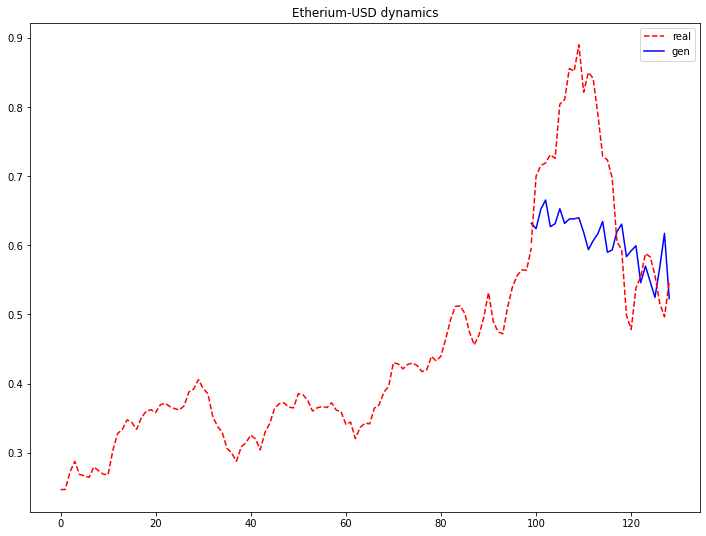

D_loss: -0.9838531017303467, G_loss: 3.8982067108154297


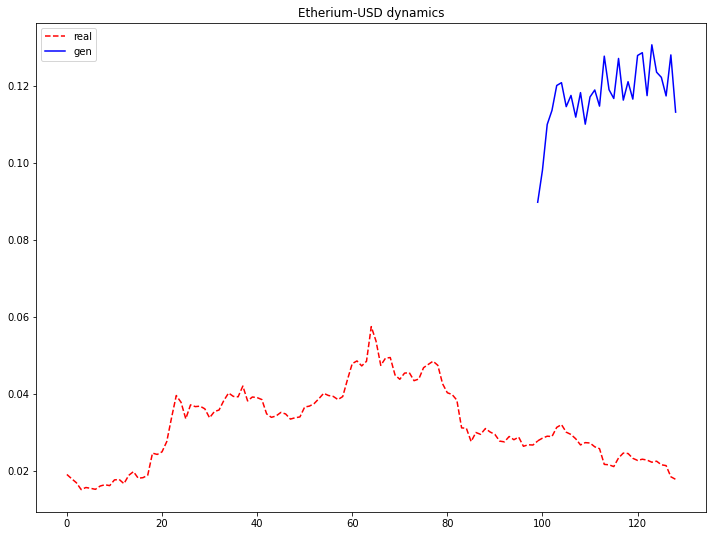

D_loss: -0.9618088603019714, G_loss: 3.8551948070526123


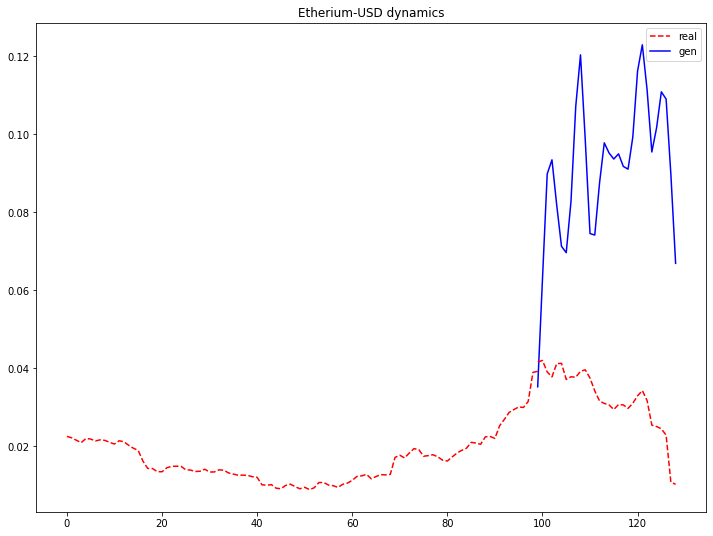

D_loss: -0.9409000873565674, G_loss: 3.8099586963653564


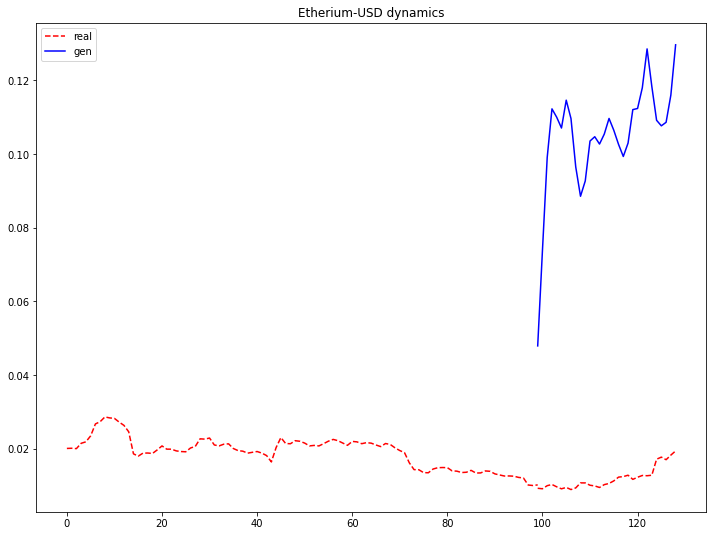

D_loss: -0.92264324426651, G_loss: 3.7736761569976807


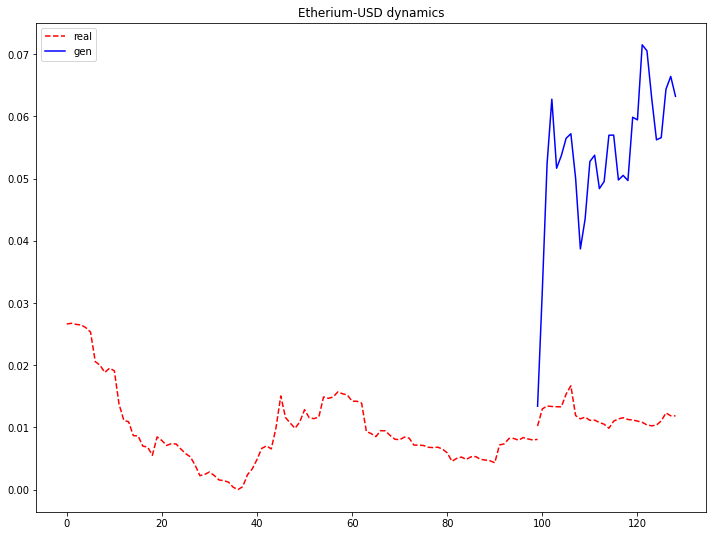

D_loss: -0.9032184481620789, G_loss: 3.7352051734924316


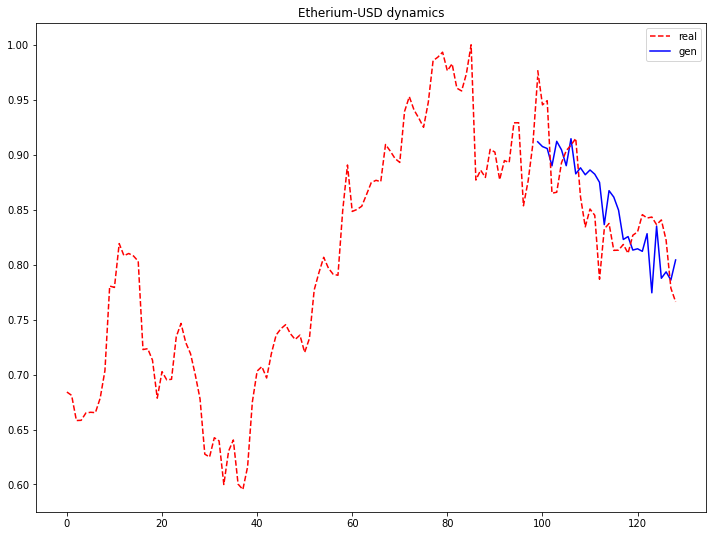

D_loss: -0.8850629925727844, G_loss: 3.6973164081573486


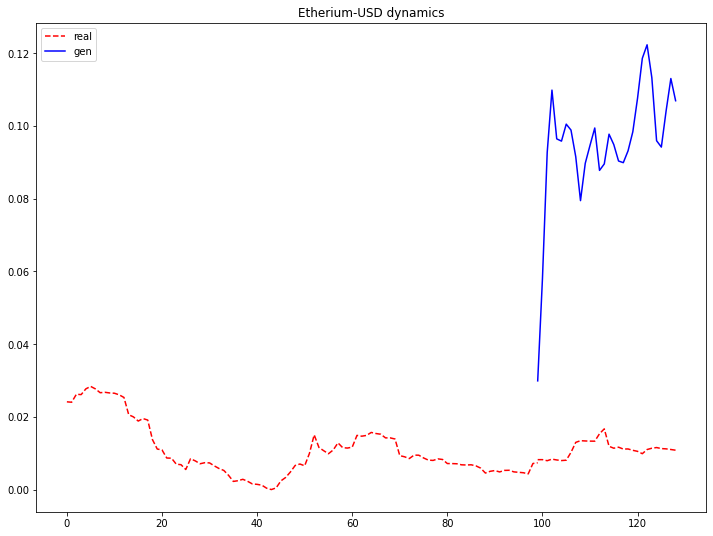

D_loss: -0.867802083492279, G_loss: 3.6619832515716553


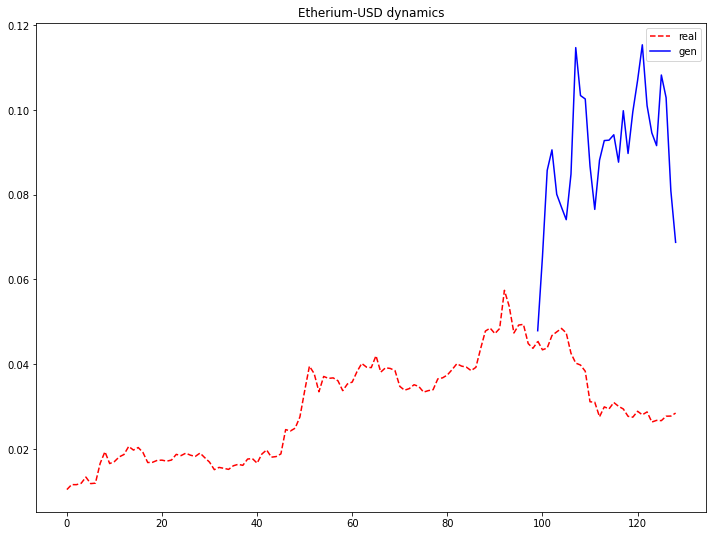

D_loss: -0.8514514565467834, G_loss: 3.6221587657928467


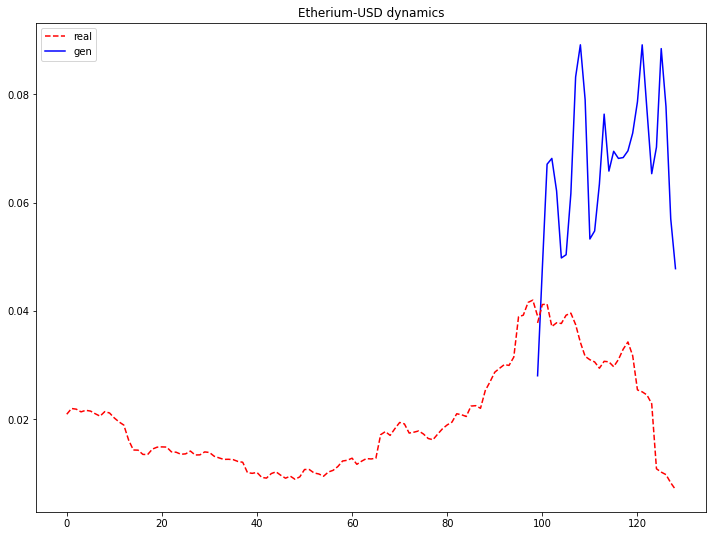

D_loss: -0.8355547785758972, G_loss: 3.5801210403442383


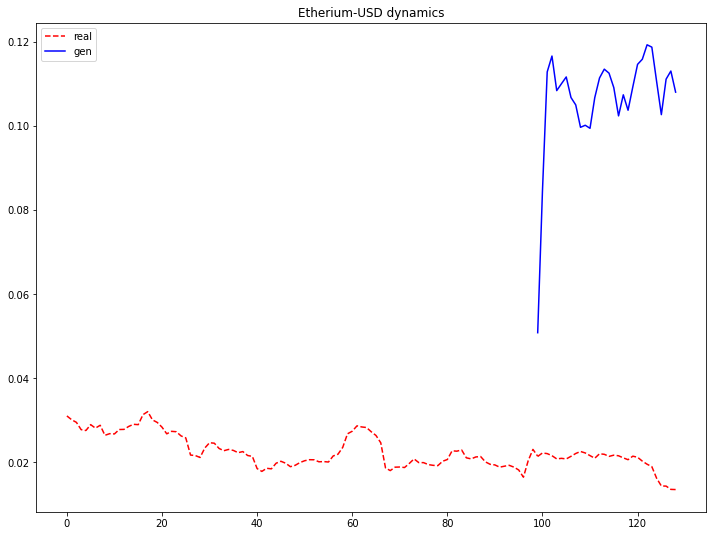

D_loss: -0.8208698630332947, G_loss: 3.5449445247650146


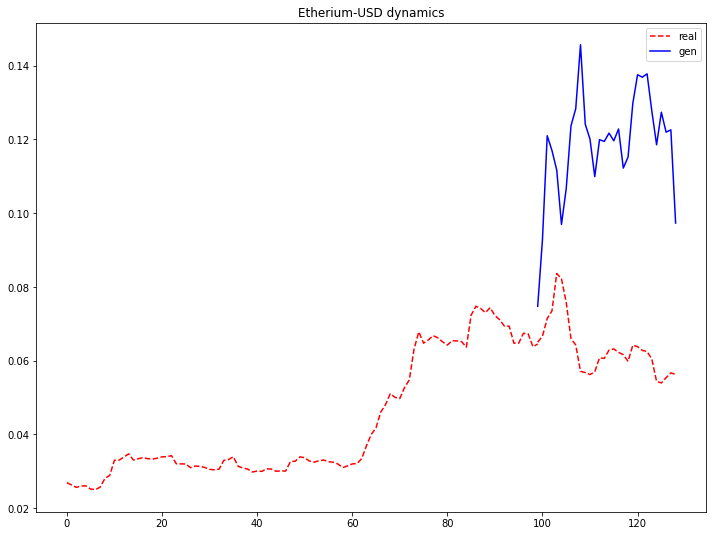

D_loss: -0.8060604929924011, G_loss: 3.510814666748047


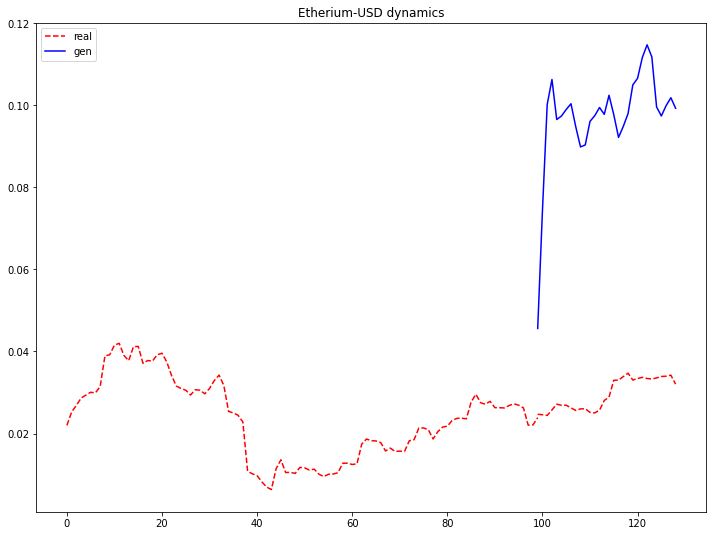

D_loss: -0.7914992570877075, G_loss: 3.4732699394226074


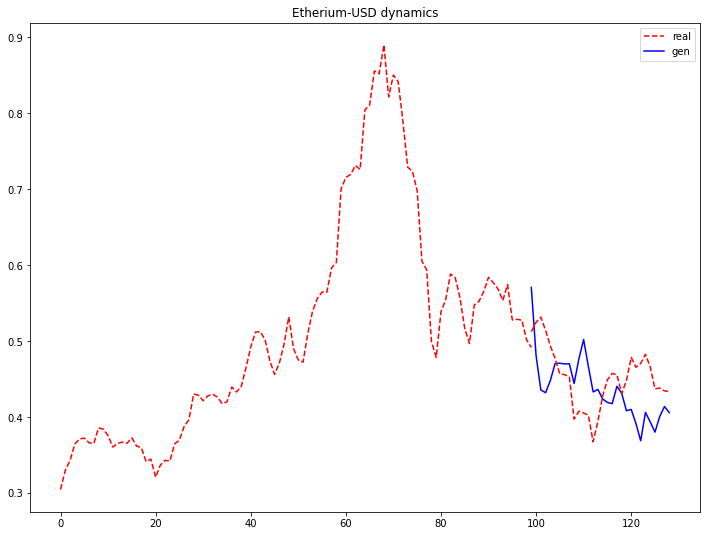

D_loss: -0.778442919254303, G_loss: 3.441046953201294


In [ ]:
wgen_meta, wdisc_meta = train_mlp(dataloader, device, wgan=True, draw_graphs=True, meta_flag=True)

In [ ]:
torch.save(wgen_clean.state_dict(), PATH + "wgen_mlp_1d_clean")
torch.save(wdisc_clean.state_dict(), PATH + "wdisc_mlp_1d_clean")
torch.save(wgen_meta.state_dict(), PATH  + "wgen_mlp_1d_meta")
torch.save(wdisc_meta.state_dict(), PATH + "wdisc_mlp_1d_meta")

In [ ]:
def plot_generated_series(data,
                          starting_points,
                          min, max,
                          gen,
                          num_steps=num_steps,
                          num_series=num_series,
                          pair_name="ETS-USD",
                          model_name="GAN"):
    """
    Plots one ts.
    """

    plt.figure(figsize=(12, 7))
    plt.plot(np.arange(0, len(data)), data, color='red', ls='--', lw=1.5, label="Real data")
    plt.title("Real and simulated by {0} data for {1} pair".format(model_name, pair_name))

    for x in range(1):
        generated_series = generate_series(gen,
                                            starting_points,
                                            min, max,
                                            num_steps=num_steps,
                                            num_series=num_series)
        
        plt.plot(np.arange(0, len(generated_series[0][0])), 
                generated_series.detach().numpy()[0, 0],
                 label="Generated series #{}".format(x + 1))

    plt.legend()
    plt.show()

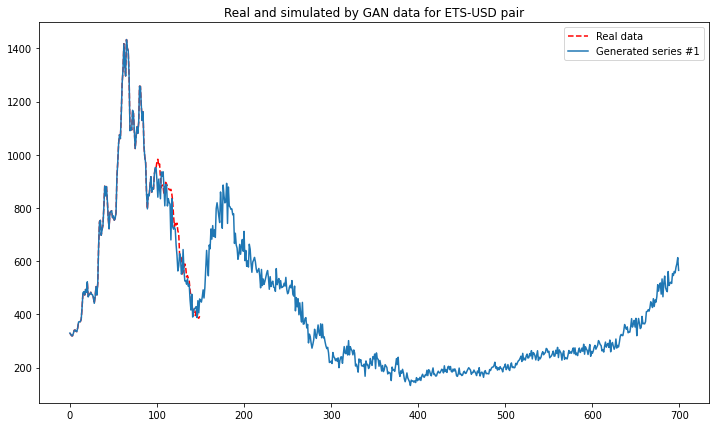

In [ ]:
plot_generated_series(ETH_USD_df['High'][:150],
                      dataset[0][0][None],
                      [eth_min], [eth_max],
                      gen=gen_clean,
                      num_steps=20,
                      num_series=1,
                      pair_name="ETS-USD")

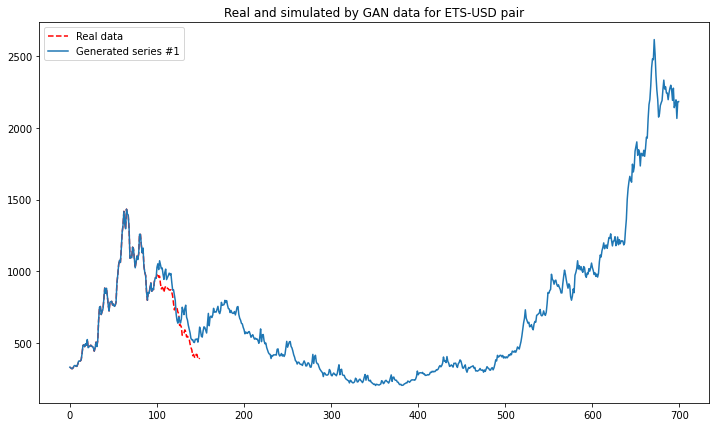

In [ ]:
plot_generated_series(ETH_USD_df['High'][:150],
                      dataset[0][0][None],
                      [eth_min], [eth_max],
                      gen=gen_meta,
                      num_steps=20,
                      num_series=1,
                      pair_name="ETS-USD")

#### 2.2 Single series test of WGAN

In [ ]:
gen_w, disc_w = train_mlp(dataloader, "cpu", wgan=False, draw_graphs=False)

In [ ]:
plot_generated_series(ETH_USD_df['High'][0:100],
                      dataset[0][0][None],
                      [eth_min], [eth_max],
                      gen=gen_w,
                      num_steps=16,
                      num_series=1,
                      pair_name="ETS-USD",
                      model_name="WGAN")

Надо контролировать дисперсию выходов у WGAN-ов. Немного потьюнил гиперпараметры

#### 2.3 Multidimenstional TS test

In [ ]:
df4d = pd.read_csv(PATH + "ALL_DATA.csv", index_col=0)

minima = df4d.describe().loc["min"]
maxima = df4d.describe().loc["max"]
scaled4d = [(df4d["ETH_high"] - minima[0]) / (maxima[0] - minima[0]),
               (df4d["BTC_high"] - minima[1]) / (maxima[1] - minima[1]),
               (df4d["BNB_high"] - minima[2]) / (maxima[2] - minima[2]),
               (df4d["USDT_high"] - minima[3]) / (maxima[3] - minima[3])]
scaled4d

dataset4d = TSWGANDataset(scaled4d, condition_size=condition_size, 
                        prediction_size=prediction_size)

dataloader4d = torch.utils.data.DataLoader(
    dataset4d,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

  0%|          | 0/1000 [00:00<?, ?it/s]

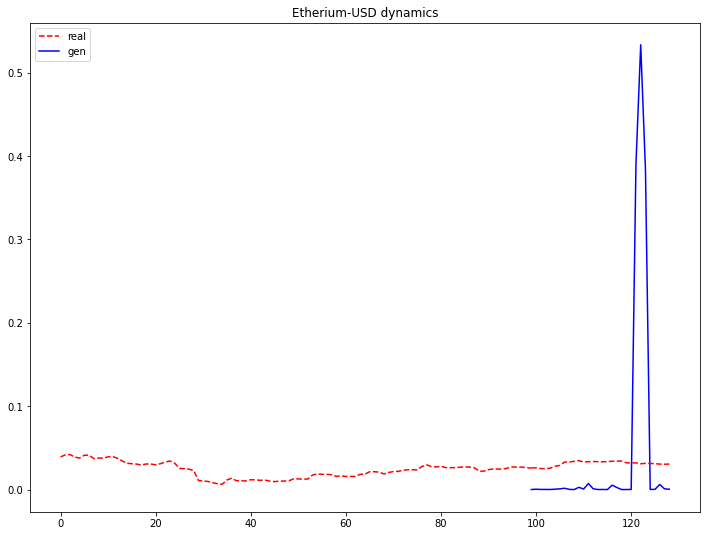

D_loss: 1.6309304237365723, G_loss: 1.0920958518981934


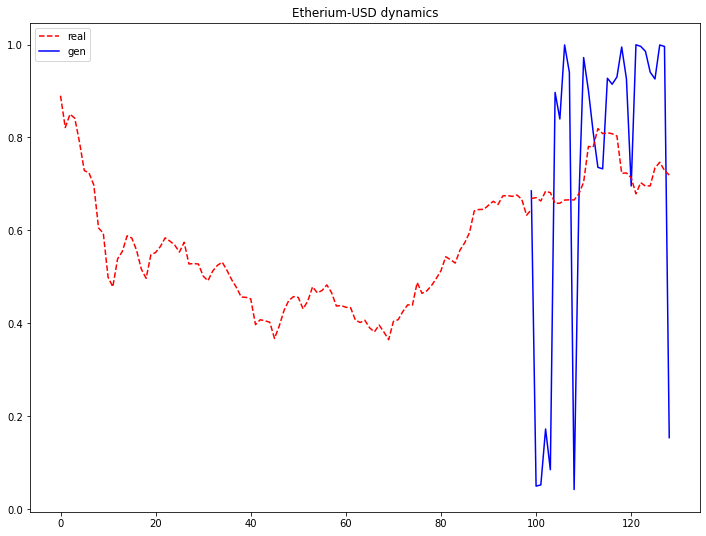

D_loss: 0.8741323947906494, G_loss: 2.540961265563965


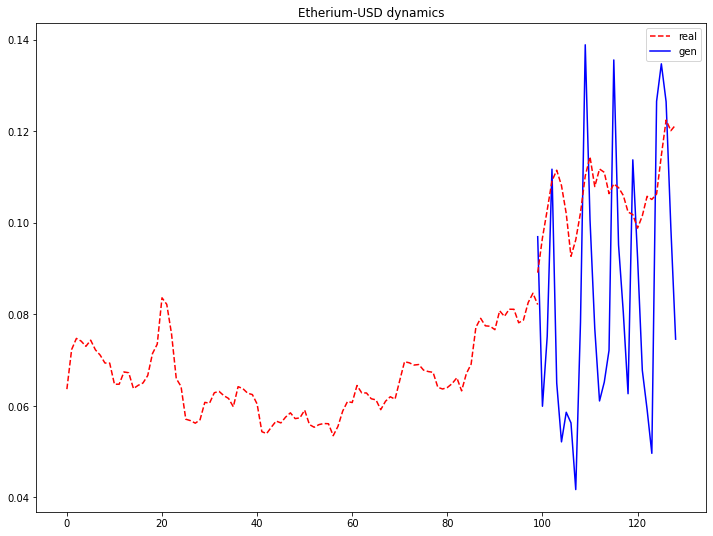

D_loss: 0.8236339092254639, G_loss: 2.7695295810699463


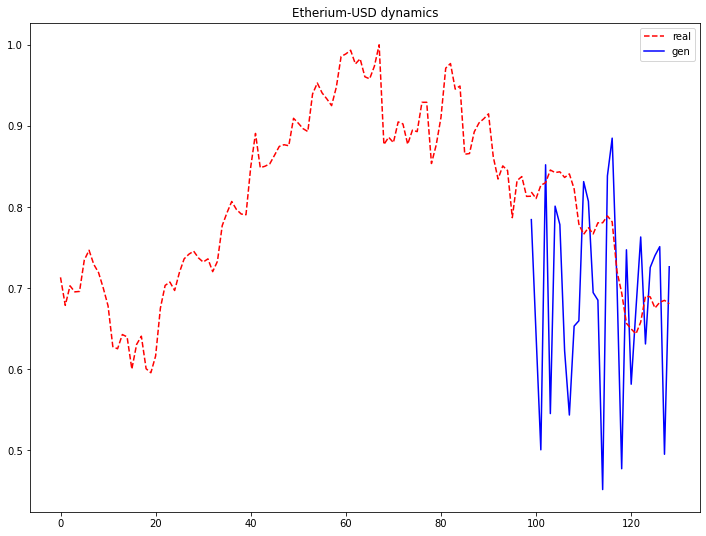

D_loss: 0.7810964584350586, G_loss: 2.9985191822052


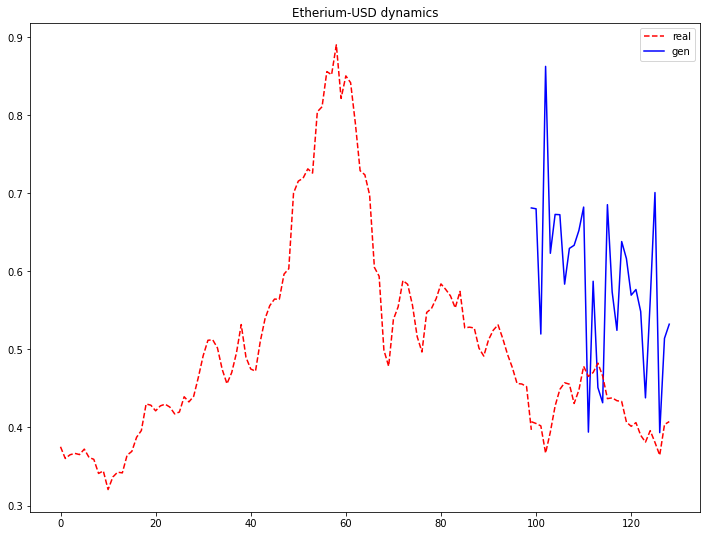

D_loss: 0.7485283613204956, G_loss: 3.245638608932495


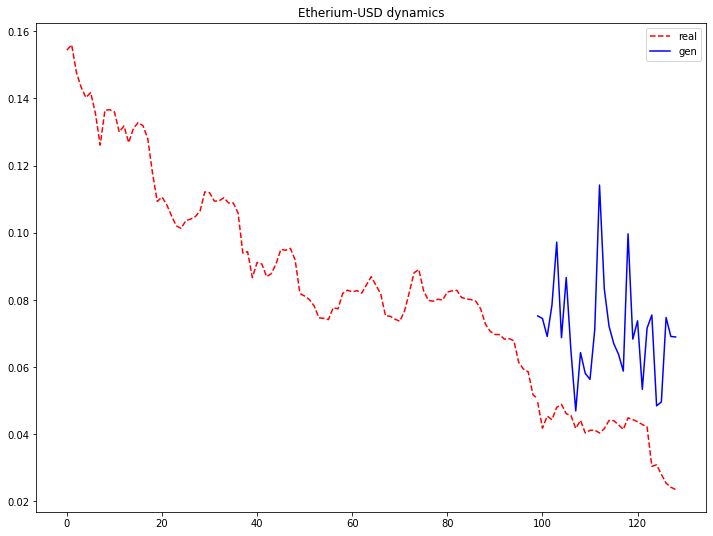

D_loss: 0.7151005268096924, G_loss: 3.4928503036499023


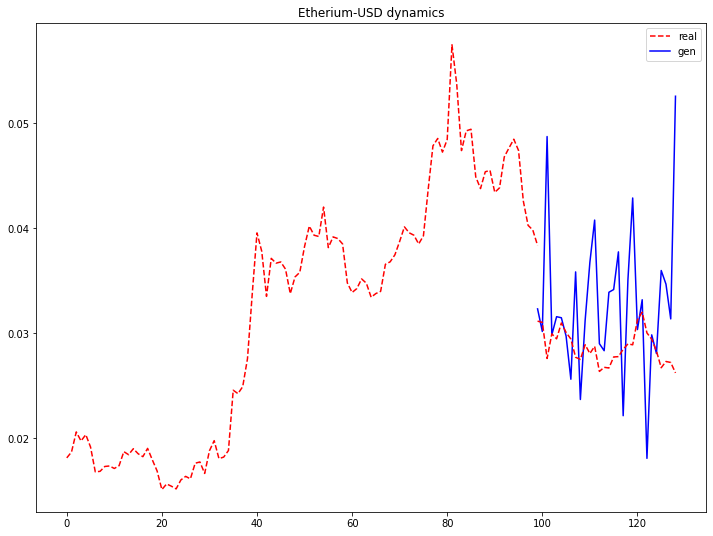

D_loss: 0.6897653341293335, G_loss: 3.683215856552124


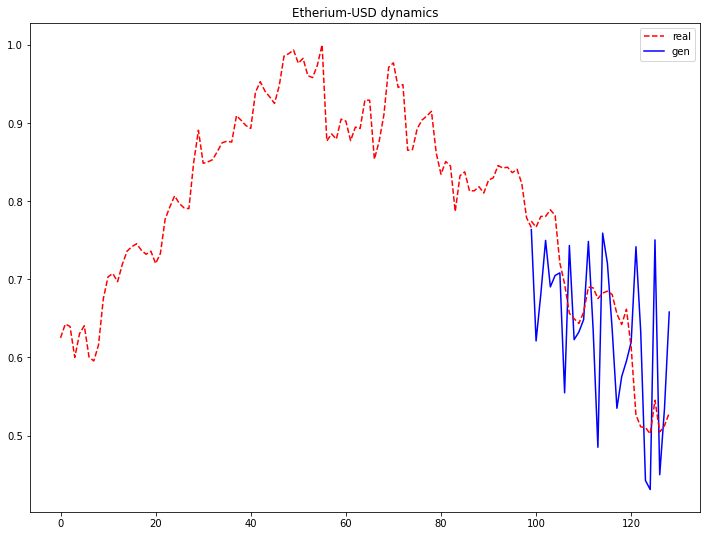

D_loss: 0.6689082384109497, G_loss: 3.8632264137268066


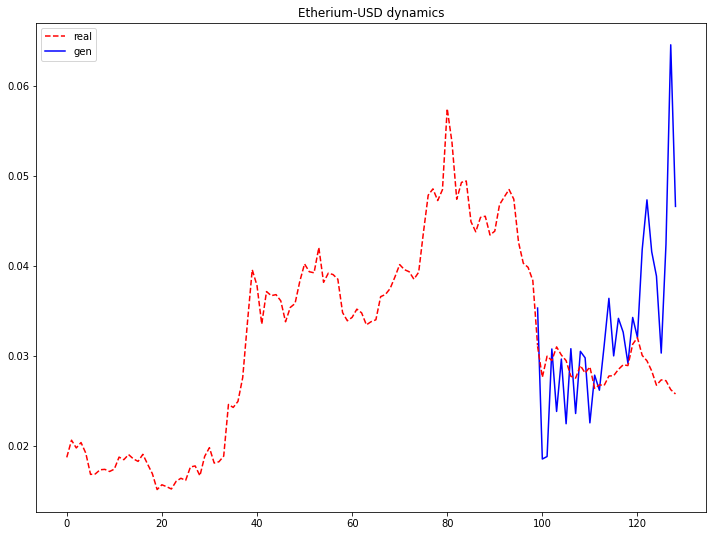

D_loss: 0.6554887294769287, G_loss: 3.987187385559082


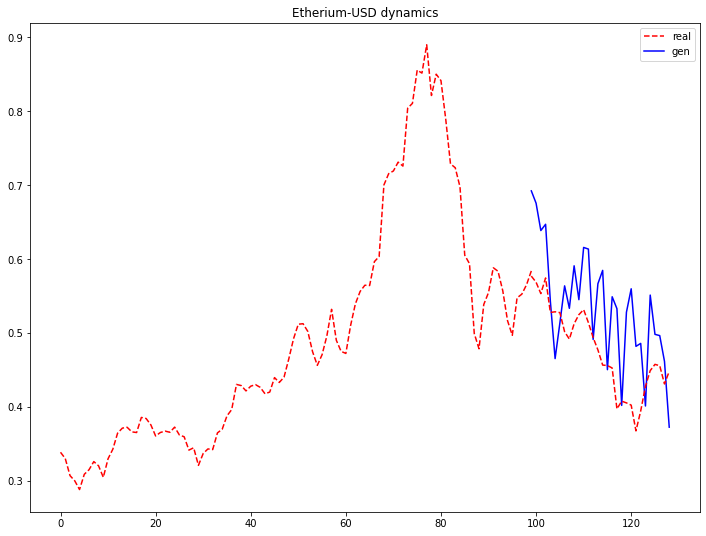

D_loss: 0.6385757923126221, G_loss: 4.118924140930176


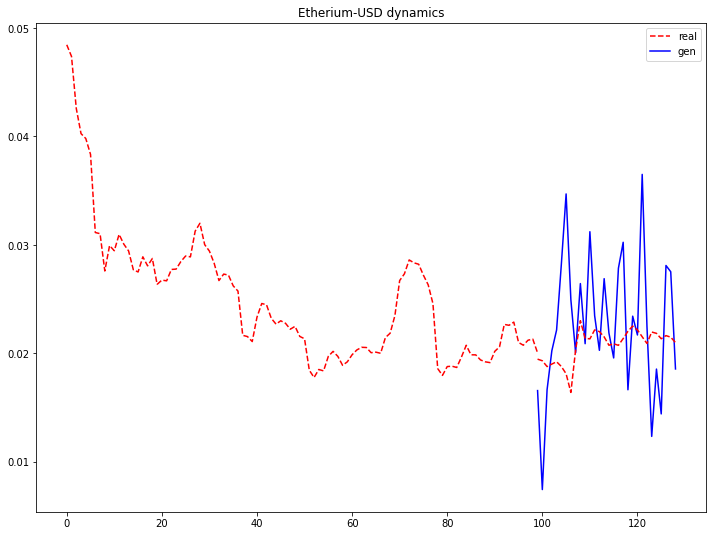

D_loss: 0.625325083732605, G_loss: 4.227051258087158


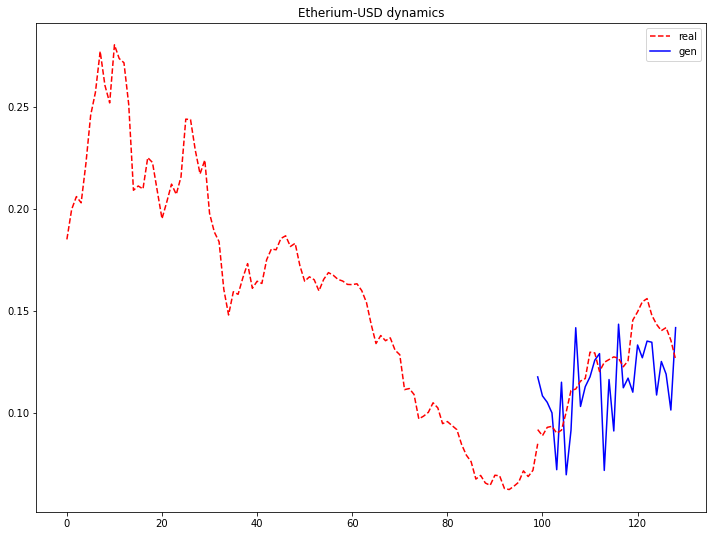

D_loss: 0.6189242005348206, G_loss: 4.2752604484558105


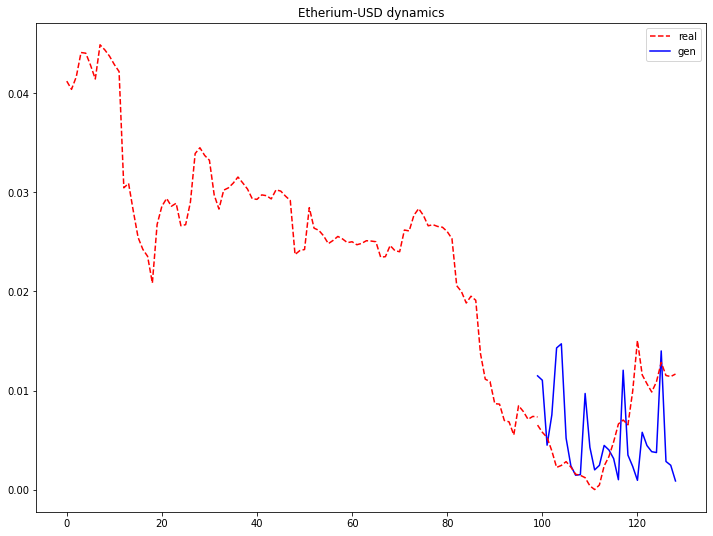

D_loss: 0.6121931672096252, G_loss: 4.335579872131348


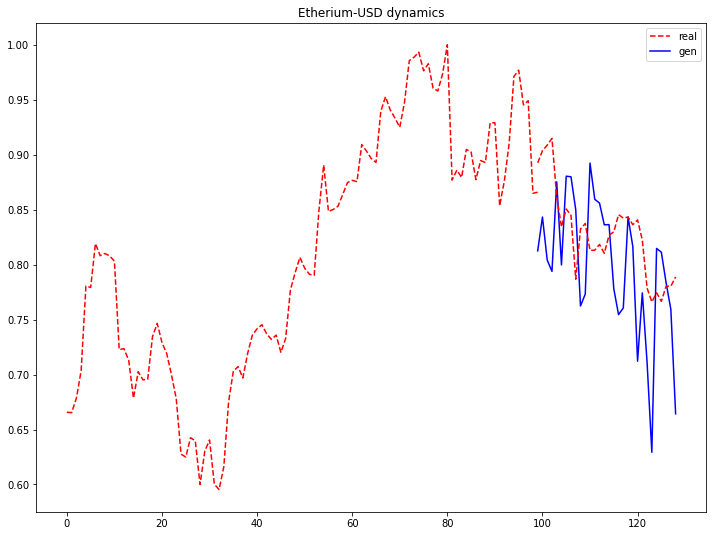

D_loss: 0.6046329736709595, G_loss: 4.396412372589111


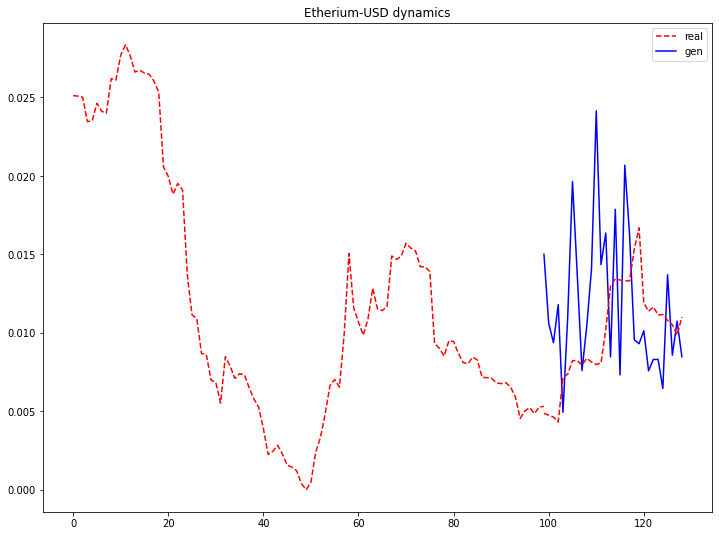

D_loss: 0.5981962084770203, G_loss: 4.444888114929199


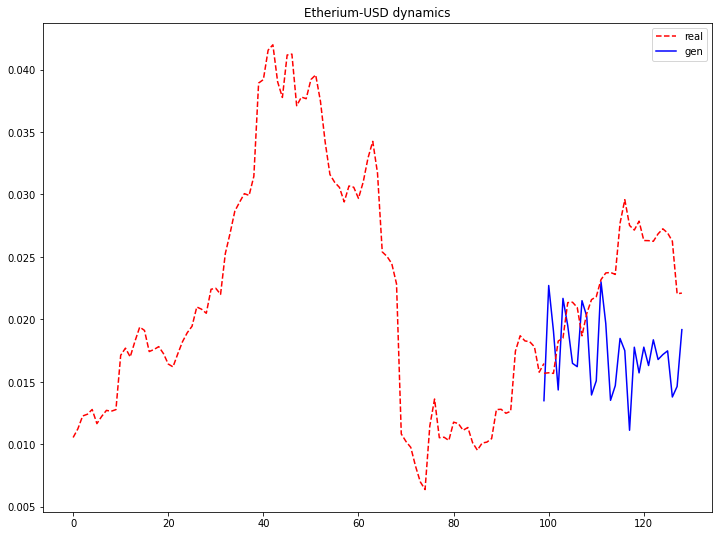

D_loss: 0.592218279838562, G_loss: 4.4942755699157715


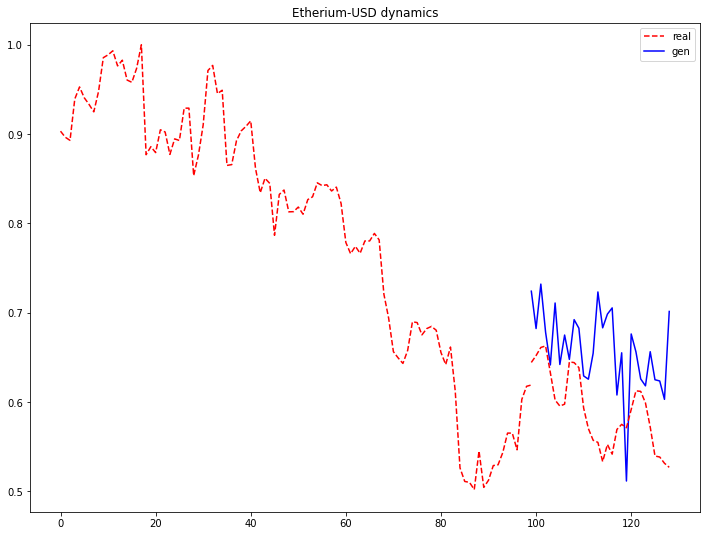

D_loss: 0.5860397815704346, G_loss: 4.551945209503174


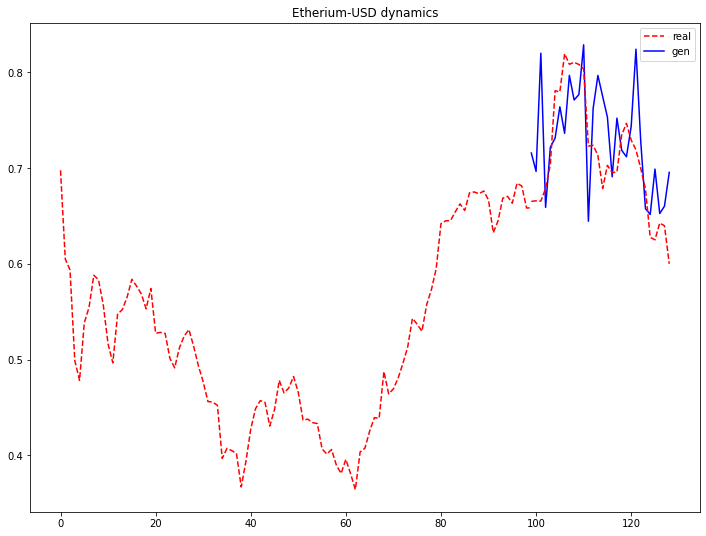

D_loss: 0.5805532336235046, G_loss: 4.6092753410339355


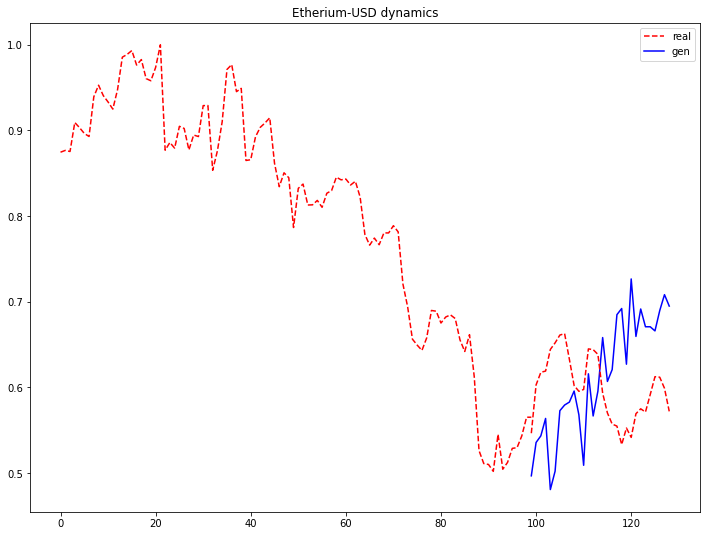

D_loss: 0.5774903893470764, G_loss: 4.6300787925720215


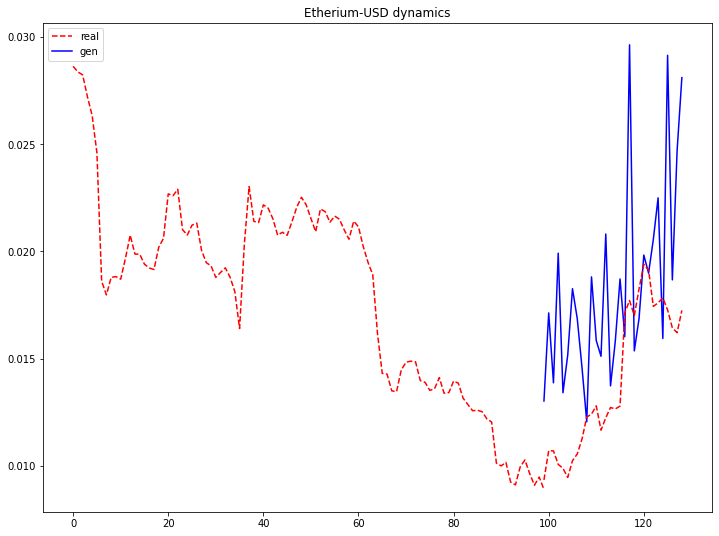

D_loss: 0.5741409063339233, G_loss: 4.664458751678467


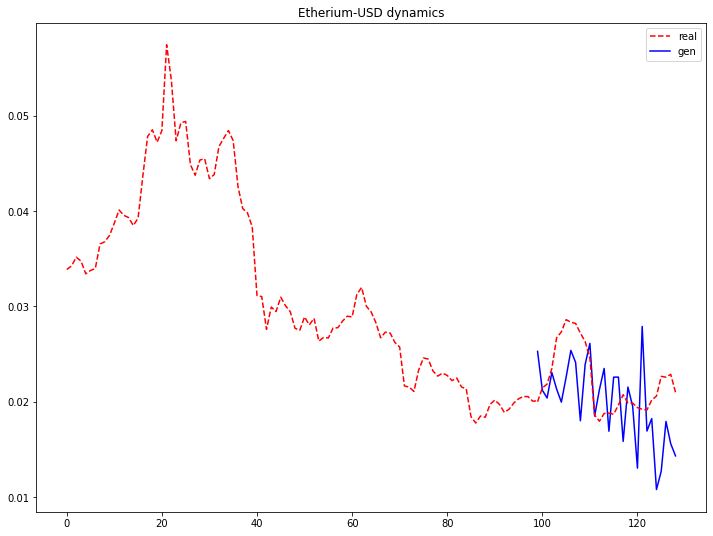

D_loss: 0.5720027685165405, G_loss: 4.682136058807373


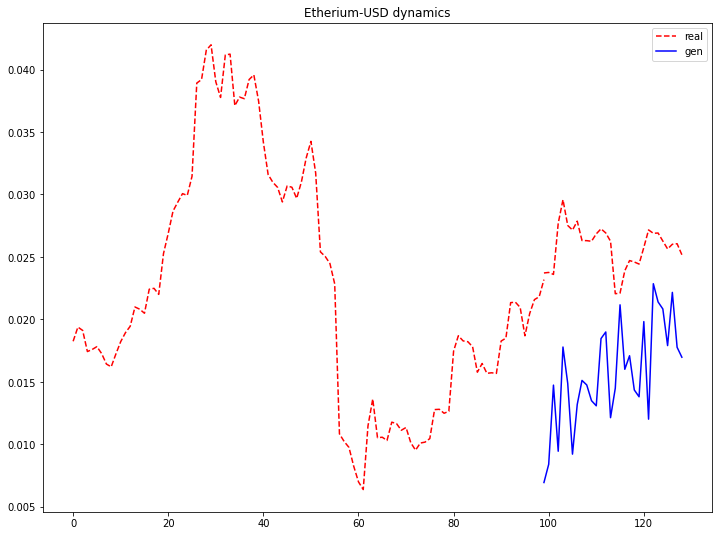

D_loss: 0.5687853693962097, G_loss: 4.701653957366943


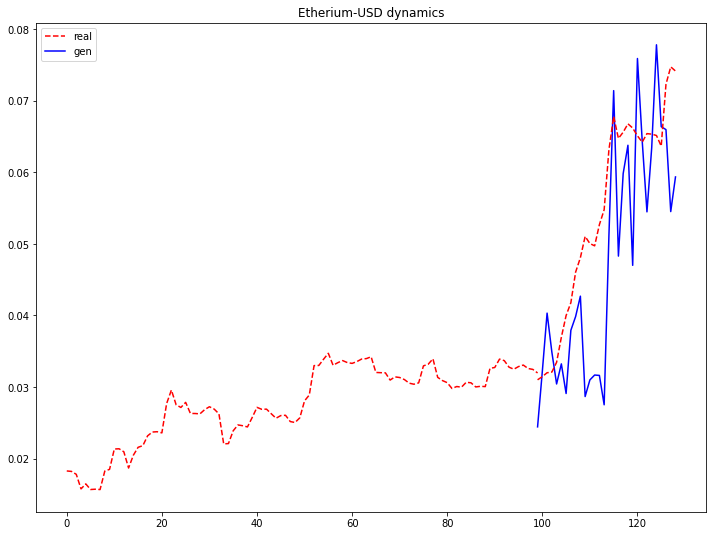

D_loss: 0.5654087066650391, G_loss: 4.72860050201416


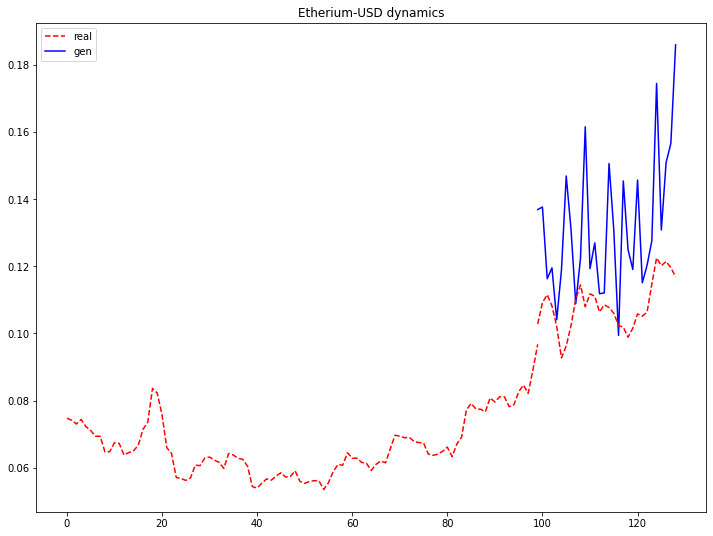

D_loss: 0.5613439679145813, G_loss: 4.7566328048706055


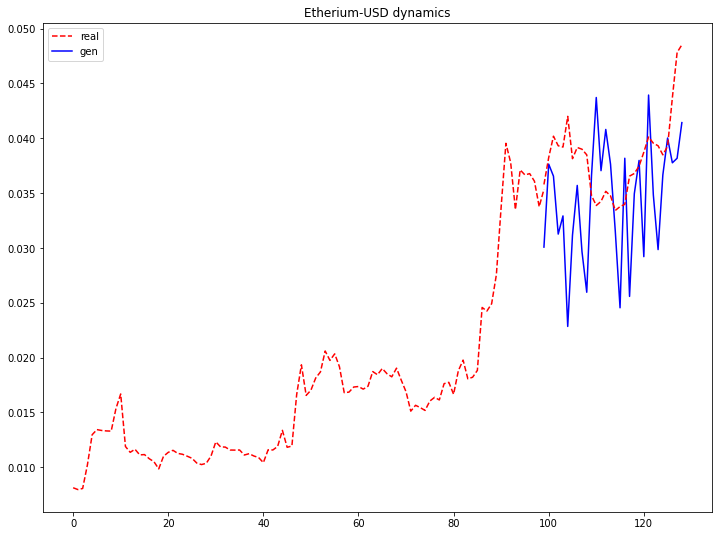

D_loss: 0.5583094358444214, G_loss: 4.778085231781006


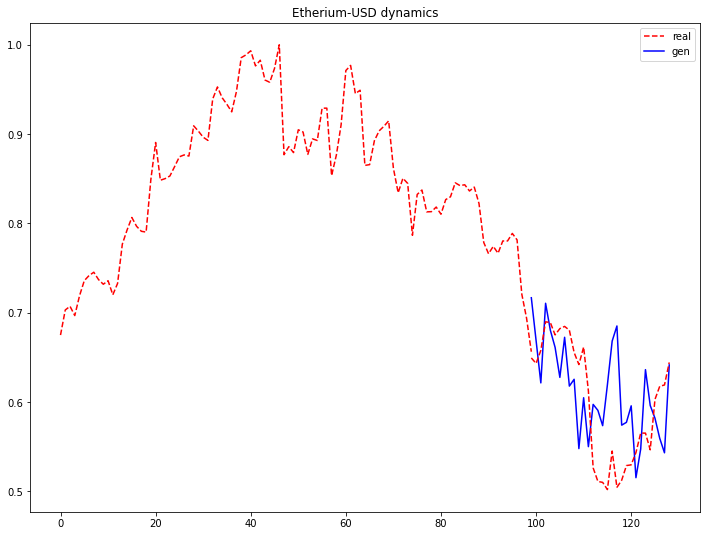

D_loss: 0.5557682514190674, G_loss: 4.796390533447266


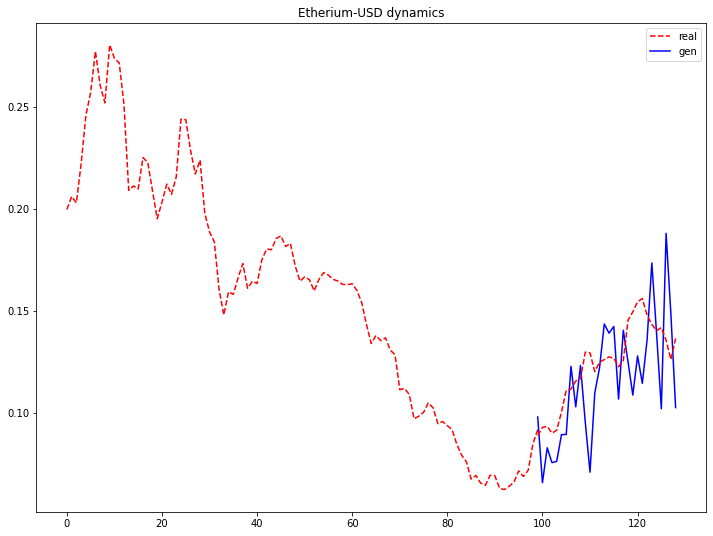

D_loss: 0.5540833473205566, G_loss: 4.804466247558594


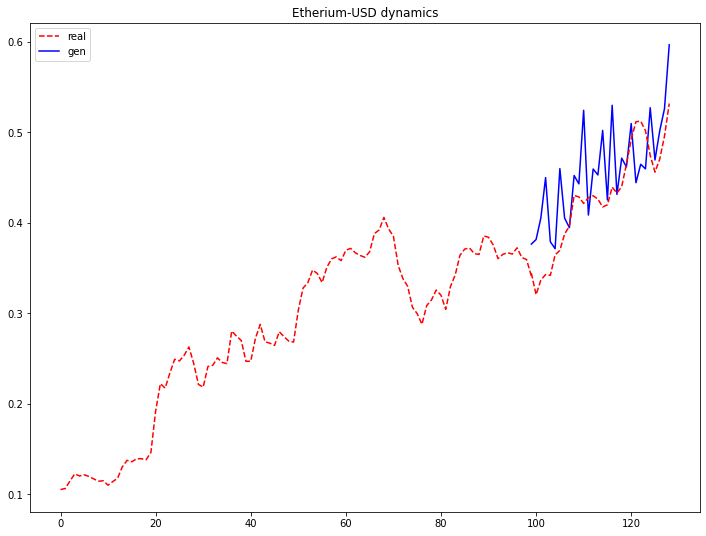

D_loss: 0.5520607829093933, G_loss: 4.824368953704834


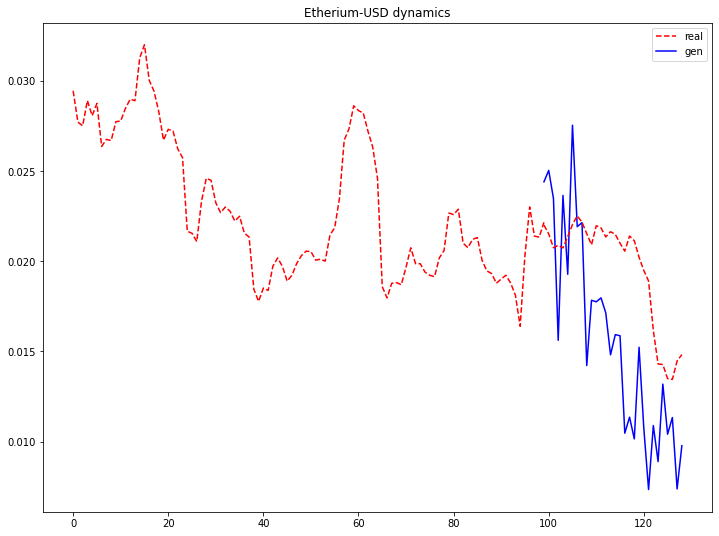

D_loss: 0.5498428344726562, G_loss: 4.836869716644287


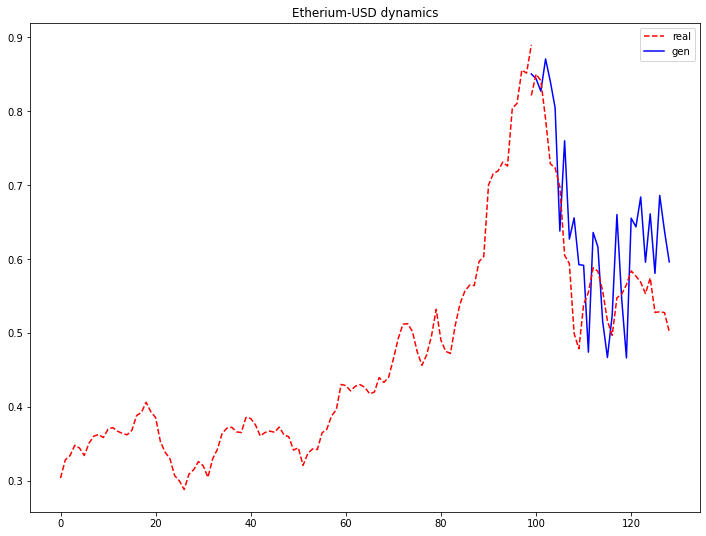

D_loss: 0.54903644323349, G_loss: 4.8453874588012695


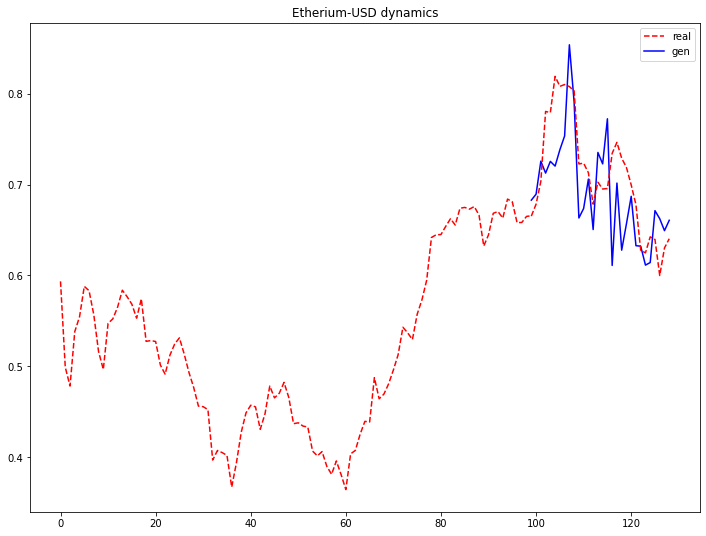

D_loss: 0.5483404994010925, G_loss: 4.849695682525635


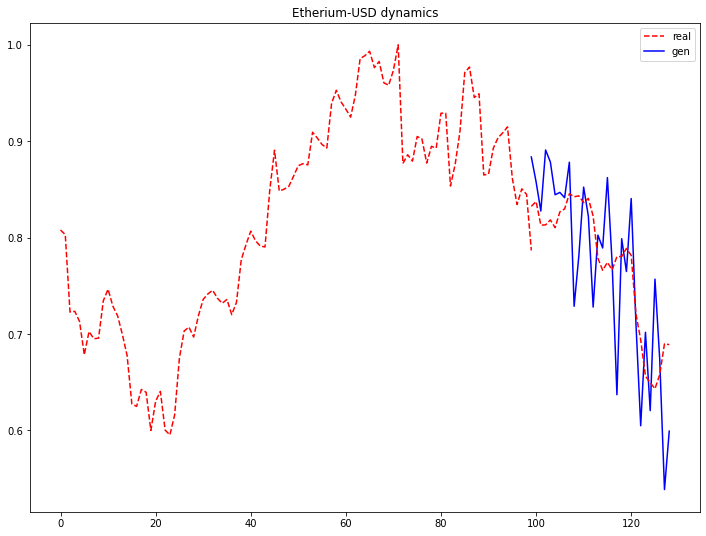

D_loss: 0.5477416515350342, G_loss: 4.854167938232422


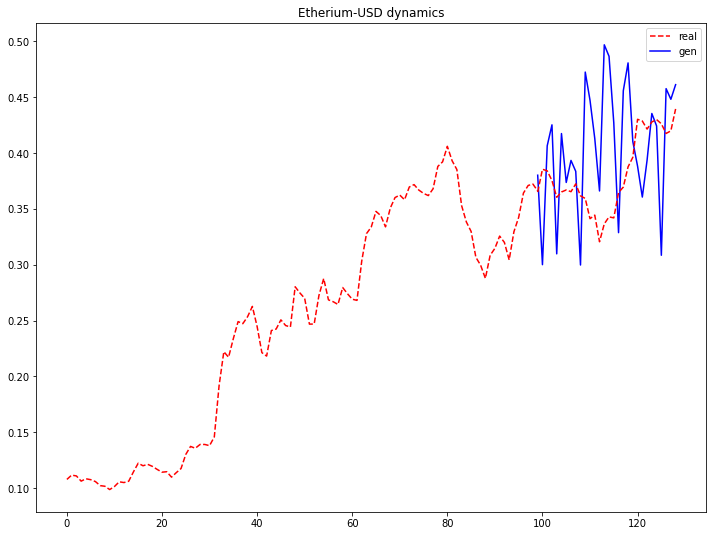

D_loss: 0.5468427538871765, G_loss: 4.855772018432617


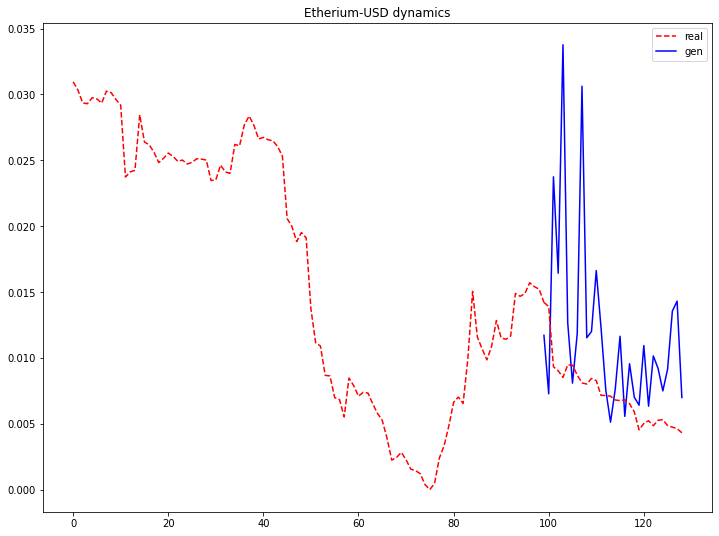

D_loss: 0.5460870265960693, G_loss: 4.858585834503174


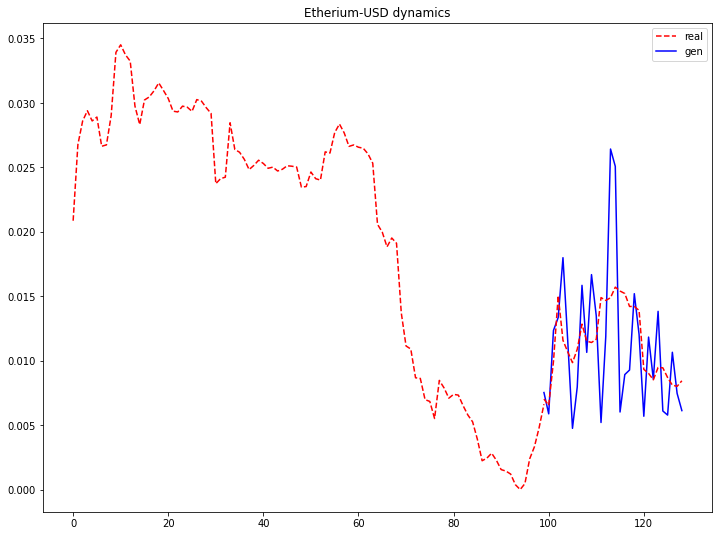

D_loss: 0.5450131297111511, G_loss: 4.86223840713501


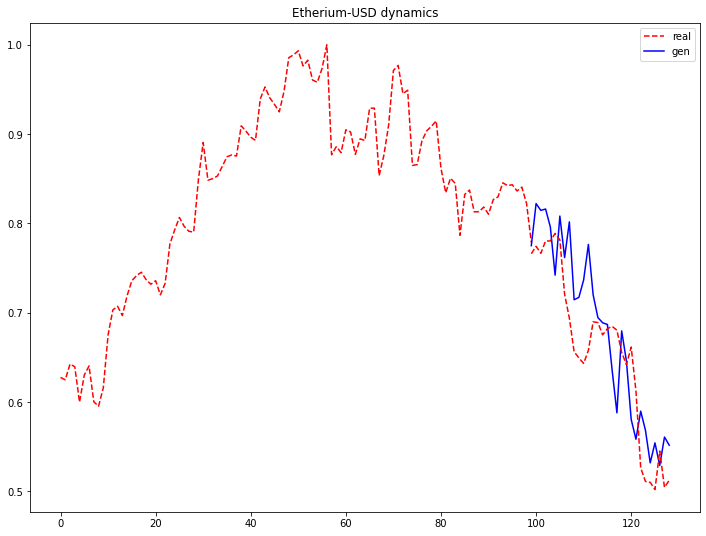

D_loss: 0.5440497994422913, G_loss: 4.867132186889648


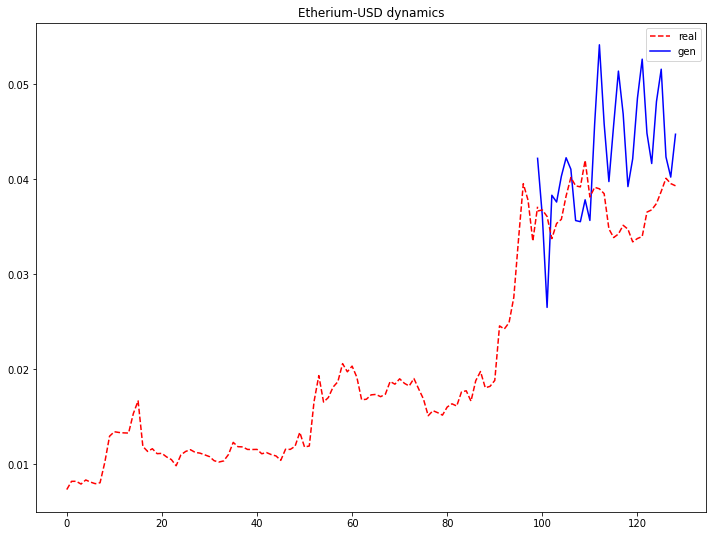

D_loss: 0.5430290699005127, G_loss: 4.873579025268555


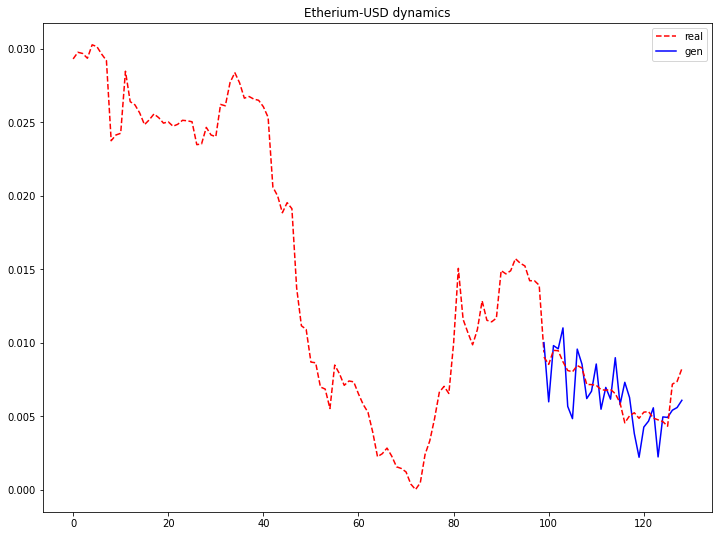

D_loss: 0.5419002771377563, G_loss: 4.883004188537598


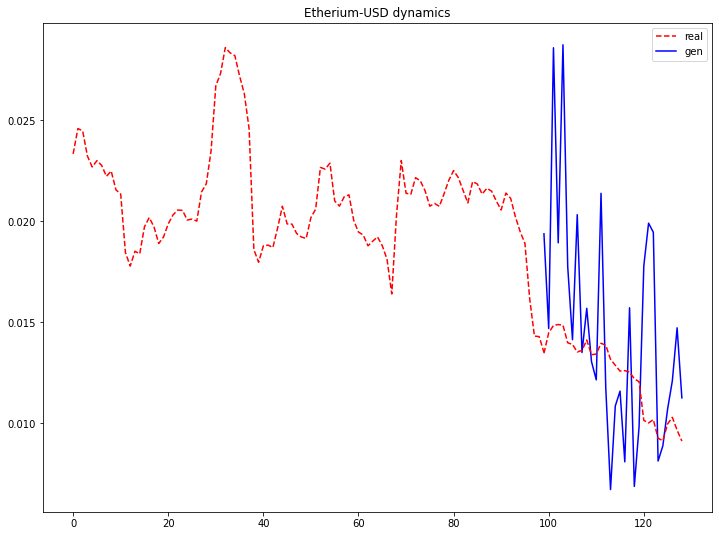

D_loss: 0.5408094525337219, G_loss: 4.890183925628662


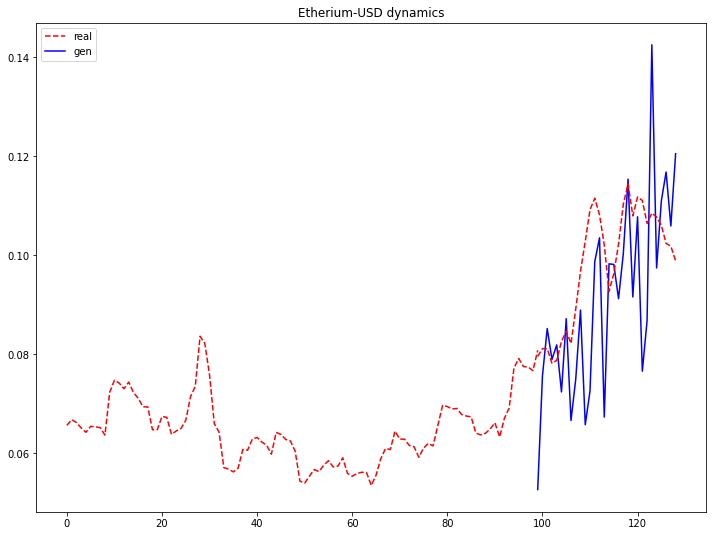

D_loss: 0.5396648645401001, G_loss: 4.896247386932373


In [ ]:
gen_w4d_clean, disc_w4d_clean = train_mlp(dataloader4d, wgan=0, draw_graphs=1, num_series=4, meta_flag=0)
torch.save(gen_w4d_clean.state_dict(), PATH + "gen_w4d_clean")
torch.save(disc_w4d_clean.state_dict(), PATH + "disc_w4d_clean")

  0%|          | 0/1000 [00:00<?, ?it/s]

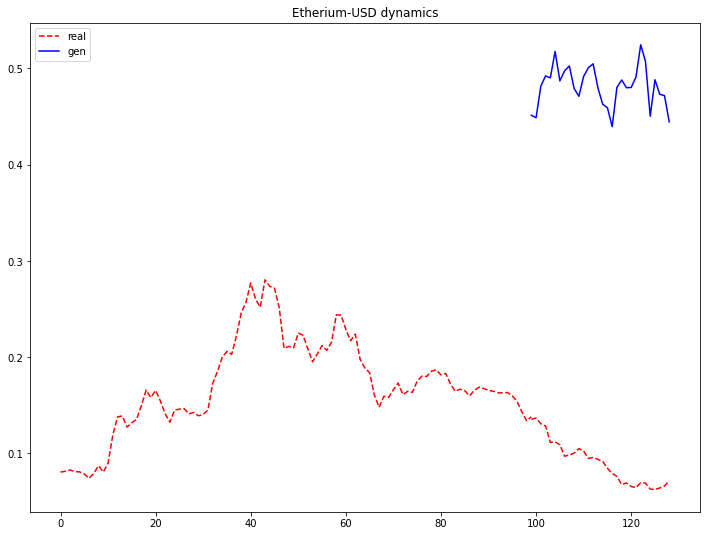

D_loss: 0.9070600867271423, G_loss: 66.78683471679688


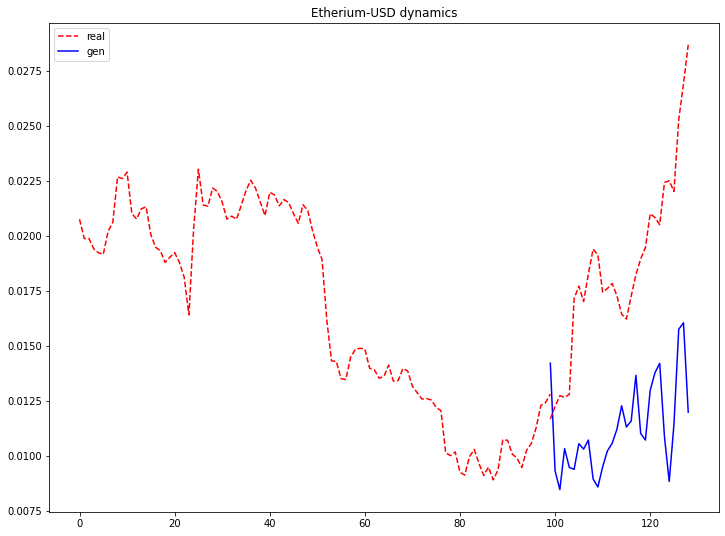

D_loss: 0.8131899237632751, G_loss: 8.091238975524902


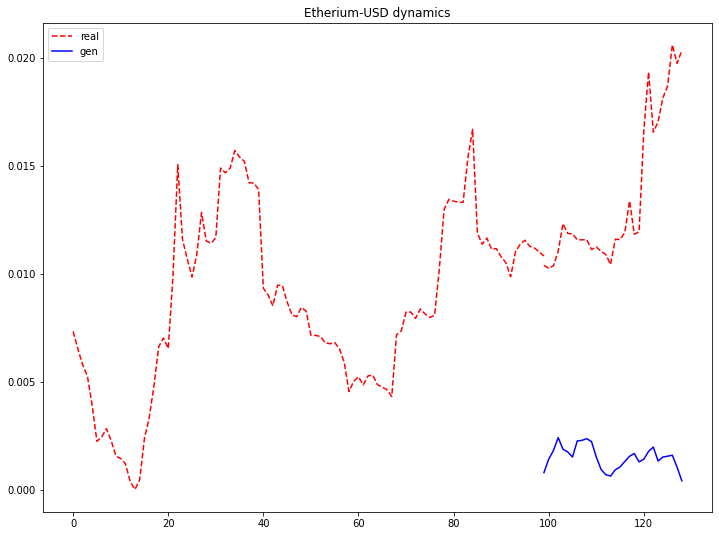

D_loss: 0.769839882850647, G_loss: 7.055774688720703


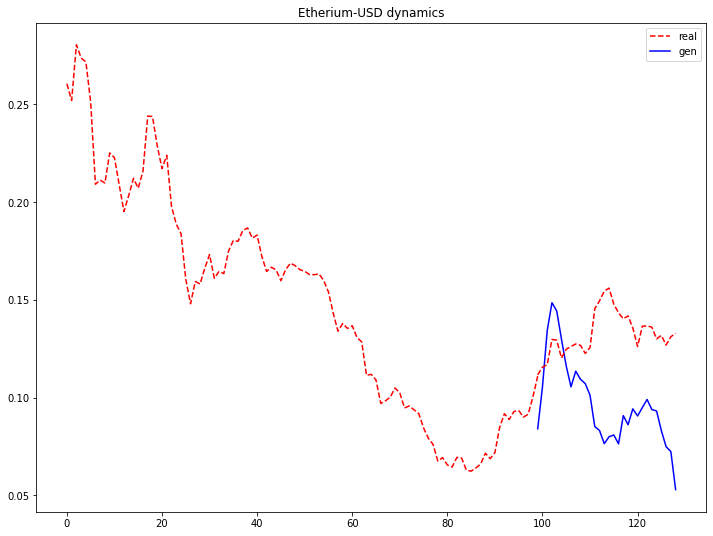

D_loss: 0.725014328956604, G_loss: 6.844865798950195


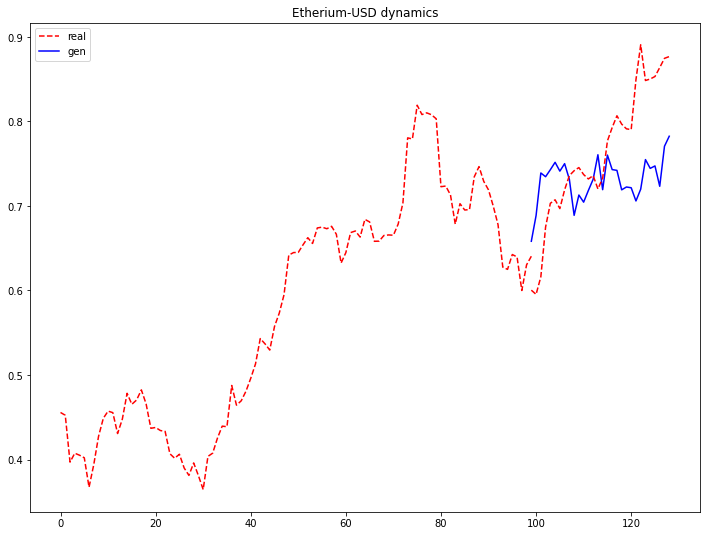

D_loss: 0.6963925957679749, G_loss: 6.837477207183838


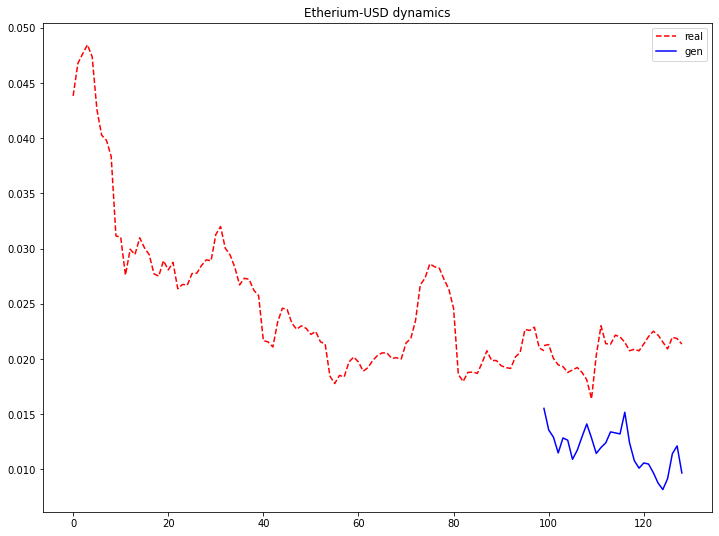

D_loss: 0.6749979257583618, G_loss: 6.864283084869385


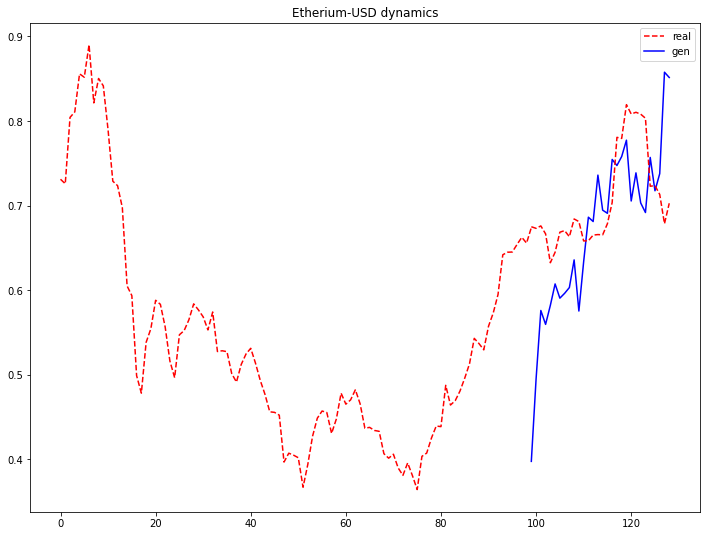

D_loss: 0.655572772026062, G_loss: 6.806032657623291


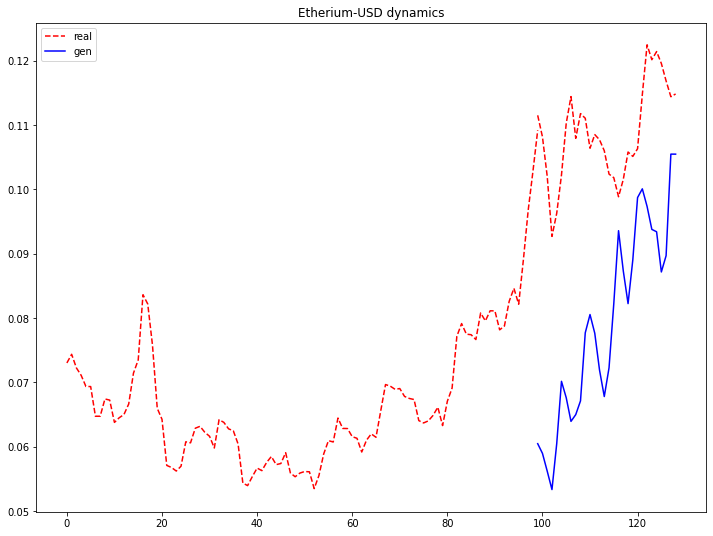

D_loss: 0.6433192491531372, G_loss: 6.6825175285339355


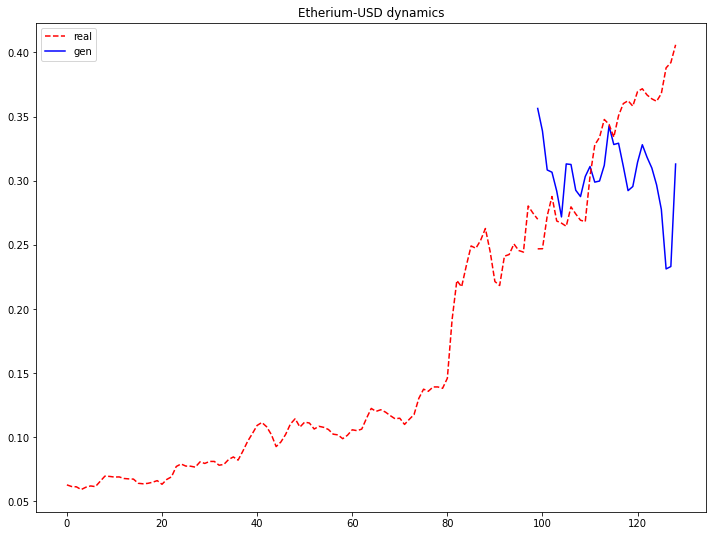

D_loss: 0.6323560476303101, G_loss: 6.585037708282471


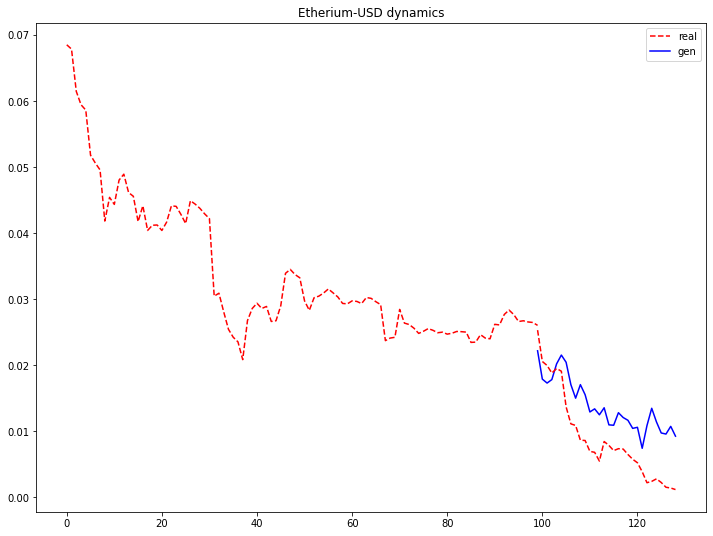

D_loss: 0.6228291392326355, G_loss: 6.472580909729004


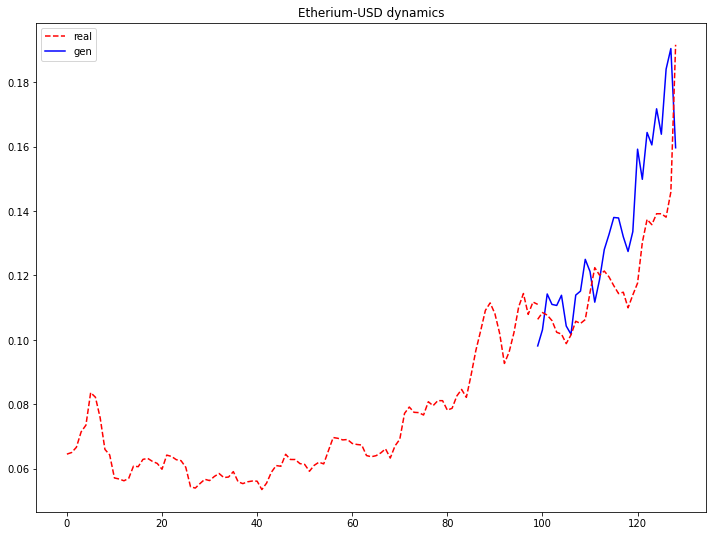

D_loss: 0.6138556599617004, G_loss: 6.376230716705322


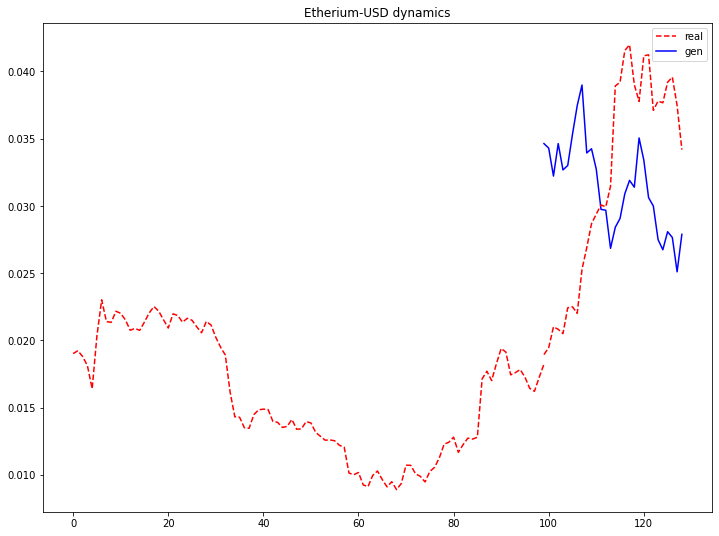

D_loss: 0.6068731546401978, G_loss: 6.285872936248779


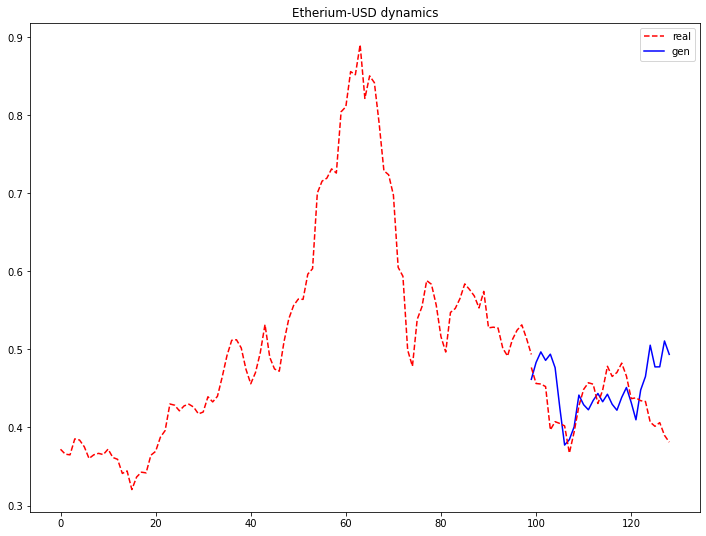

D_loss: 0.6012195944786072, G_loss: 6.189505577087402


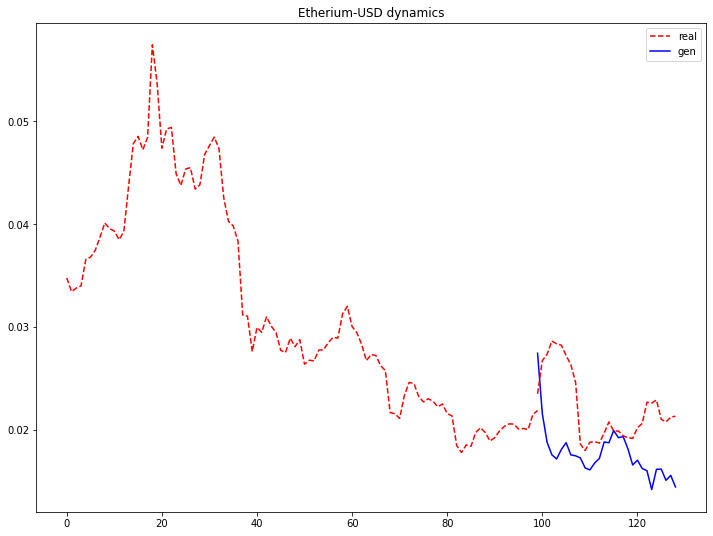

D_loss: 0.596407413482666, G_loss: 6.1376848220825195


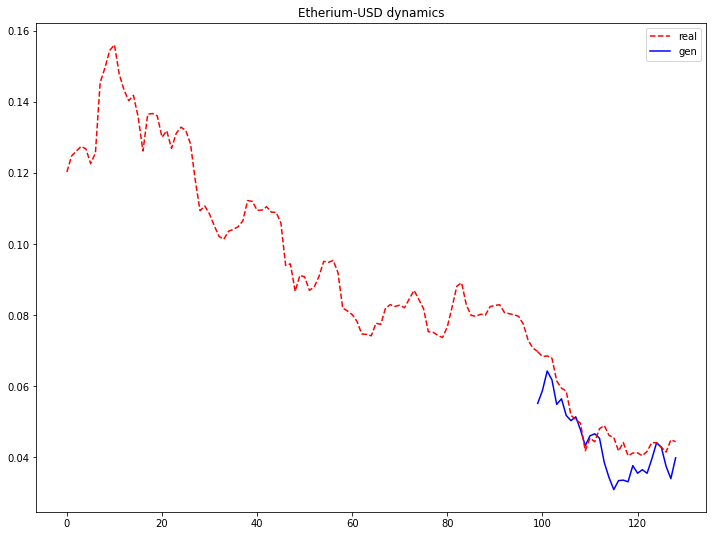

D_loss: 0.5932328701019287, G_loss: 6.07138729095459


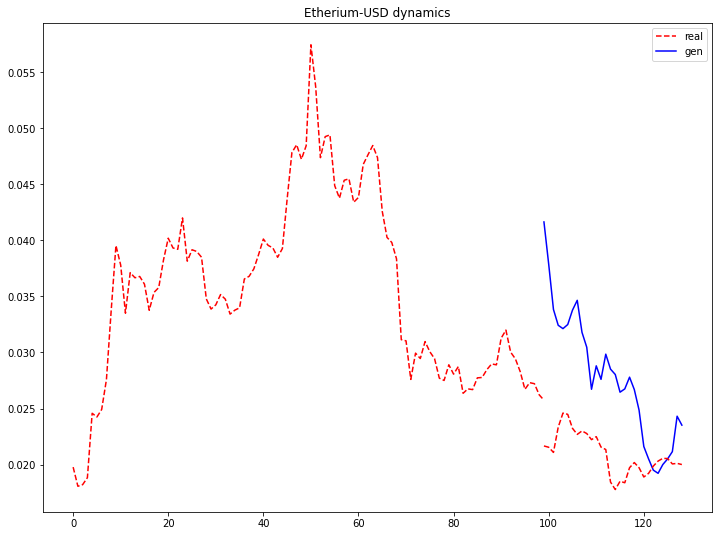

D_loss: 0.5908655524253845, G_loss: 6.00442361831665


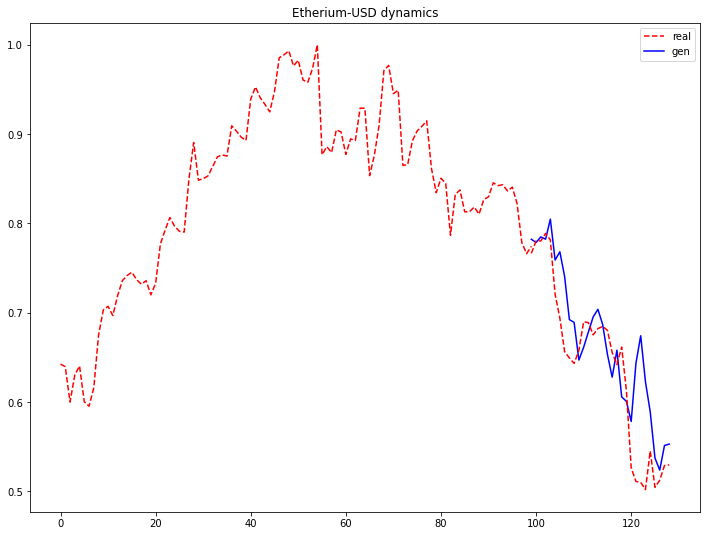

D_loss: 0.5865904688835144, G_loss: 5.956910610198975


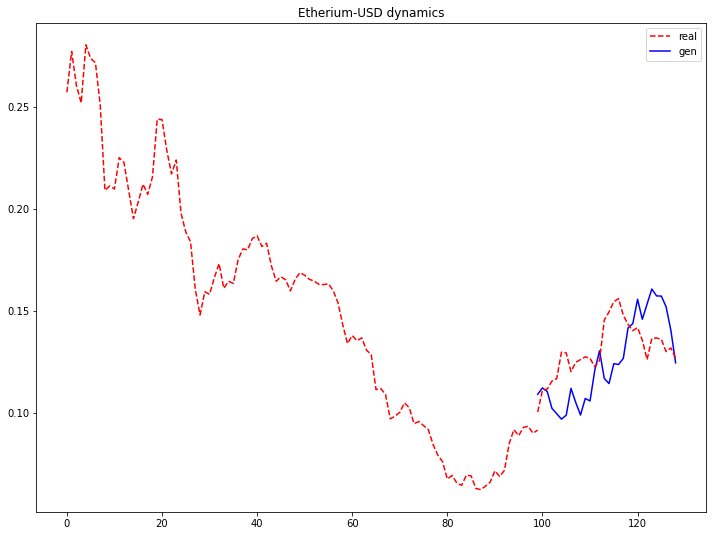

D_loss: 0.5847400426864624, G_loss: 5.912349700927734


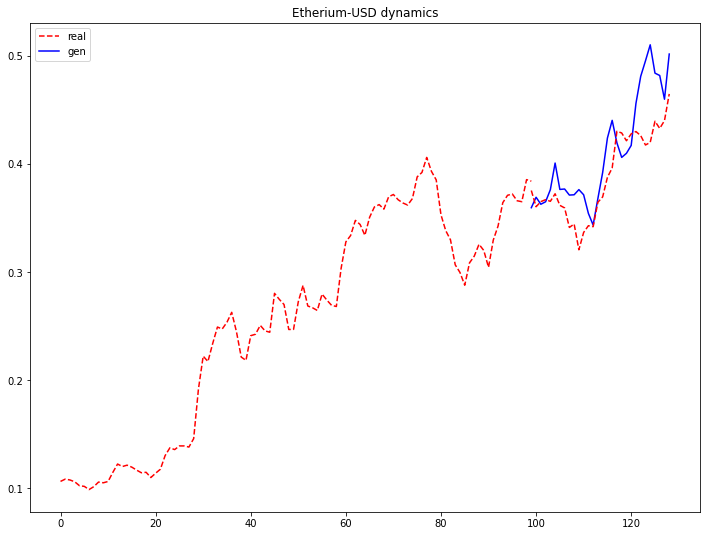

D_loss: 0.5830301642417908, G_loss: 5.86363410949707


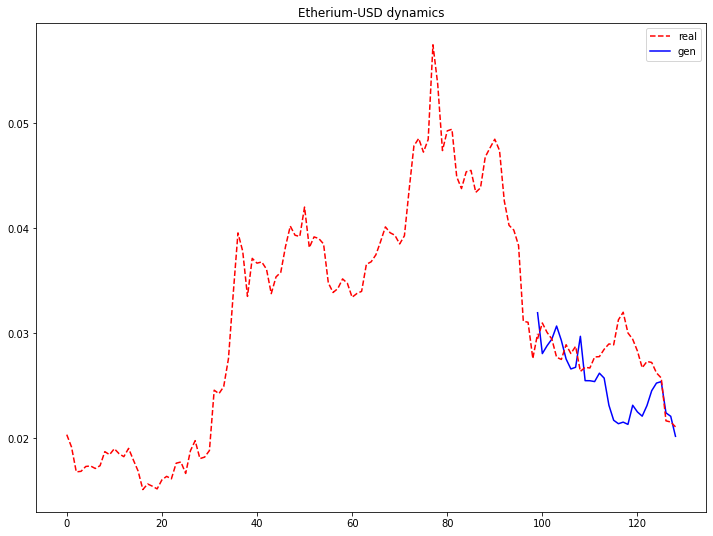

D_loss: 0.5820258855819702, G_loss: 5.820656776428223


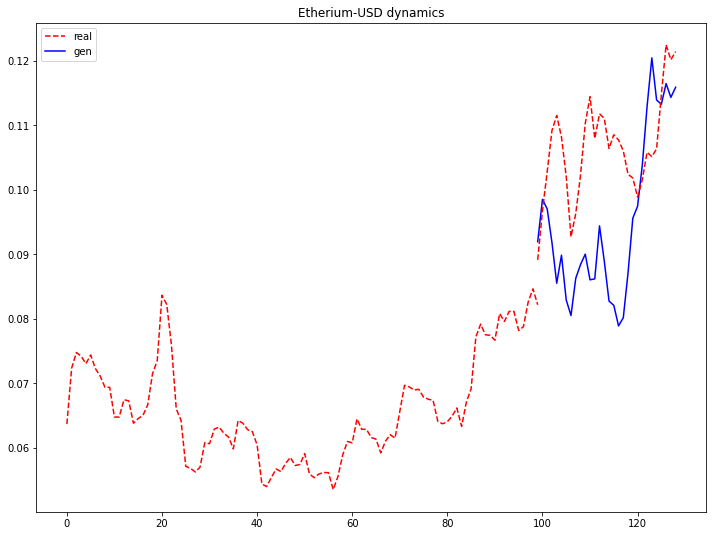

D_loss: 0.5791902542114258, G_loss: 5.798112392425537


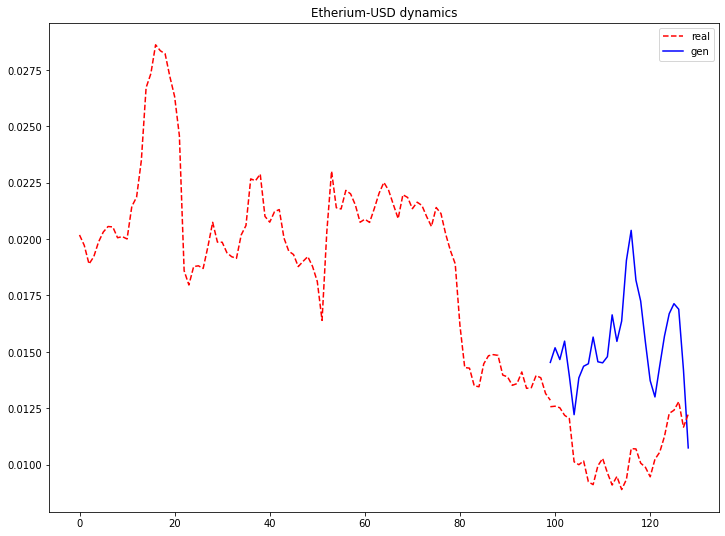

D_loss: 0.5771132111549377, G_loss: 5.762087345123291


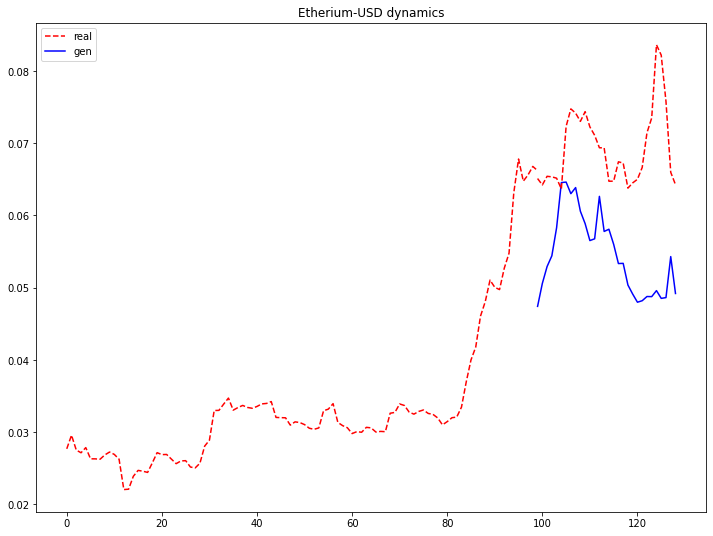

D_loss: 0.5745314955711365, G_loss: 5.738195896148682


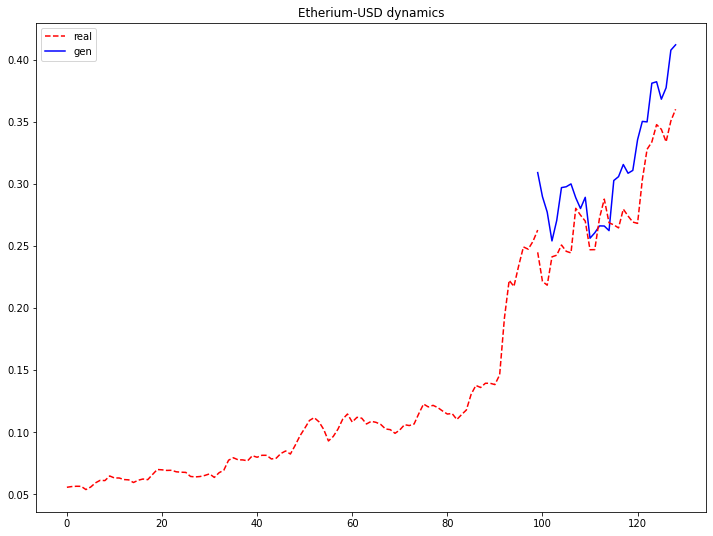

D_loss: 0.5718202590942383, G_loss: 5.716686725616455


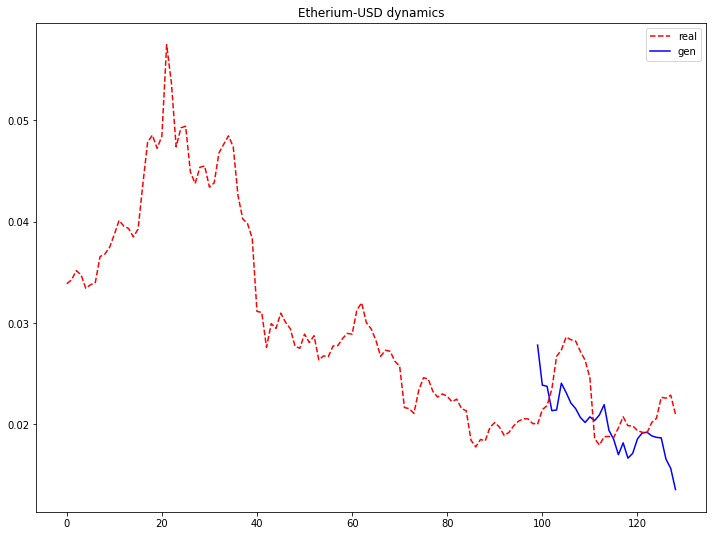

D_loss: 0.5693641304969788, G_loss: 5.699714660644531


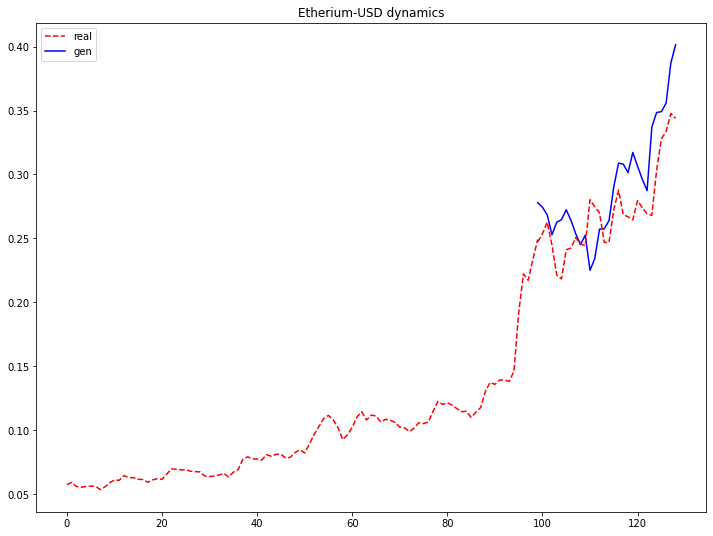

D_loss: 0.5665223598480225, G_loss: 5.685759544372559


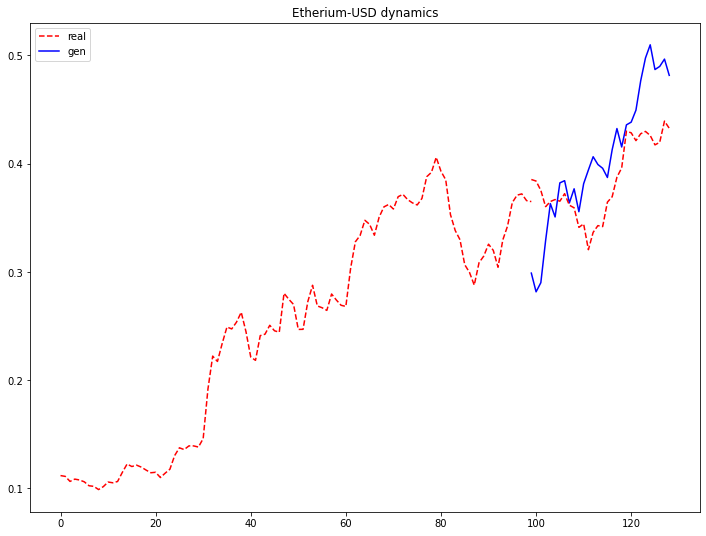

D_loss: 0.563684344291687, G_loss: 5.670693397521973


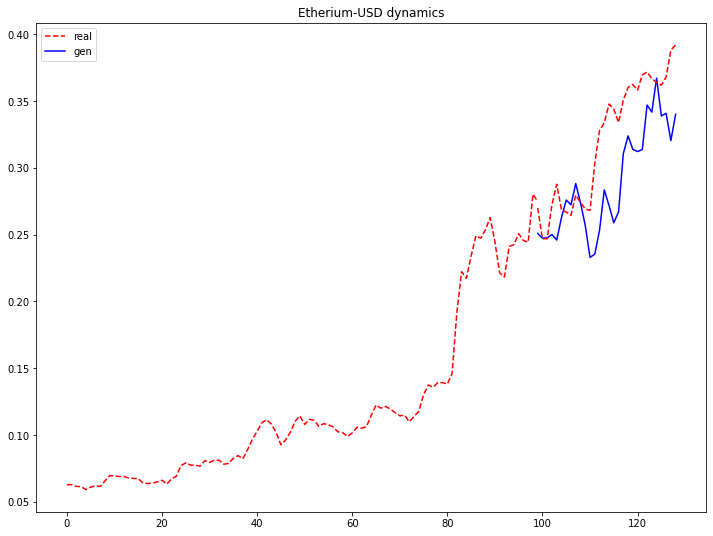

D_loss: 0.5616418719291687, G_loss: 5.6493239402771


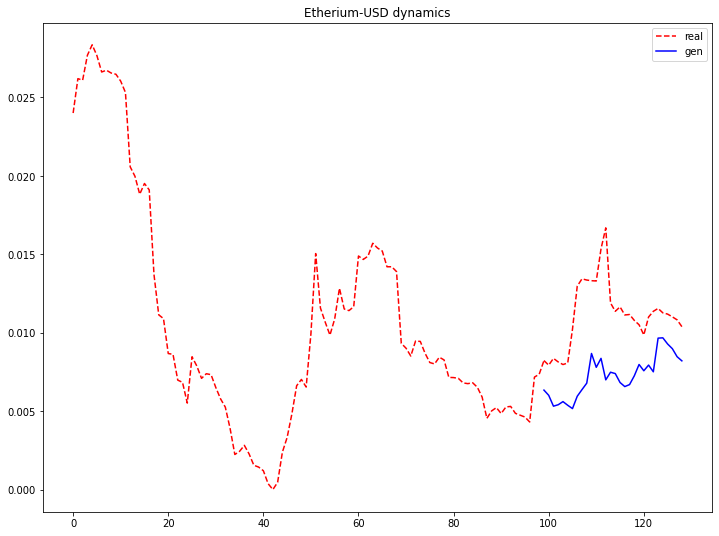

D_loss: 0.5593385100364685, G_loss: 5.633167743682861


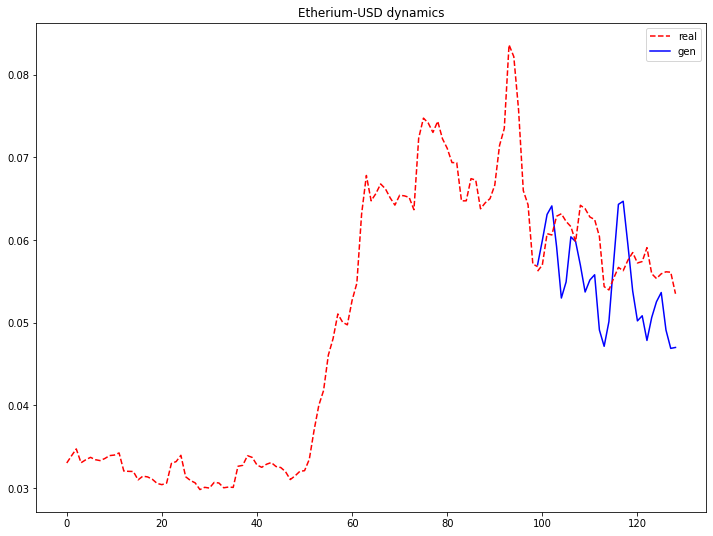

D_loss: 0.5567131638526917, G_loss: 5.624734401702881


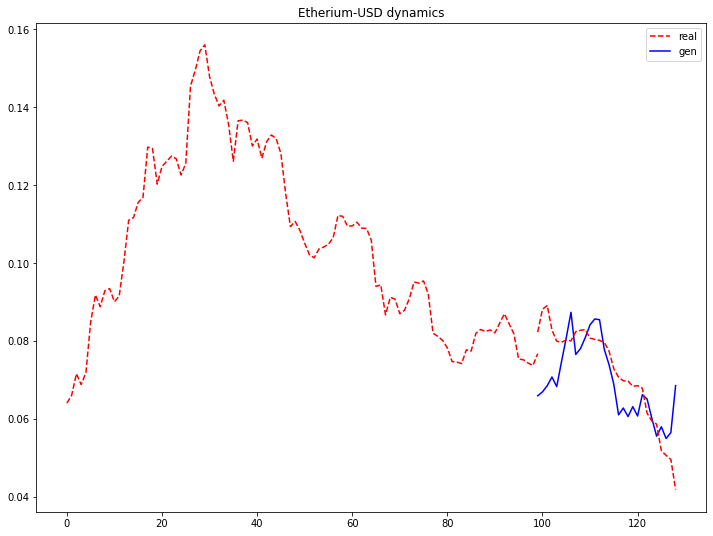

D_loss: 0.5543192625045776, G_loss: 5.615581512451172


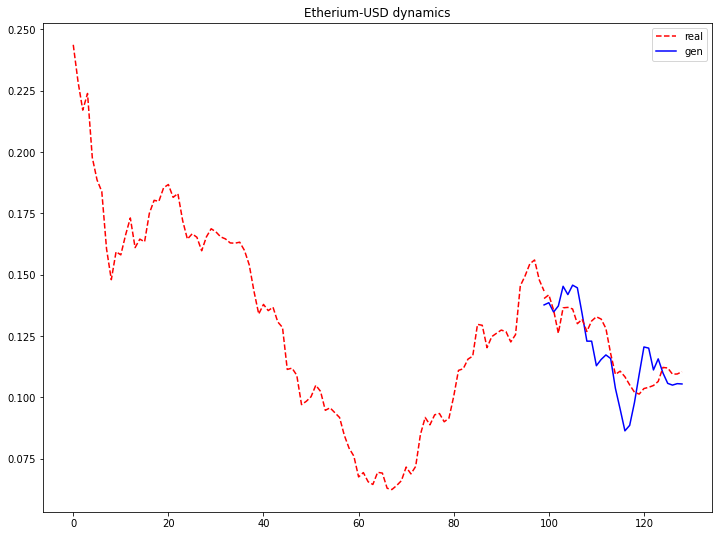

D_loss: 0.5521602034568787, G_loss: 5.605038642883301


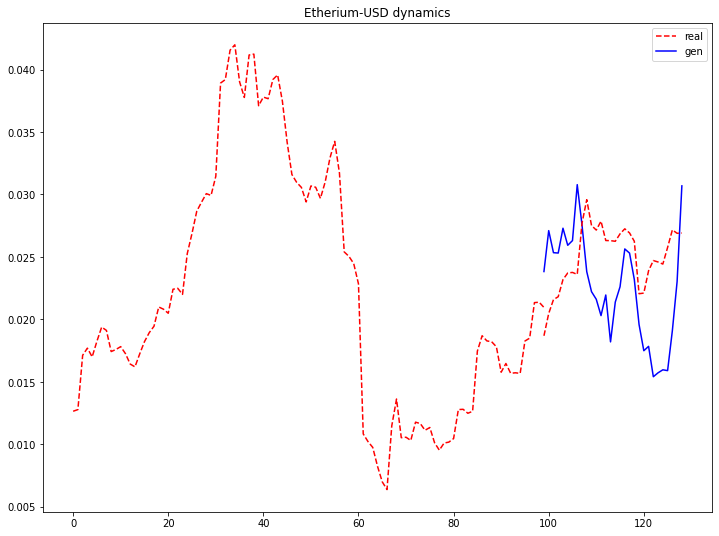

D_loss: 0.5494524836540222, G_loss: 5.60055685043335


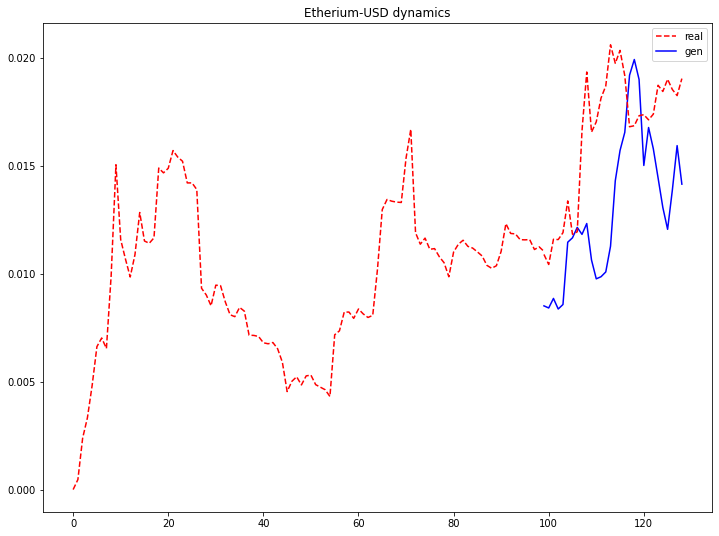

D_loss: 0.5467971563339233, G_loss: 5.596188545227051


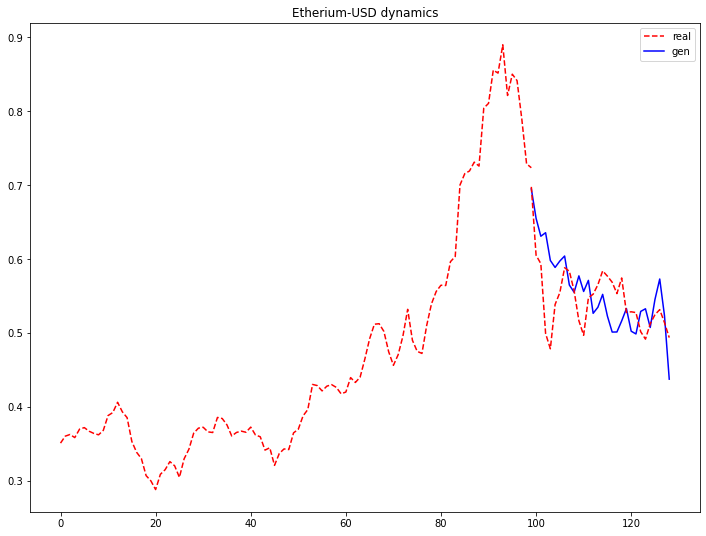

D_loss: 0.5446962714195251, G_loss: 5.581841468811035


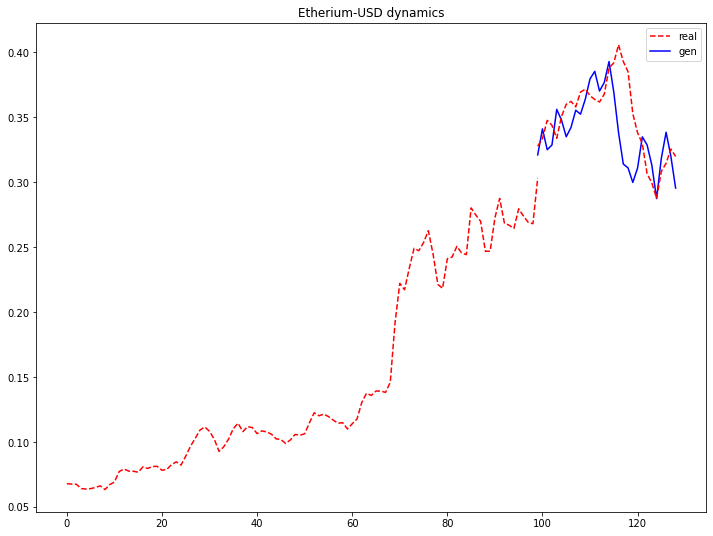

D_loss: 0.5425515174865723, G_loss: 5.5680036544799805


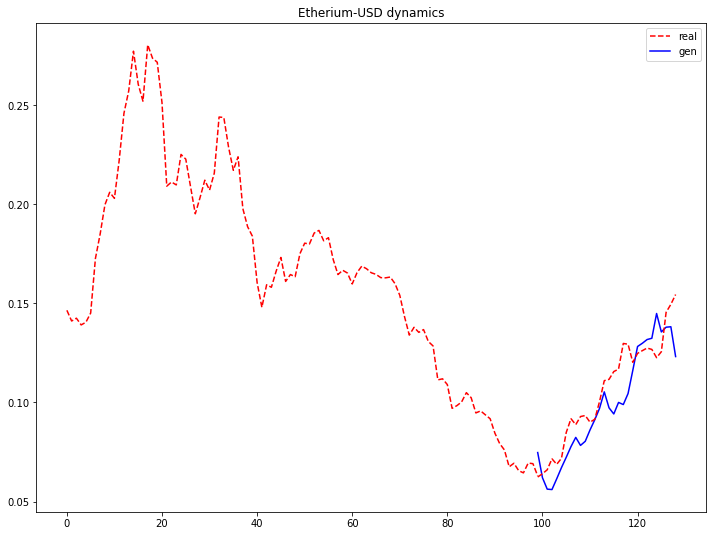

D_loss: 0.5404558181762695, G_loss: 5.557528495788574


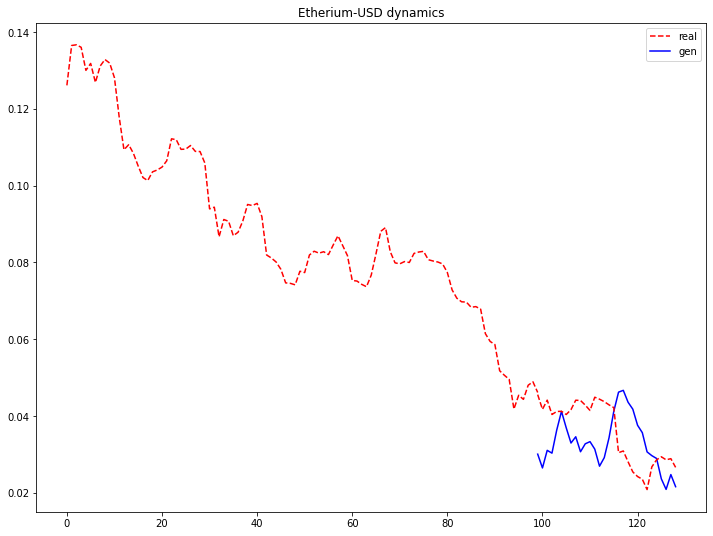

D_loss: 0.5387909412384033, G_loss: 5.543618202209473


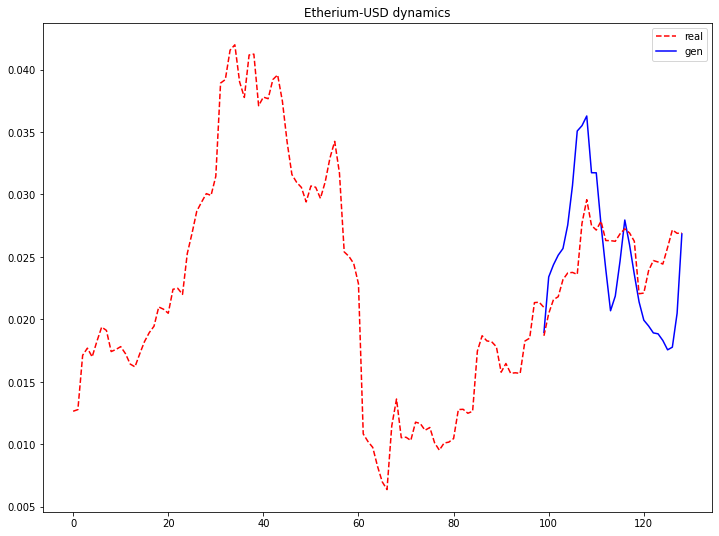

D_loss: 0.5372015833854675, G_loss: 5.533153533935547


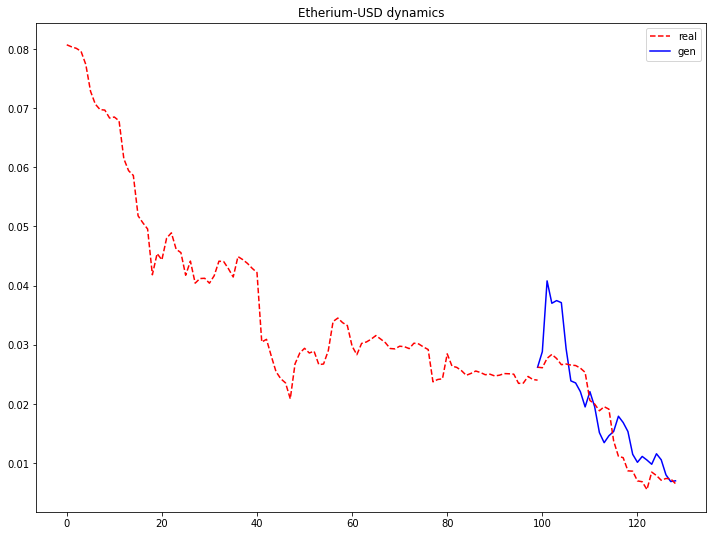

D_loss: 0.5353003740310669, G_loss: 5.532954692840576


In [ ]:
gen_w4d_meta, disc_w4d_meta = train_mlp(dataloader4d, wgan=False, draw_graphs=1, num_series=4, meta_flag=1)
torch.save(gen_w4d_meta.state_dict(), PATH + "gen_w4d_meta")
torch.save(disc_w4d_meta.state_dict(), PATH + "disc_w4d_meta")

  0%|          | 0/1000 [00:00<?, ?it/s]

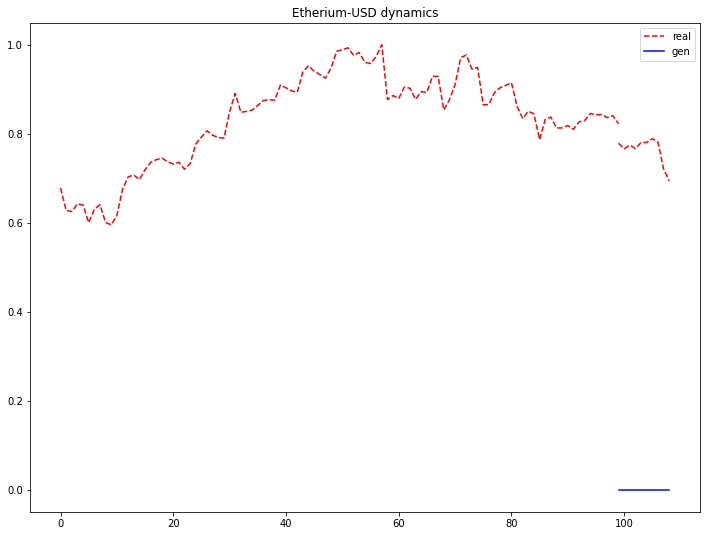

D_loss: 1.0631561279296875, G_loss: -0.3690527081489563


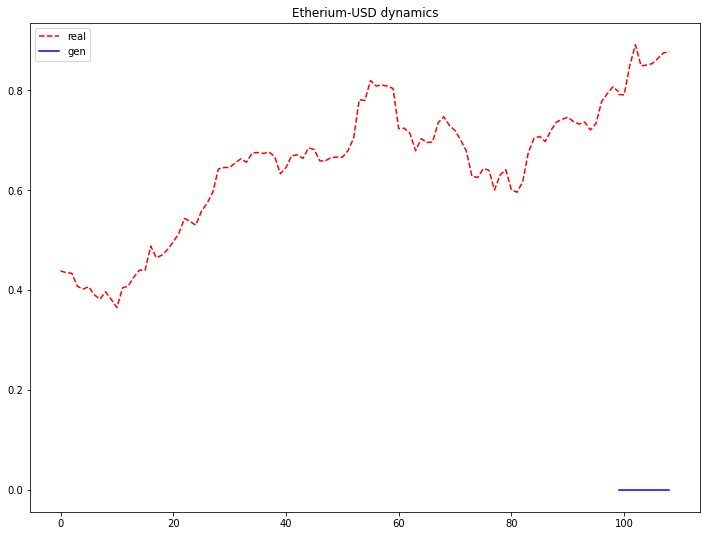

D_loss: 1.0024290084838867, G_loss: -0.9757328033447266


KeyboardInterrupt: ignored

In [ ]:
wgen_w4d_clean, wdisc_w4d_clean = train_mlp(dataloader4d, wgan=1, draw_graphs=1, num_series=4, meta_flag=0)
torch.save(wgen_w4d_clean.state_dict(), PATH + "wgen_w4d_clean")
torch.save(wdisc_w4d_clean.state_dict(), PATH + "wdisc_w4d_clean")

  0%|          | 0/1000 [00:00<?, ?it/s]

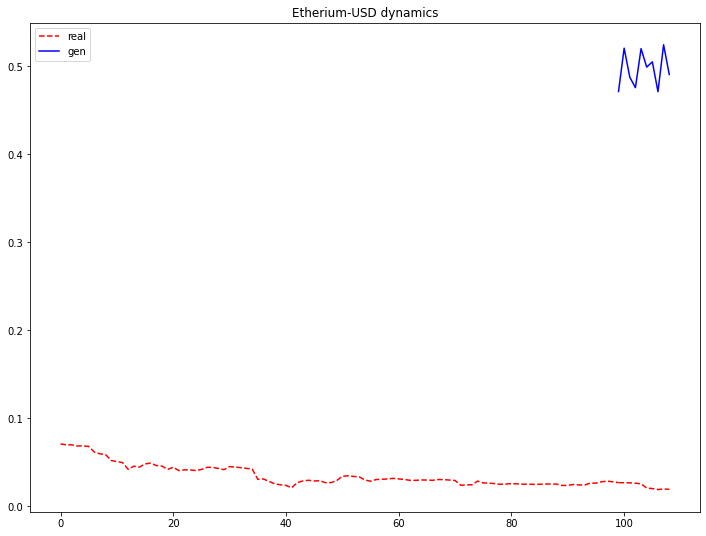

D_loss: 0.9785095453262329, G_loss: 118.90091705322266


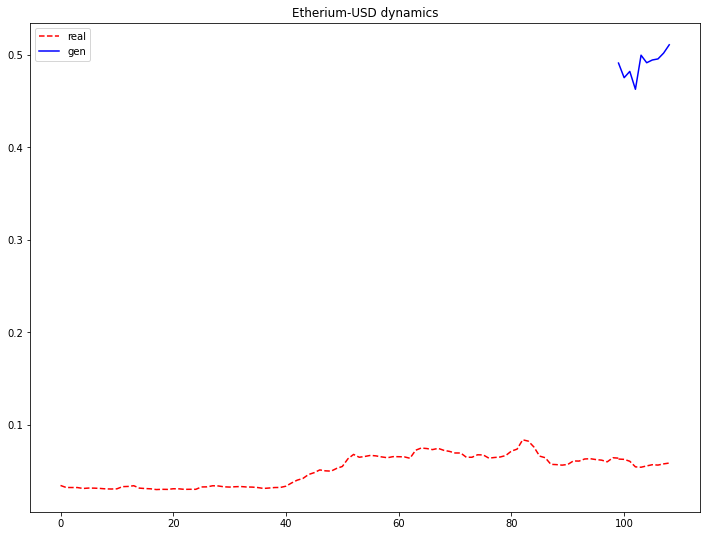

D_loss: 0.9991734623908997, G_loss: 9.407695770263672


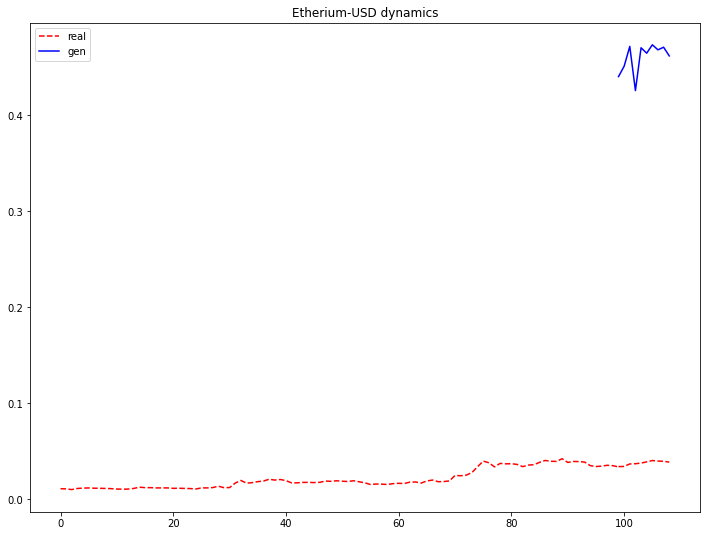

D_loss: 0.998616099357605, G_loss: 5.928139686584473


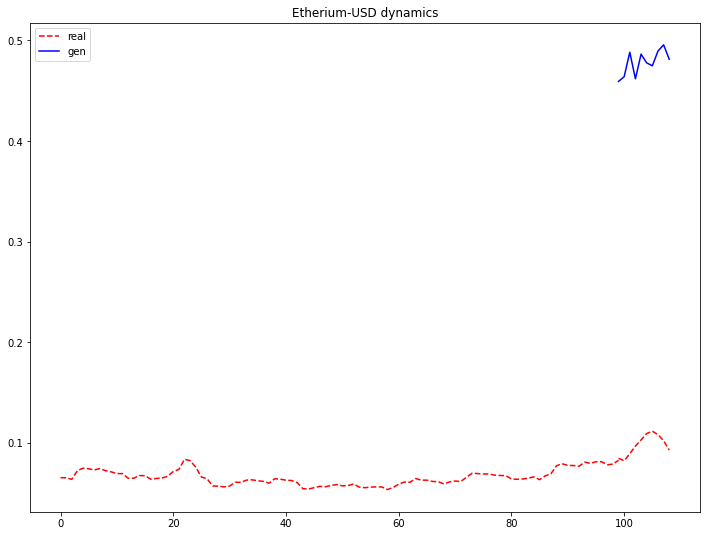

D_loss: 0.9985352158546448, G_loss: 4.845566749572754


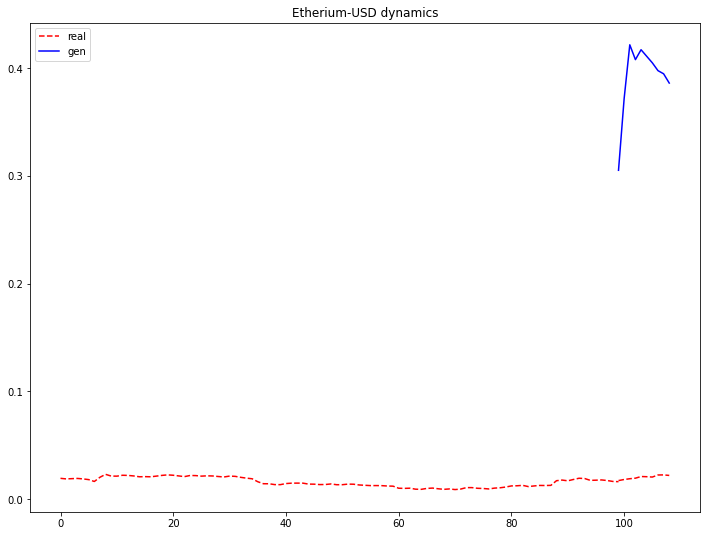

D_loss: 0.9988978505134583, G_loss: 4.230302333831787


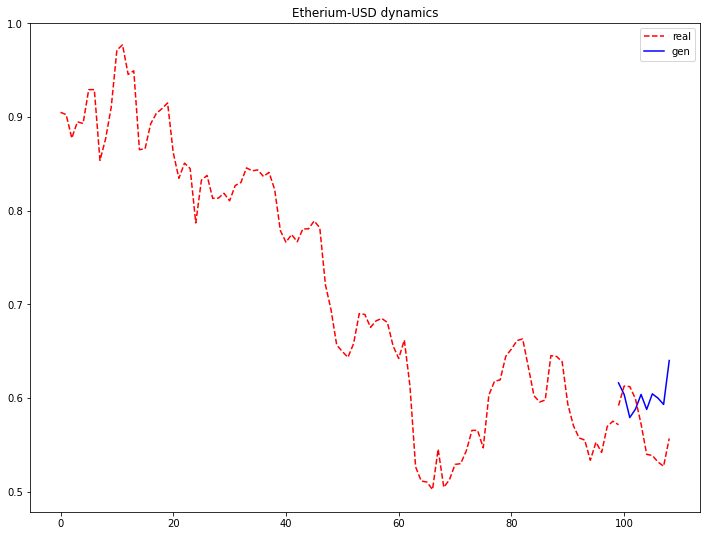

D_loss: 0.9991165399551392, G_loss: 3.7961084842681885


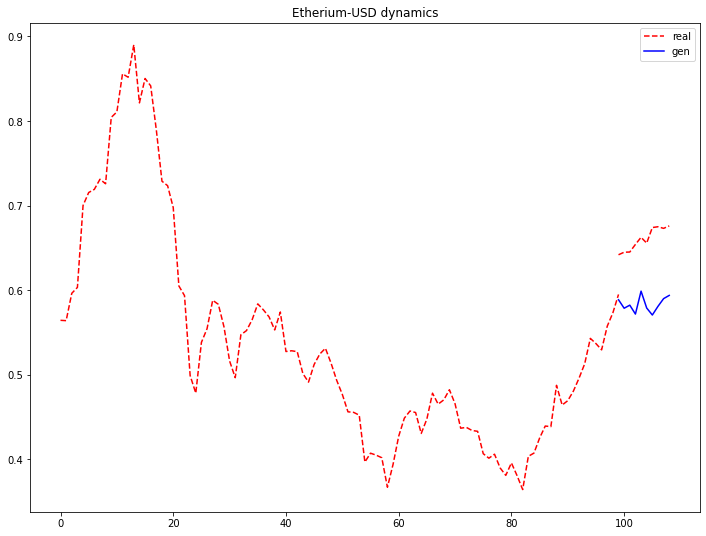

D_loss: 0.9992628693580627, G_loss: 3.5647737979888916


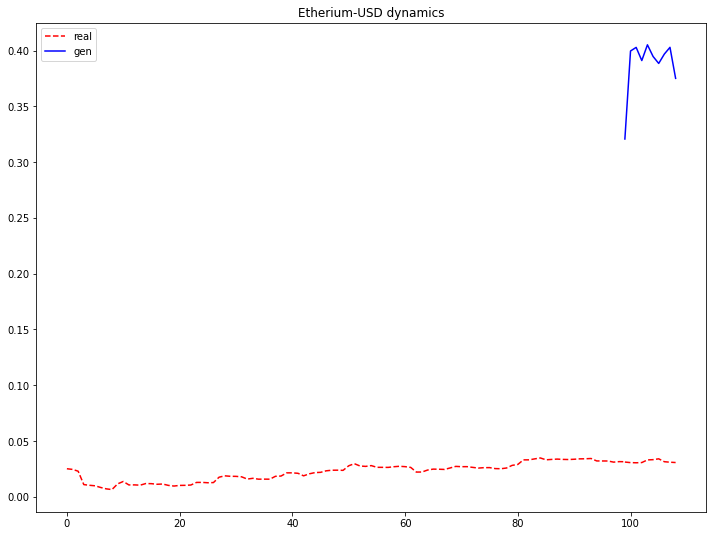

D_loss: 0.9993675947189331, G_loss: 3.450645685195923


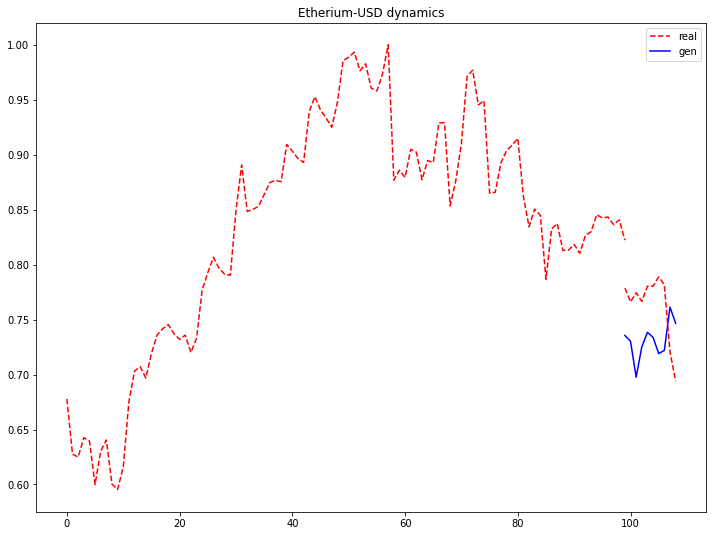

D_loss: 0.9994461536407471, G_loss: 3.465968370437622


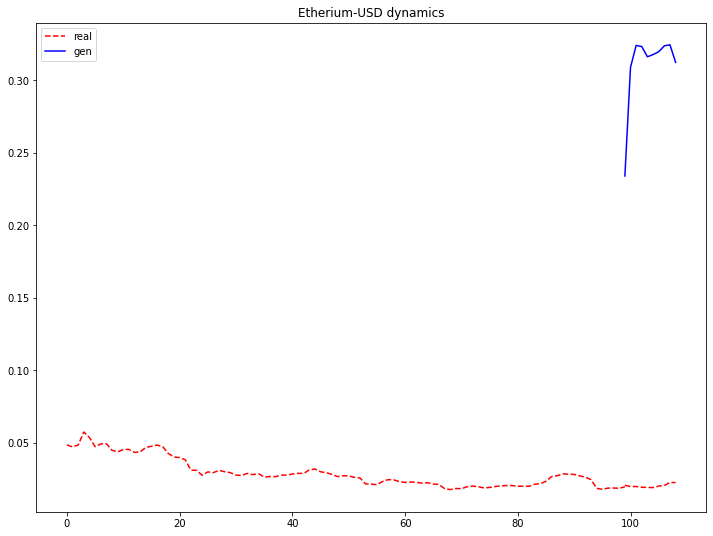

D_loss: 0.9995074272155762, G_loss: 3.323012351989746


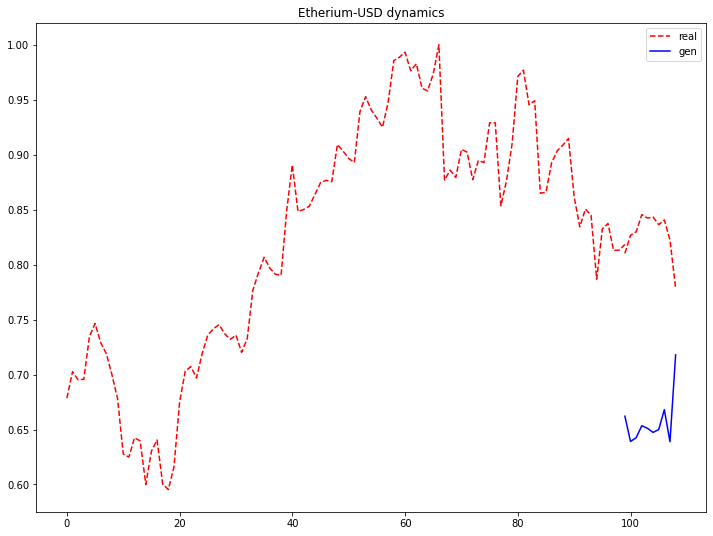

D_loss: 0.9995564818382263, G_loss: 3.214892864227295


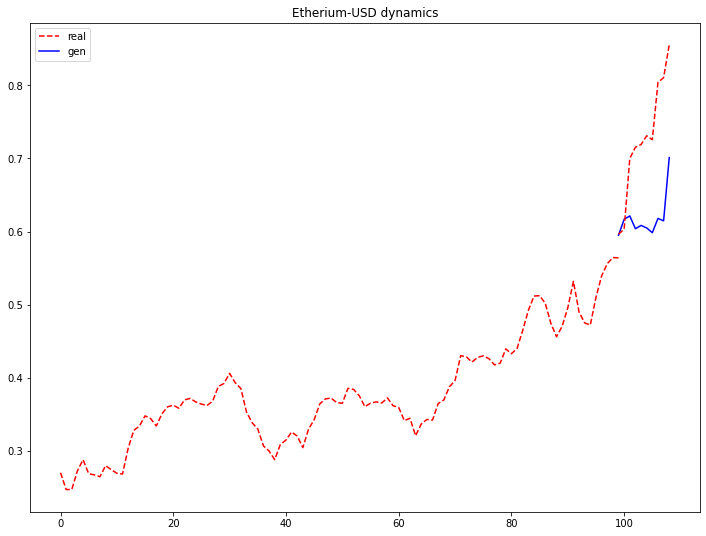

D_loss: 0.9995966553688049, G_loss: 3.098982095718384


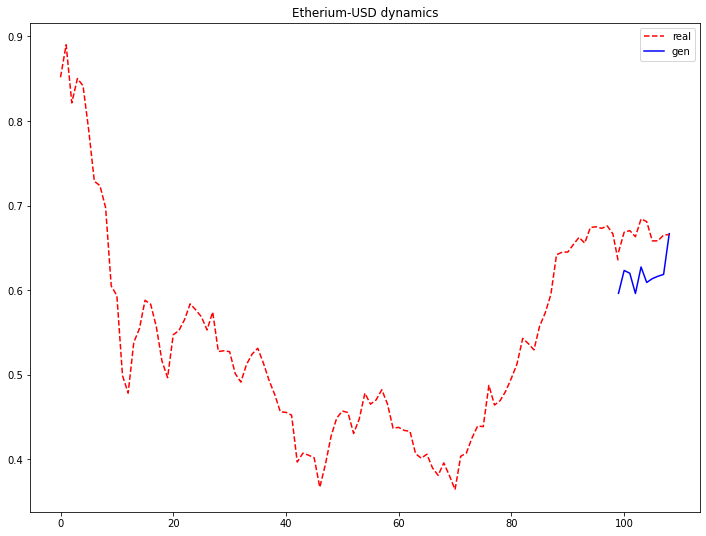

D_loss: 0.9996302127838135, G_loss: 3.066319704055786


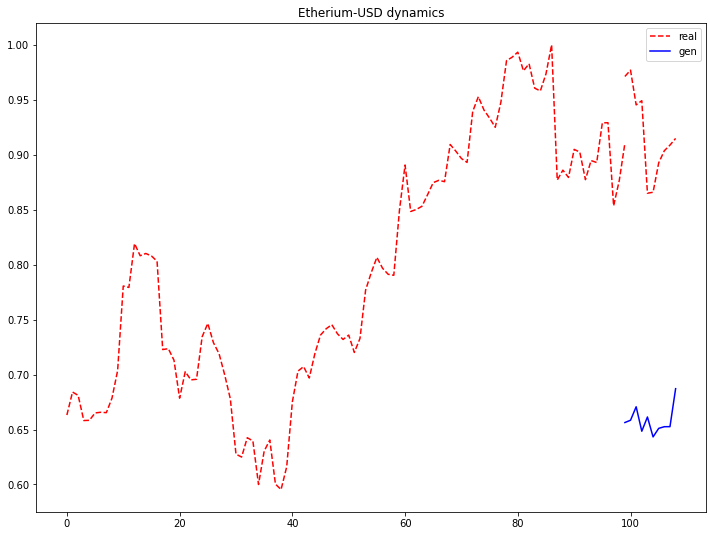

D_loss: 0.9996585845947266, G_loss: 3.0236029624938965


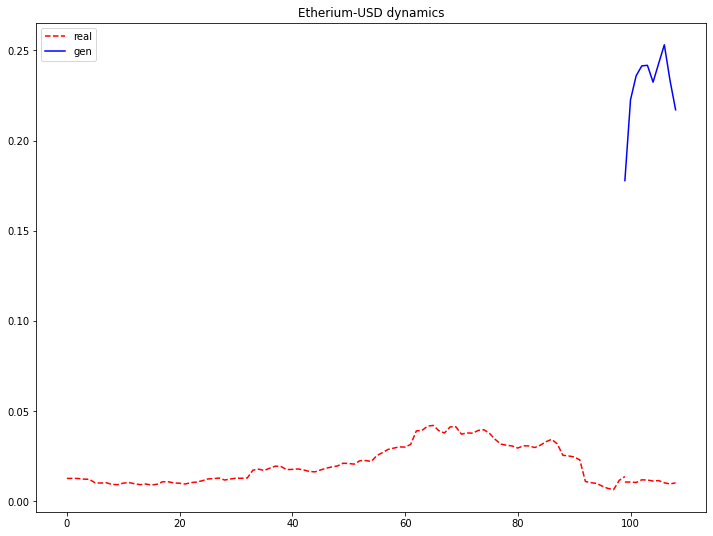

D_loss: 0.9996829032897949, G_loss: 2.947803258895874


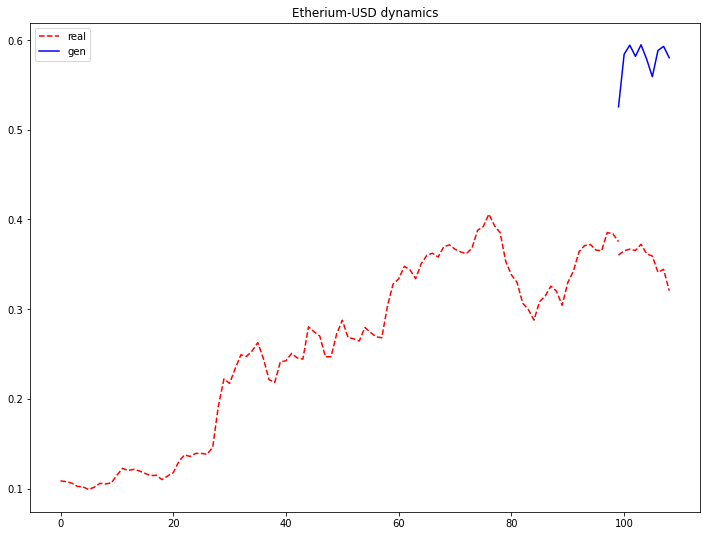

D_loss: 0.9996160864830017, G_loss: 3.0189151763916016


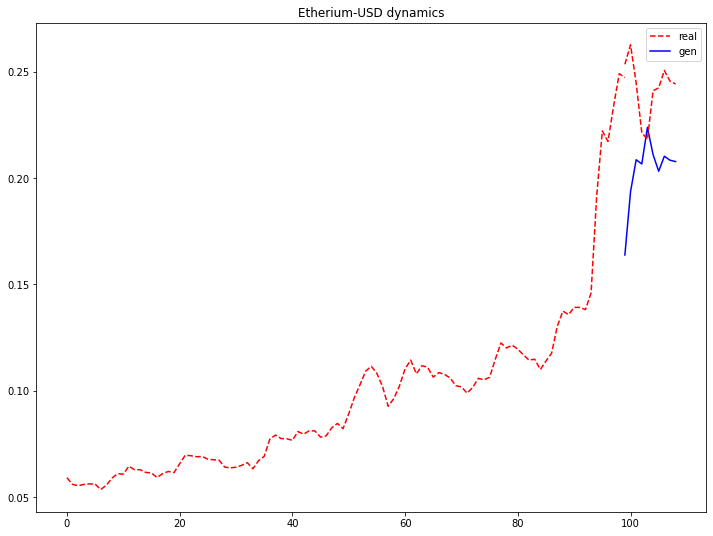

D_loss: 0.9996399879455566, G_loss: 3.049044609069824


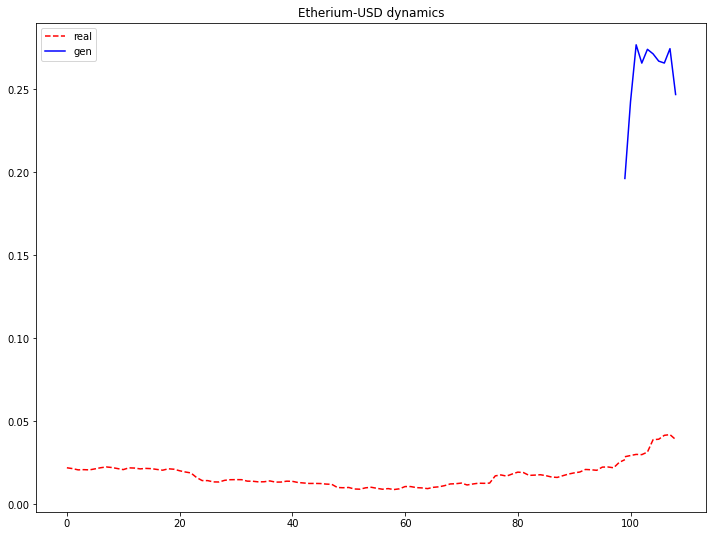

D_loss: 0.9996611475944519, G_loss: 3.0933284759521484


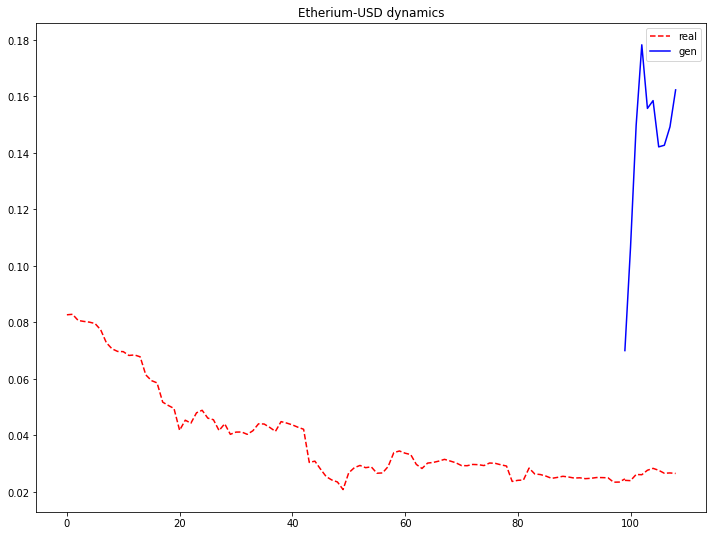

D_loss: 0.9996799230575562, G_loss: 3.1531927585601807


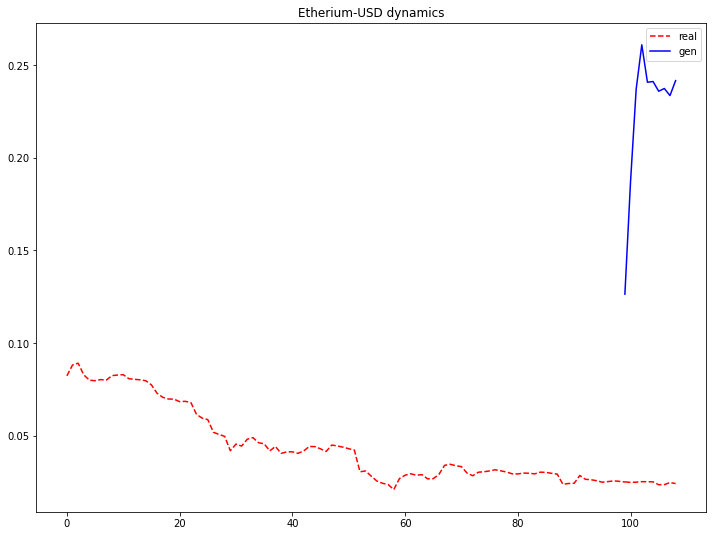

D_loss: 0.9996969103813171, G_loss: 3.2032816410064697


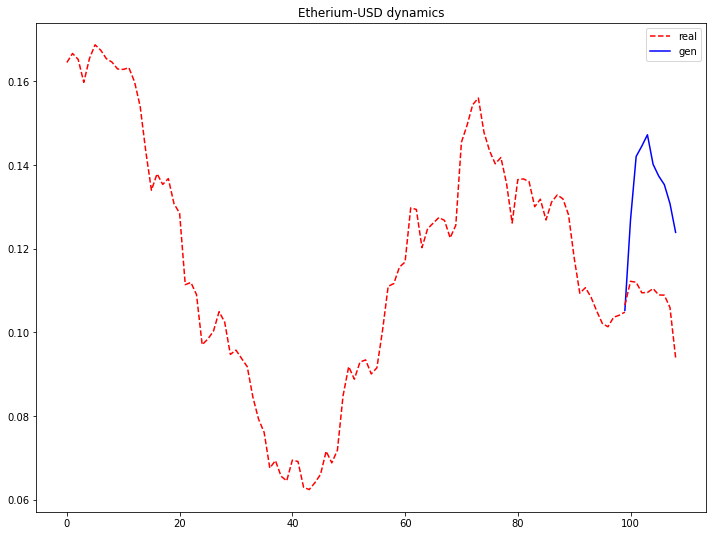

D_loss: 0.9997120499610901, G_loss: 3.225954055786133


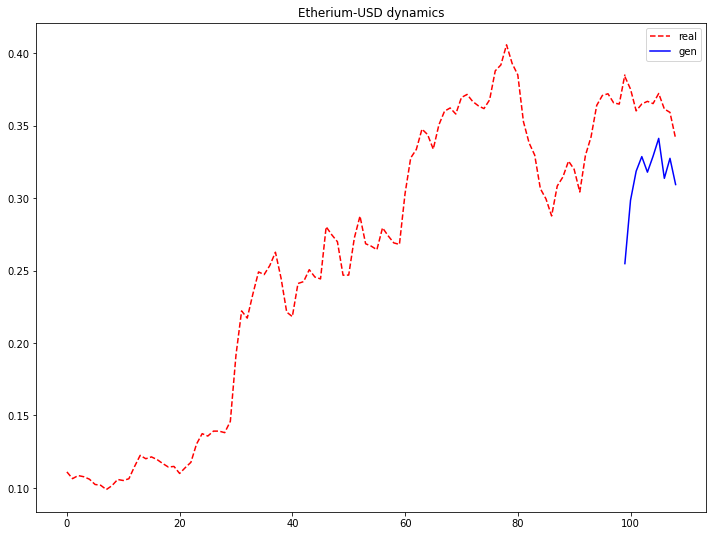

D_loss: 0.9997256994247437, G_loss: 3.2315452098846436


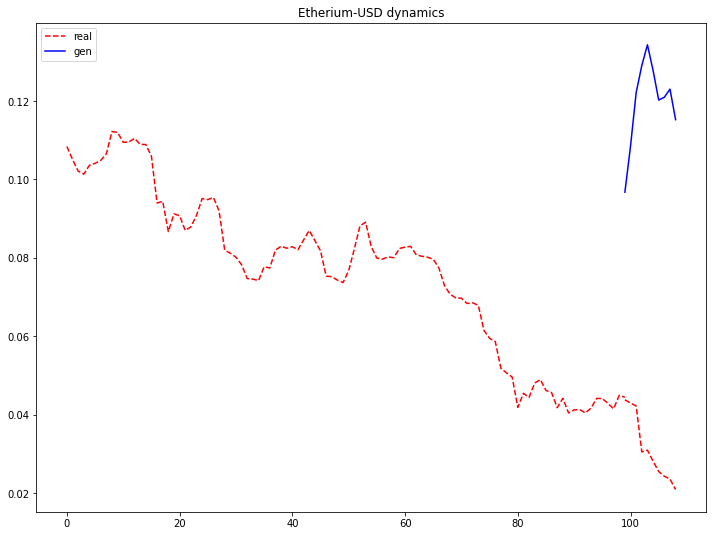

D_loss: 0.9997381567955017, G_loss: 3.237779378890991


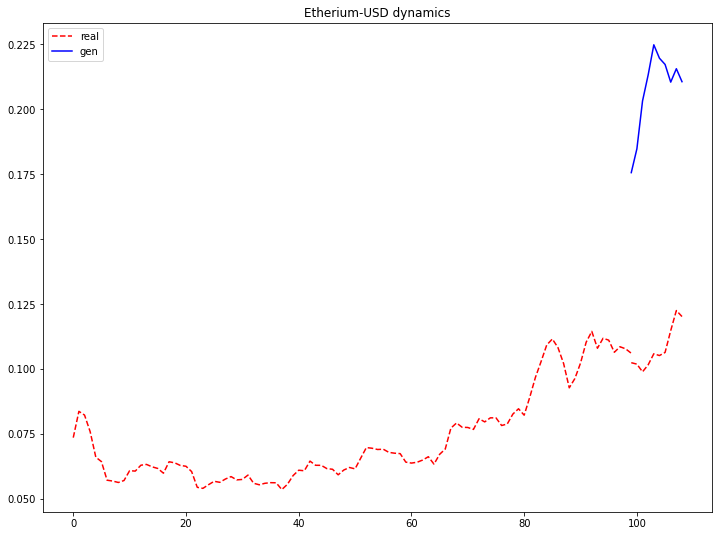

D_loss: 0.9997495412826538, G_loss: 3.242668390274048


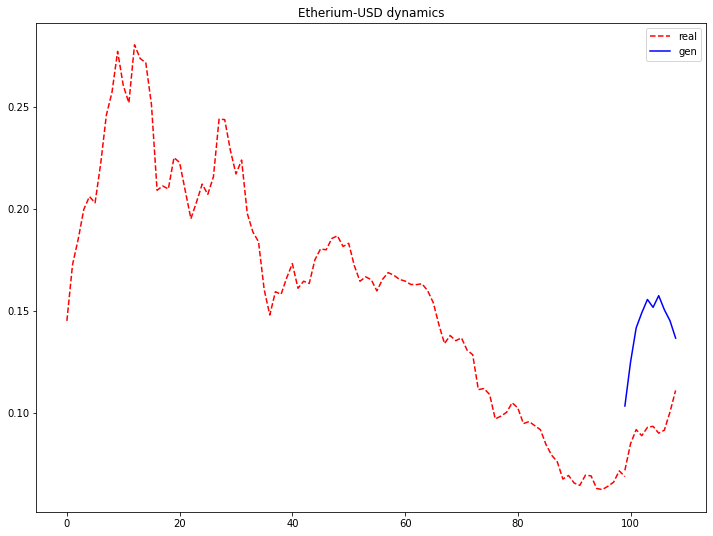

D_loss: 0.9997599124908447, G_loss: 3.238020658493042


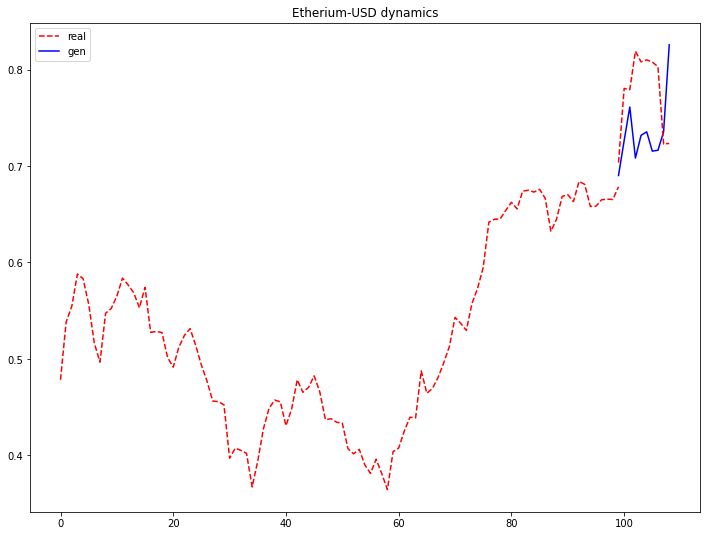

D_loss: 0.9997695088386536, G_loss: 3.230027198791504


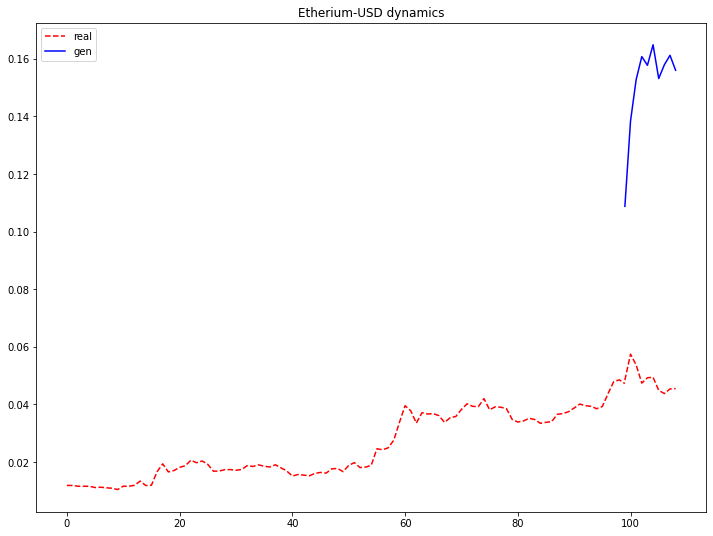

D_loss: 0.9997783899307251, G_loss: 3.219071865081787


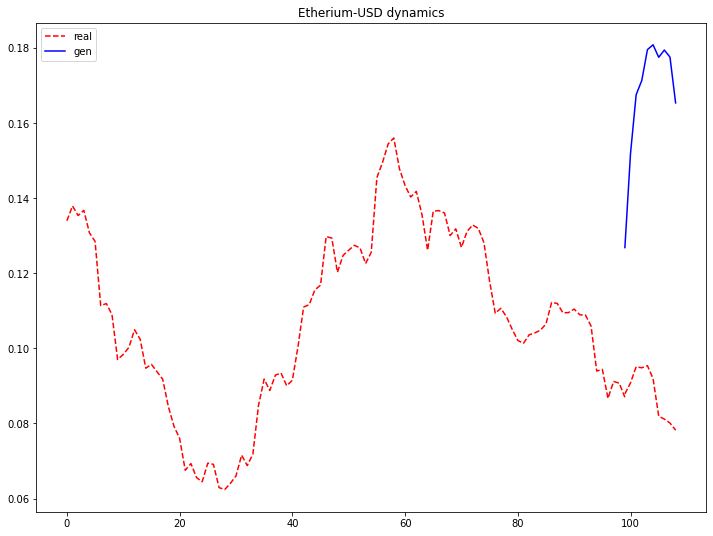

D_loss: 0.9997865557670593, G_loss: 3.2026500701904297


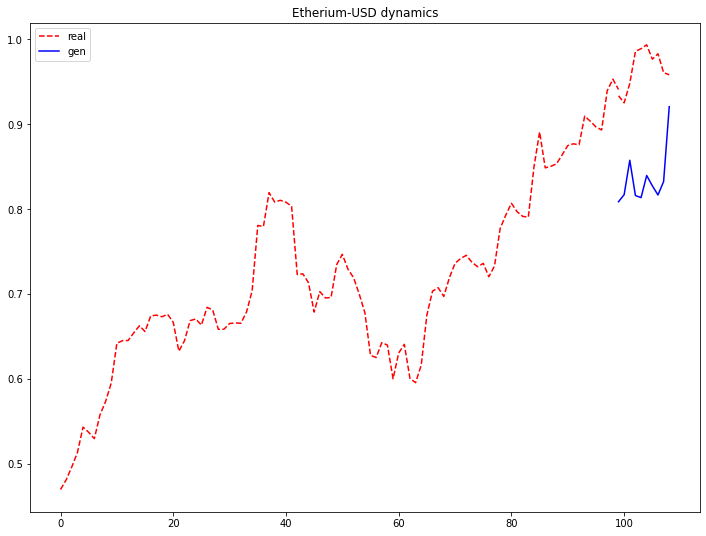

D_loss: 0.9997941851615906, G_loss: 3.1890151500701904


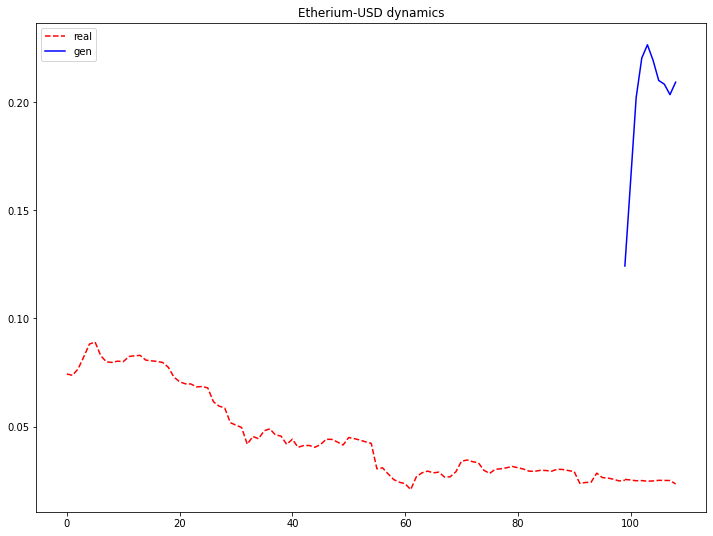

D_loss: 0.9998011589050293, G_loss: 3.186215400695801


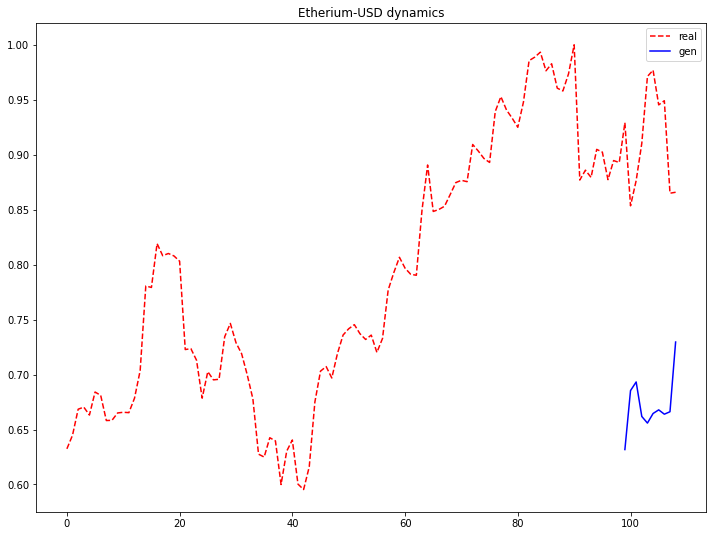

D_loss: 0.9998077750205994, G_loss: 3.169166088104248


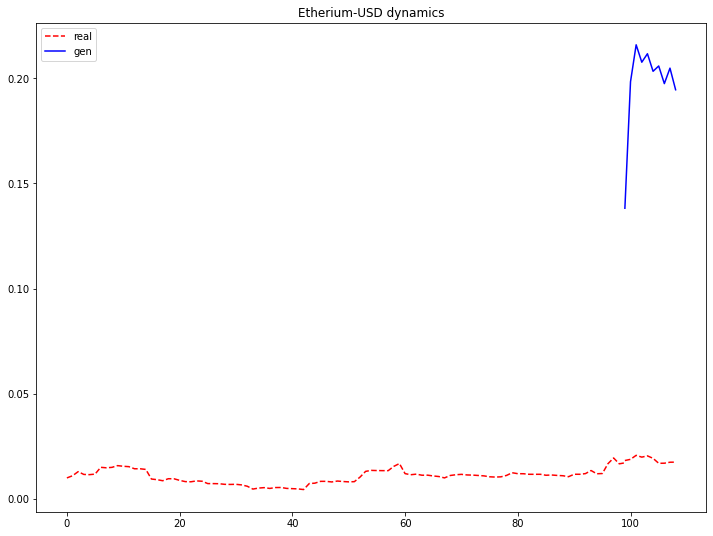

D_loss: 0.999813973903656, G_loss: 3.157205581665039


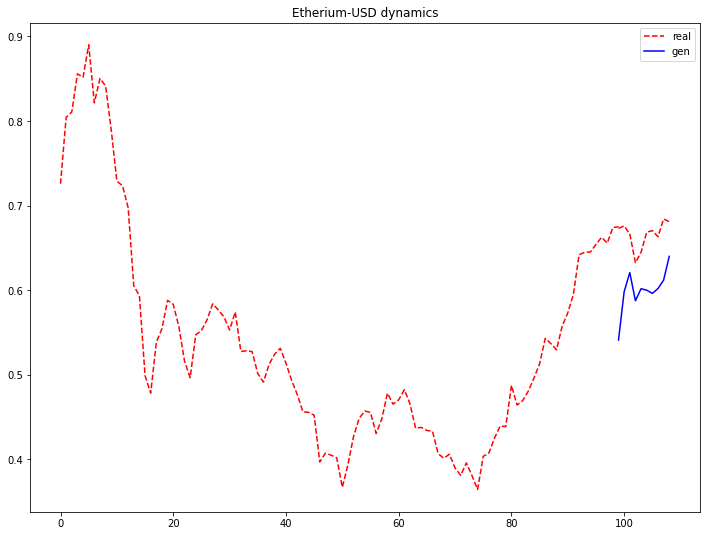

D_loss: 0.9998197555541992, G_loss: 3.141792058944702


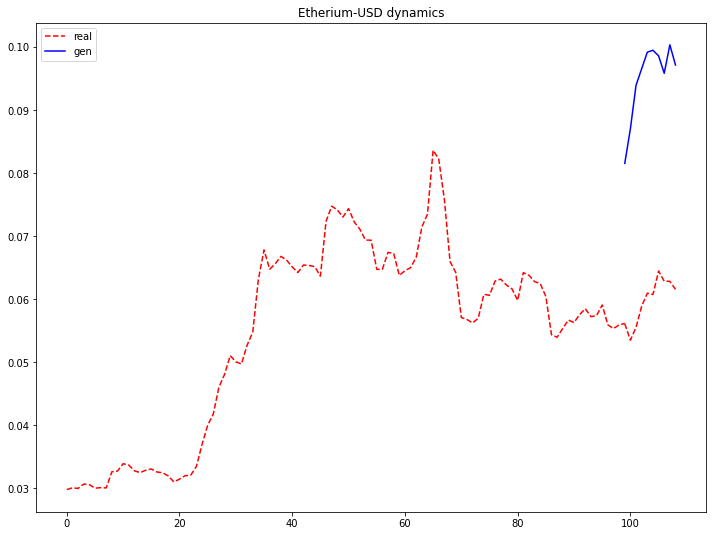

D_loss: 0.9998252391815186, G_loss: 3.1242921352386475


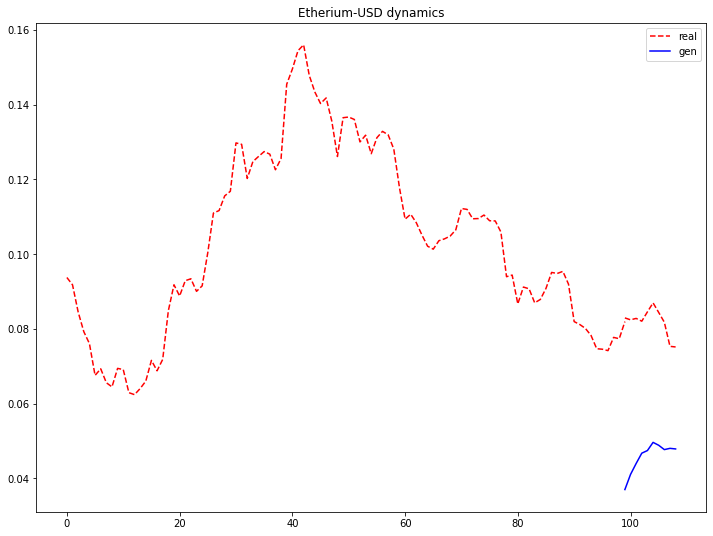

D_loss: 0.9998303651809692, G_loss: 3.110457420349121


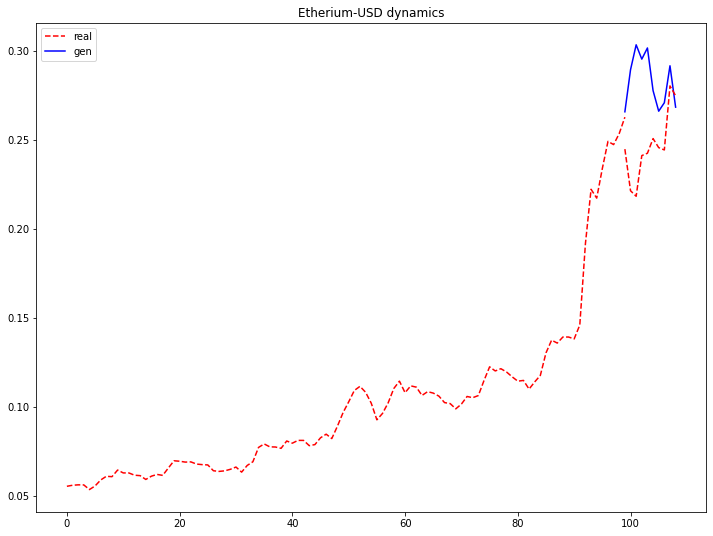

D_loss: 0.999835193157196, G_loss: 3.0942351818084717


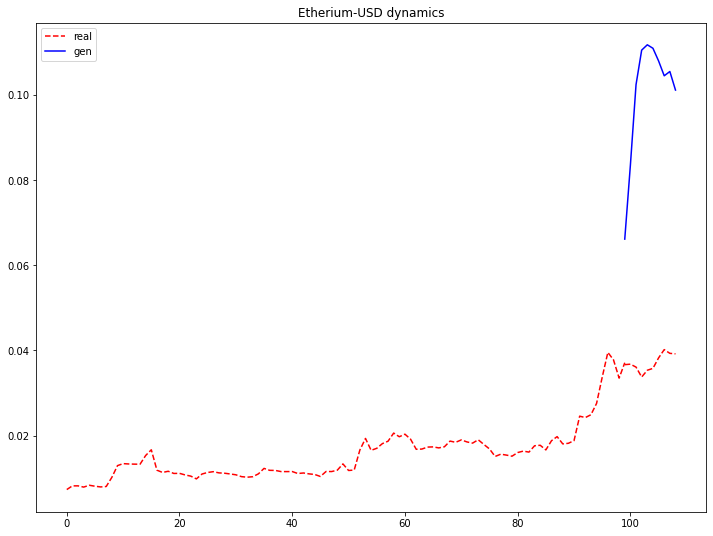

D_loss: 0.9998397827148438, G_loss: 3.0787277221679688


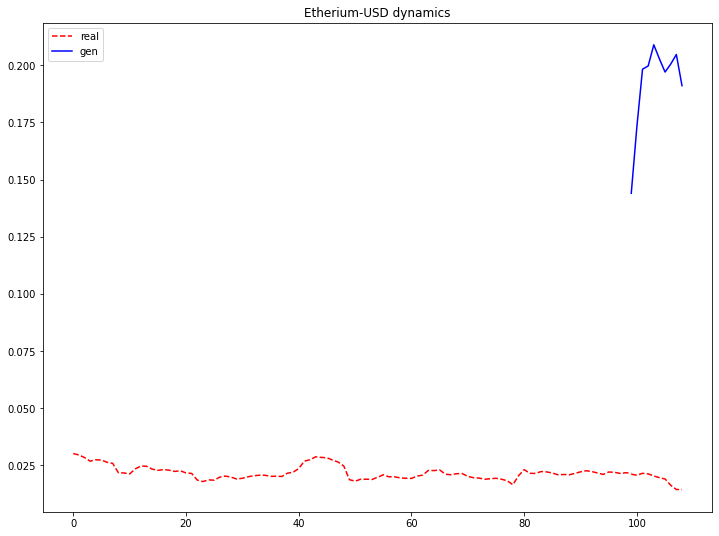

D_loss: 0.9998440742492676, G_loss: 3.0618903636932373


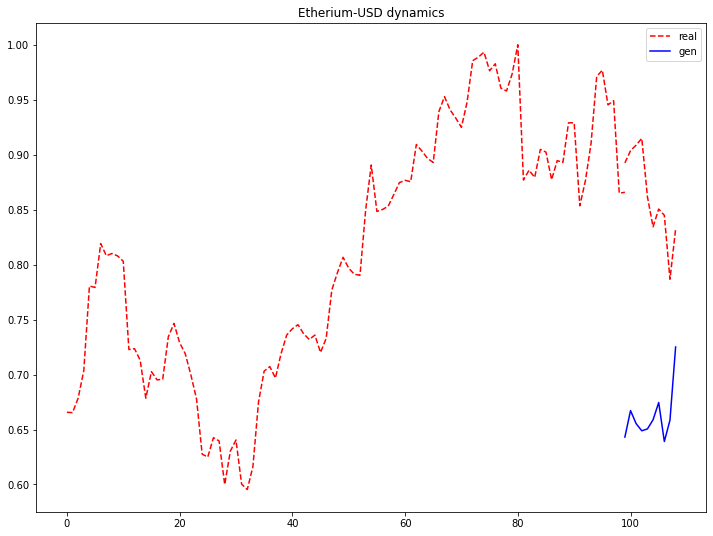

D_loss: 0.9998481869697571, G_loss: 3.045267105102539


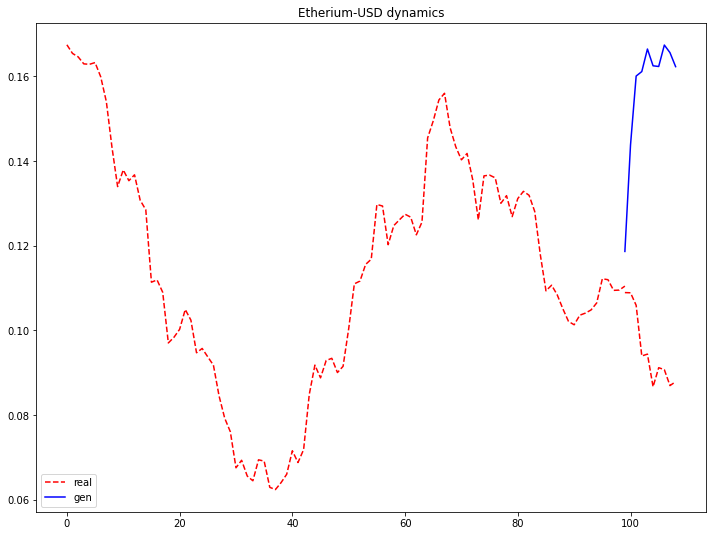

D_loss: 0.9998520612716675, G_loss: 3.0297372341156006


In [ ]:
wgen_w4d_meta, wdisc_w4d_meta = train_mlp(dataloader4d, wgan=1, draw_graphs=1, num_series=4, meta_flag=1)
torch.save(wgen_w4d_meta.state_dict(), PATH + "wgen_w4d_meta")
torch.save(wdisc_w4d_meta.state_dict(), PATH + "wdisc_w4d_meta")

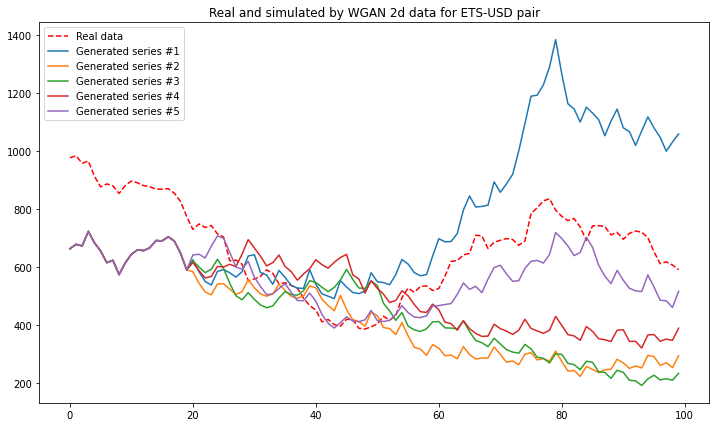

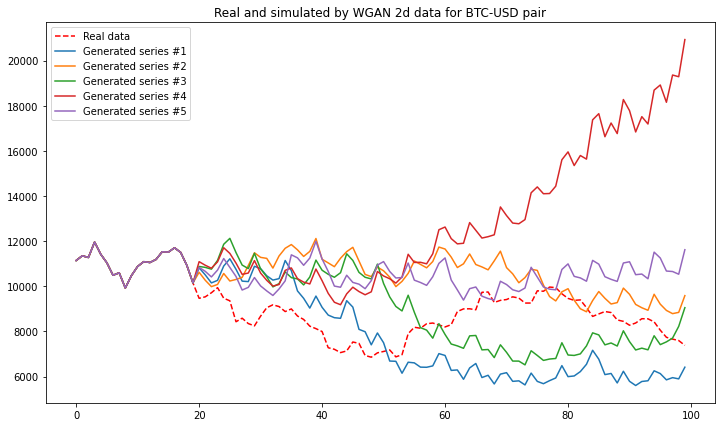

In [ ]:
# da blyat' 
plot_generated_series(ETH_USD_df["High"][100:200],
                      dataset_2d[100][0][None],
                      [eth_min, btc_min], [eth_max, btc_max],
                      gen=gen_w2d,
                      num_steps=16,
                      num_series=2,
                      pair_name="ETS-USD",
                      model_name="WGAN 2d")

plot_generated_series(btc_high[100:200],
                      dataset_2d[100][0][None],
                      [btc_min, eth_min], [btc_max, eth_max],
                      gen=gen_w2d,
                      num_steps=16,
                      num_series=2,
                      pair_name="BTC-USD",
                      model_name="WGAN 2d")

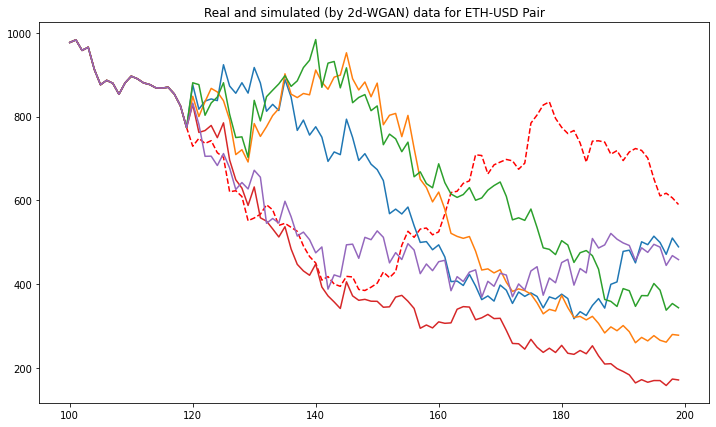

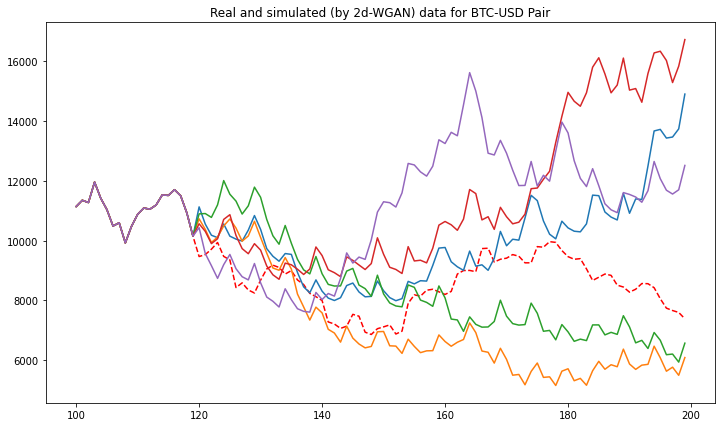

In [ ]:
starting_points = dataset_2d[100][0][None]

plt.figure(figsize=(12, 7))
plt.plot(ETH_USD_df["High"][100:200], color='red', ls='--', lw=1.5)
plt.title("Real and simulated (by 2d-WGAN) data for ETH-USD Pair")

for x in range(5):
    generated_series = generate_series(gen_w2d, starting_points, 
                                       [btc_min, eth_min], [btc_max, eth_max], 16, num_series=2)
    plt.plot(np.arange(100, 200), generated_series[0, 1].detach().numpy())  # Надо придумать, как запихнуть этот костыль в функцию

plt.show()


starting_points = dataset_2d[100][0][None]
plt.figure(figsize=(12, 7))
plt.plot(btc_high[100:200], color='red', ls='--', lw=1.5)
plt.title("Real and simulated (by 2d-WGAN) data for BTC-USD Pair")

for x in range(5):
    generated_series = generate_series(gen_w2d, starting_points, 
                                       [btc_min, eth_min], [btc_max, eth_max], 16, num_series=2)
    plt.plot(np.arange(100, 200), generated_series[0, 0].detach().numpy())


### TODO:
1) **DONE**

2) Поизучать автокорреляции -- графики и т д **DONE**

3) **DONE**

4) БОЛЬШЕ рядов **DONE**

5) Добавить в ряды доп разметку (например, день недели для даты)

6) В лоссе генератора учитывать отличие автокорреляций сгенерированного ганом ряда и автокорреляций того ряда, для которого мы все это дело генерируем **DONE**

7) Подавать в GAN еще и признаки ряда (кроме high еще low и т д). Тут может быть проблема в том, что при текущем подходе нам бы пришлось еще генерировать и признаки, поэтому можно будет генерировать просто сразу на нужное количество дней

8) Проверить, насколько хорошо модель улавливает созависимости между рядами **DONE**